In [62]:
# 该代码用于对 Oryzabase，Gramene，TAS，funRiceGene，SemanticMethods 数据进行统计
# 及整合

# 同时合并Oryzabse 和 TAS中 MSUID 和 其他两种ID的mapping关系
# 基于MSUID进行数据合并

import re
from collections import defaultdict
import matplotlib.pyplot as plt
import sys
import venn

In [63]:
# 几个数据库的合并文件
wf_association = open('../data/Total_Association.txt', 'w')
wf_association.write('RAP\tMSU\tGramene\tTO\tSource\n')

26

In [64]:
# fixme: Oryzabase Statistics
## Gold Database
## Gene: RAP, MSU, Gramene
## Trait: GO, TO, PO

# 基于MSUID进行数据合并
# 统计MSUID和其他ID的对应

Oryzabase_file = '../data/Oryzabase/OryzabaseGeneListEn_20201014010048.sed.txt'

Oryzabase_rap_to_set = set()
Oryzabase_msu_to_set = set()
Oryzabase_gramene_to_set = set()

Oryzabase_rap_to_msu = defaultdict(set)
Oryzabase_msu_to_rap = defaultdict(set)
Oryzabase_msu_to_gramene = defaultdict(set)
Oryzabase_rap_to_gramene = defaultdict(set)

with open(Oryzabase_file, encoding='utf-8') as f:
    f.readline()
    for line in f:
        line = line.strip()
        rap_id_set = set(re.findall(r'Os\d{2}g\d{7}', line))
        msu_id_set = set(re.findall(r'LOC_Os\d{2}g\d{5}', line))
        gramene_id_set = set(re.findall(r'GR:\d{7}', line))
        TO_id_set = set(re.findall(r'TO:\d{7}', line))
        GO_id_set = set(re.findall('GO:\d{7}', line))
        PO_id_set = set(re.findall(r'PO:\d{7}', line))
        
        # 统计三种id和 TO 的关联
        if rap_id_set and TO_id_set:
            for rap in rap_id_set:
                for to in TO_id_set:
                    Oryzabase_rap_to_set.add((rap, to))
        if msu_id_set and TO_id_set:
            for msu in msu_id_set:
                for to in TO_id_set:
                    Oryzabase_msu_to_set.add((msu, to))
        if gramene_id_set and TO_id_set:
            for gramene in gramene_id_set:
                for to in TO_id_set:
                    Oryzabase_gramene_to_set.add((gramene, to))
                    
        # 统计 MSU-RAP, MSU-Gramene, RAP-Gramene mapping.
        if msu_id_set and rap_id_set:
            for msu in msu_id_set:
                Oryzabase_msu_to_rap[msu].update(rap_id_set)
            for rap in rap_id_set:
                Oryzabase_rap_to_msu[rap].update(msu_id_set)
        if msu_id_set and gramene_id_set:
            for msu in msu_id_set:
                Oryzabase_msu_to_gramene[msu].update(gramene_id_set)
        if rap_id_set and gramene_id_set:
            for rap in rap_id_set:
                Oryzabase_rap_to_gramene[rap ].update(gramene_id_set)


print(f'Original Oryzabase MSU-TO Pair Count: {len(Oryzabase_msu_to_set):,}')
print(f'Original Oryzabase RAP-TO Pair Count: {len(Oryzabase_rap_to_set):,}')
print(f'Original Oryzabase Gramene-TO Pair Count: {len(Oryzabase_gramene_to_set):,}')
print()
print(f'Oryzabase MSU-RAP Mapping Count: {len(Oryzabase_msu_to_rap):,}')
print(f'Oryzabase MSU-Gramene Mapping Count: {len(Oryzabase_msu_to_gramene):,}')
#print(f'Oryzabase RAP-MSU Mapping Count: {len(Oryzabase_rap_to_msu):,}')
#print(f'Oryzabase RAP-Gramene Mapping Count: {len(Oryzabase_rap_to_gramene):,}')

Original Oryzabase MSU-TO Pair Count: 14,695
Original Oryzabase RAP-TO Pair Count: 14,914
Original Oryzabase Gramene-TO Pair Count: 3,404

Oryzabase MSU-RAP Mapping Count: 12,232
Oryzabase MSU-Gramene Mapping Count: 389


In [65]:
# 统计 RAPDB MSU-RAPID的关联
## RAPDB: RAP-MSU
## Oryzabase: RAP-MSU-Gramene

rap_db_mapping_file = '../data/database-RAPDB/RAP-MSU_2020-09-09.txt'
oryzabase_mapping_file = '../data/database-OryzaBase/OryzabaseGeneListEn_20201014010048.sed.txt'
RAPDB_Oryzabase_merge_file = '../data/database-Merge/RAPDB-Oryzabase.merge.txt'

RAPDB_msu_to_rap = defaultdict(set)
RAPDB_rap_to_msu = defaultdict(set)

with open(rap_db_mapping_file) as f:
    for line in f:
        rap_set = set(re.findall(r'Os\d{2}g\d{7}', line))
        msu_set = set(re.findall(r'LOC_Os\d{2}g\d{5}', line))
        
        if rap_set and msu_set:
            for msu in msu_set:
                RAPDB_msu_to_rap[msu].update(rap_set)
        if rap_set and msu_set:
            for rap in rap_set:
                RAPDB_rap_to_msu[rap].update(msu_set)

print(f'RAP-DB MSU-RAP Mapping Count: {len(RAPDB_msu_to_rap):,}')
#print(f'RAP-DB RAP-MSU Mapping Count: {len(RAPDB_rap_to_msu):,}')

RAP-DB MSU-RAP Mapping Count: 32,831


d:\pto_env_test\lib\site-packages\ipykernel_launcher.py:18: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


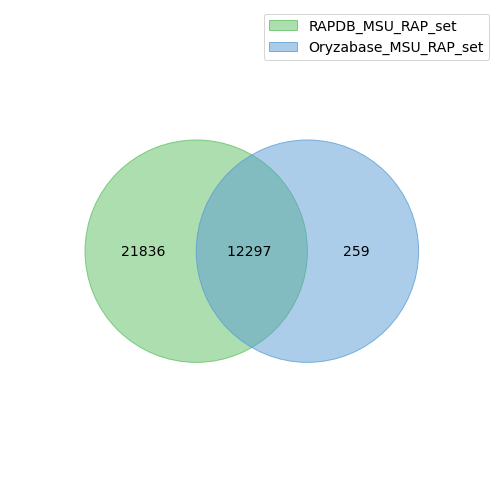

In [66]:
# 统计Oryzabase数据库和RAP_DB数据库中 MSU-RAP的覆盖情况

rapdb_msu_rap_set = set()
oryzabase_msu_rap_set = set()

for msu, rap_set in Oryzabase_msu_to_rap.items():
    for rap in rap_set:
        oryzabase_msu_rap_set.add((msu, rap))
    
for msu, rap_set in RAPDB_msu_to_rap.items():
    for rap in rap_set:
        rapdb_msu_rap_set.add((msu, rap))
    

labels = venn.get_labels([rapdb_msu_rap_set, oryzabase_msu_rap_set],
                         fill=['number'])
fig, ax = venn.venn2(labels, names=['RAPDB_MSU_RAP_set', 'Oryzabase_MSU_RAP_set'])
fig.show()

In [67]:
# 合并Oryzabase 和 RAPDB数据库中的MSU-RAP
rapdb_oryzabase_msu_rap_dict = defaultdict(set)

for msu, rap_set in Oryzabase_msu_to_rap.items():
    rapdb_oryzabase_msu_rap_dict[msu].update(rap_set)
    
for msu, rap_set in RAPDB_msu_to_rap.items():
    rapdb_oryzabase_msu_rap_dict[msu].update(rap_set)
    
    
print(f'rapdb: {len(RAPDB_msu_to_rap):,}, oryzabase: {len(Oryzabase_msu_to_rap):,}, merge: {len(rapdb_oryzabase_msu_rap_dict):,}')

rapdb: 32,831, oryzabase: 12,232, merge: 32,915


In [68]:
# 开始数据融合

In [69]:
# 写入Oryzabase的数据
Oryzabase_file = '../data/Oryzabase/OryzabaseGeneListEn_20201014010048.sed.txt'
oryzabase_save_count = 0


with open(Oryzabase_file, encoding='utf-8') as f:
    f.readline()
    for line in f:
        line = line.strip()
        
        rap_id_set = set(re.findall(r'Os\d{2}g\d{7}', line))
        msu_id_set = set(re.findall(r'LOC_Os\d{2}g\d{5}', line))
        gramene_id_set = set(re.findall(r'GR:\d{7}', line))
        
        TO_id_set = set(re.findall(r'TO:\d{7}', line))
        GO_id_set = set(re.findall('GO:\d{7}', line))
        PO_id_set = set(re.findall(r'PO:\d{7}', line))
        
        # 添加RAPDB数据库的对应
        #print(msu_id_set)
        for msu in msu_id_set:
            rap_id_set.update(rapdb_oryzabase_msu_rap_dict[msu])
        
            gramene_id_set.update(Oryzabase_msu_to_gramene[msu])
        
        rap_wf= ",".join(rap_id_set) if rap_id_set else 'Noun'
        msu_wf= ",".join(msu_id_set) if msu_id_set else 'Noun'
        gramene_wf= ",".join(gramene_id_set) if gramene_id_set else 'Noun'
        
        if TO_id_set and (rap_id_set or gramene_id_set or msu_id_set):
            wf_association.write(f'{rap_wf}\t{msu_wf}\t{gramene_wf}\t{",".join(TO_id_set)}\tOryzabase\n')
            print(f'{rap_wf}\t{msu_wf}\t{gramene_wf}\t{",".join(TO_id_set)}\tOryzabase\n')
        oryzabase_save_count += 1
print(f'save oryzabase terms: {oryzabase_save_count:,}')

Noun	Noun	GR:0060167	TO:0000232	Oryzabase

Noun	Noun	GR:0060144	TO:0000232	Oryzabase

Noun	Noun	GR:0060145	TO:0000232	Oryzabase

Noun	Noun	GR:0060146	TO:0000232	Oryzabase

Noun	Noun	GR:0060147	TO:0000232	Oryzabase

Noun	Noun	GR:0060151	TO:0000232	Oryzabase

Noun	Noun	GR:0060152	TO:0000232	Oryzabase

Noun	Noun	GR:0060153	TO:0000232	Oryzabase

Noun	Noun	GR:0060154	TO:0000280,TO:0000303,TO:0000232	Oryzabase

Noun	Noun	GR:0060155	TO:0000232	Oryzabase

Noun	Noun	GR:0060156	TO:0000232	Oryzabase

Noun	Noun	GR:0060158	TO:0000232	Oryzabase

Noun	Noun	GR:0060159	TO:0000232	Oryzabase

Noun	Noun	GR:0060162	TO:0000232	Oryzabase

Noun	Noun	GR:0060163	TO:0000232	Oryzabase

Noun	Noun	GR:0060164	TO:0000232	Oryzabase

Noun	Noun	GR:0060160	TO:0000232	Oryzabase

Noun	Noun	GR:0060161	TO:0000232	Oryzabase

Noun	Noun	GR:0060166	TO:0000232	Oryzabase

Noun	Noun	GR:0060003	TO:0000137	Oryzabase

Noun	Noun	GR:0060016	TO:0000487,TO:0000098,TO:0000196,TO:0000587	Oryzabase

Noun	Noun	GR:0060017	TO:0000487,TO:0000098


Noun	Noun	GR:0060766	TO:0000370,TO:0000492,TO:0000085	Oryzabase

Noun	Noun	GR:0060212	TO:0000085,TO:0000370,TO:0000576,TO:0000346,TO:0000207	Oryzabase

Os11g0102100,Os12g0101600	LOC_Os12g01120	GR:0060567	TO:0002675,TO:0000276,TO:0000655,TO:0000402,TO:0006001,TO:0000370,TO:0001013,TO:0000346,TO:0000656,TO:0000166,TO:0000149,TO:0000657,TO:0000784,TO:0000492	Oryzabase

Noun	Noun	GR:0060927	TO:0000576	Oryzabase

Noun	Noun	GR:0060824	TO:0000042,TO:0000358,TO:0000437	Oryzabase

Noun	Noun	GR:0060629	TO:0000468,TO:0000470,TO:0000477	Oryzabase

Noun	Noun	GR:0060879	TO:0000064	Oryzabase

Os01g0527600	LOC_Os01g34350	GR:0060880	TO:0000615,TO:0000274,TO:0000064,TO:0000164,TO:0000432,TO:0002718,TO:0000148	Oryzabase

Noun	Noun	GR:0060881	TO:0000064	Oryzabase

Os03g0449200	LOC_Os03g33650	GR:0060882	TO:0000064,TO:0006064,TO:0000206,TO:0002681	Oryzabase

Noun	Noun	GR:0060991	TO:0000299,TO:0000495,TO:0000426,TO:0000326	Oryzabase

Noun	Noun	GR:0060393	TO:0000490	Oryzabase

Noun	Noun	GR:0060173	TO:0000335


Os09g0522200	LOC_Os09g35030	Noun	TO:0000276,TO:0006001,TO:0000164,TO:0000172,TO:0000166,TO:0000303	Oryzabase

Os09g0522000	LOC_Os09g35010	Noun	TO:0000276,TO:0006001,TO:0000172,TO:0000166,TO:0000303	Oryzabase

Os01g0165000	LOC_Os01g07120	Noun	TO:0000615,TO:0000276,TO:0006001,TO:0000058,TO:0000303	Oryzabase

Os06g0127100	LOC_Os06g03670	Noun	TO:0000615,TO:0000276,TO:0006001,TO:0000114,TO:0000303	Oryzabase

Os03g0856700	LOC_Os03g63970	GR:0061383	TO:0000592,TO:0002759,TO:0000447,TO:0000397,TO:0000152,TO:0000599,TO:0000455,TO:0000291,TO:0000040,TO:0000396,TO:0000207,TO:0000590,TO:0000357,TO:0000557,TO:0000734	Oryzabase

Os01g0854500	LOC_Os01g63510	Noun	TO:0000276,TO:0000167,TO:0006001,TO:0000620,TO:0000303,TO:0000401	Oryzabase

Os12g0122000	LOC_Os12g02870	GR:0080035	TO:0000566	Oryzabase

Os07g0586900	LOC_Os07g39820	Noun	TO:0000566,TO:0000656	Oryzabase

Os02g0622100	LOC_Os02g40860	GR:0080020	TO:0000615,TO:0000163,TO:0000206,TO:0000084,TO:0000227,TO:0000656,TO:0000257,TO:0002672,TO:0000303,TO


Os07g0585700	LOC_Os07g39700	GR:0060859	TO:0000615,TO:0000253,TO:0000619	Oryzabase

Os07g0685000	LOC_Os07g48570	Noun	TO:0000074,TO:0000164	Oryzabase

Os03g0169600	LOC_Os03g07360	Noun	TO:0000460,TO:0000276	Oryzabase

Os02g0726300	LOC_Os02g49440	Noun	TO:0000432	Oryzabase

Os02g0707200	LOC_Os02g47810	Noun	TO:0006005,TO:0000300,TO:0000346,TO:0000227,TO:0000175,TO:0000328,TO:0000207,TO:0006032	Oryzabase

Os03g0764900	LOC_Os03g55610	Noun	TO:0000592,TO:0006001,TO:0000456,TO:0000227,TO:0000173,TO:0000040,TO:0000557,TO:0000434,TO:0002660,TO:0002692,TO:0000975,TO:0000734,TO:0000145,TO:0000050,TO:0000656,TO:0000207,TO:0000371,TO:0000373,TO:0000396,TO:0006032	Oryzabase

Os03g0284100	LOC_Os03g17570	Noun	TO:0000137	Oryzabase

Os11g0547000	LOC_Os11g34460	Noun	TO:0002616	Oryzabase

Os06g0147800	LOC_Os06g05520	Noun	TO:0006001,TO:0000160,TO:0000175	Oryzabase

Os06g0473200	LOC_Os06g27890	Noun	TO:0000253,TO:0000175	Oryzabase

Os02g0787300	LOC_Os02g54600	Noun	TO:0000163,TO:0000040,TO:0002677,TO:0000970,TO:

Os01g0719300	LOC_Os01g52130	Noun	TO:0000276,TO:0006001,TO:0000653,TO:0000034,TO:0000203	Oryzabase

Os09g0240500	LOC_Os09g06499	Noun	TO:0006001,TO:0000653,TO:0000034,TO:0000276	Oryzabase

Os01g0645900	LOC_Os01g45830	Noun	TO:0006001,TO:0000653,TO:0000034,TO:0000276	Oryzabase

Os08g0101500	LOC_Os08g01120	Noun	TO:0000025,TO:0000276,TO:0006001,TO:0000653,TO:0000034,TO:0006056,TO:0000303	Oryzabase

Os03g0319300	LOC_Os03g20370	Noun	TO:0006001,TO:0000696,TO:0000328	Oryzabase

Os02g0276500	LOC_Os02g17650	Noun	TO:0002657	Oryzabase

Os10g0555600	LOC_Os10g40700	Noun	TO:0000207	Oryzabase

Os08g0191700	LOC_Os08g09250	Noun	TO:0000168,TO:0000021	Oryzabase

Os01g0667200	LOC_Os01g47690	Noun	TO:0000615,TO:0000394,TO:0000429,TO:0002657,TO:0000172,TO:0000432	Oryzabase

Os03g0332400	LOC_Os03g21460	Noun	TO:0006001,TO:0000168	Oryzabase

Os05g0125000	LOC_Os05g03430	Noun	TO:0000615,TO:0000146,TO:0000276,TO:0006001,TO:0000259,TO:0000180,TO:0000346,TO:0000455,TO:0000342,TO:0000166,TO:0000207	Oryzabase

Os03g07191


Os02g0106100	LOC_Os02g01590	Noun	TO:0000300,TO:0000391,TO:0000653,TO:0000397,TO:0000307,TO:0000328,TO:0000590,TO:0000657,TO:0000696	Oryzabase

Os02g0534400	LOC_Os02g33110	Noun	TO:0006001,TO:0000074	Oryzabase

Os01g0659400	LOC_Os01g46984	Noun	TO:0000820,TO:0000370,TO:0000303	Oryzabase

Os01g0213800	LOC_Os01g11550	Noun	TO:0006001,TO:0000276	Oryzabase

Os01g0755500	LOC_Os01g55100	Noun	TO:0006001,TO:0000276	Oryzabase

Os12g0616400	LOC_Os12g42190	Noun	TO:0000303	Oryzabase

Os11g0175700	LOC_Os11g07460	Noun	TO:0006001,TO:0000276	Oryzabase

Os02g0733300	LOC_Os02g50040	Noun	TO:0000068	Oryzabase

Os06g0256900	LOC_Os06g14540	Noun	TO:0000068	Oryzabase

Os08g0114200	LOC_Os08g02220	Noun	TO:0000068	Oryzabase

Os05g0196500	LOC_Os05g10770	Noun	TO:0000621,TO:0006032	Oryzabase

Os01g0937050	LOC_Os01g71080	Noun	TO:0000640,TO:0000472,TO:0000304,TO:0000145,TO:0000911,TO:0000370,TO:0000576,TO:0000181,TO:0002655,TO:0000227,TO:0000656,TO:0006036,TO:0000207,TO:0020108,TO:0006032,TO:0006047,TO:0000484	Oryzabase


Os03g0265500	Noun	Noun	TO:0000163	Oryzabase

Os04g0623901	Noun	Noun	TO:0000748,TO:0002616,TO:0000137,TO:0006020	Oryzabase

Os02g0194400,Os03g0738400,Os07g0490400	Noun	Noun	TO:0000160,TO:0000615,TO:0000276,TO:0000163,TO:0000021,TO:0006001,TO:0006059,TO:0000315,TO:0000303	Oryzabase

Os01g0923900	Noun	Noun	TO:0000163,TO:0000206,TO:0000829,TO:0000074,TO:0002688	Oryzabase

Os03g0738400,Os03g0743900	Noun	Noun	TO:0000303	Oryzabase

Os03g0738400,Os03g0743900	Noun	Noun	TO:0000303	Oryzabase

Os02g0701300	Noun	Noun	TO:0000397,TO:0000074,TO:0000303,TO:0000396	Oryzabase

Os05g0458600	LOC_Os05g38420	Noun	TO:0000605,TO:0000180	Oryzabase

Os05g0458600	LOC_Os05g38420	Noun	TO:0000605,TO:0000180	Oryzabase

Os03g0110800,Os02g0612800,Os10g0572400,Os02g0666200,Os05g0548100,Os11g0127000	Noun	Noun	TO:0006001,TO:0000259,TO:0000276	Oryzabase

Os03g0110800,Os02g0612800,Os10g0572400,Os02g0666200,Os05g0548100,Os11g0127000	Noun	Noun	TO:0006001,TO:0000276,TO:0000259	Oryzabase

Os03g0110800,Os02g0612800,Os10g0572400


Os12g0133050	LOC_Os12g03880	Noun	TO:0000432	Oryzabase

Os05g0155100	LOC_Os05g06310	Noun	TO:0000432	Oryzabase

Os12g0567700	LOC_Os12g38000	Noun	TO:0000276,TO:0000259,TO:0002657,TO:0000172,TO:0000175,TO:0000432,TO:0000303	Oryzabase

Os04g0605900	LOC_Os04g51630	Noun	TO:0000432	Oryzabase

Os05g0565000	LOC_Os05g49030	Noun	TO:0000276,TO:0000259,TO:0000172,TO:0000175,TO:0000432,TO:0000303	Oryzabase

Os05g0368300	LOC_Os05g30530	Noun	TO:0000615,TO:0000276,TO:0006001,TO:0002657,TO:0000175,TO:0000432	Oryzabase

Os09g0551600	LOC_Os09g37910	Noun	TO:0000432	Oryzabase

Os03g0356700	LOC_Os03g24220	Noun	TO:0002693,TO:0000432,TO:0002672	Oryzabase

Os03g0335300	LOC_Os03g21720	Noun	TO:0000432	Oryzabase

Os02g0469600	LOC_Os02g27030	Noun	TO:0000432	Oryzabase

Os03g0213100	LOC_Os03g11440	Noun	TO:0000432	Oryzabase

Os04g0450100	LOC_Os04g37710	Noun	TO:0000432	Oryzabase

Os03g0429800	LOC_Os03g31550	Noun	TO:0000276,TO:0000382,TO:0000249,TO:0000605,TO:0000460,TO:0000259,TO:0000975,TO:0000455,TO:0000432,TO:000037

Os10g0573400	LOC_Os10g42280	Noun	TO:0000253	Oryzabase

Os05g0457200	LOC_Os05g38290	Noun	TO:0000615	Oryzabase

Os03g0268600	LOC_Os03g16170	Noun	TO:0000615,TO:0000021	Oryzabase

Os01g0164600	LOC_Os01g07090	Noun	TO:0000075	Oryzabase

Os01g0618200	LOC_Os01g43100	Noun	TO:0000303	Oryzabase

Os01g0656200	LOC_Os01g46760	Noun	TO:0006001	Oryzabase

Os02g0149800	LOC_Os02g05630	Noun	TO:0000095,TO:0000276,TO:0006001,TO:0002657,TO:0000172,TO:0000303	Oryzabase

Os05g0537400	LOC_Os05g46040	Noun	TO:0000131,TO:0000615	Oryzabase

Os05g0572700	LOC_Os05g49730	Noun	TO:0000615	Oryzabase

Os05g0592800	LOC_Os05g51510	Noun	TO:0000615,TO:0002665,TO:0000276,TO:0000145,TO:0000131,TO:0000566,TO:0000656,TO:0000043,TO:0000303	Oryzabase

Os07g0507000	LOC_Os07g32380	Noun	TO:0020102	Oryzabase

Os12g0615400	LOC_Os12g42090	Noun	TO:0006001	Oryzabase

Os10g0567400	LOC_Os10g41780	Noun	TO:0000249,TO:0000063,TO:0000259,TO:0001027,TO:0000020,TO:0000148,TO:0000495,TO:0000326	Oryzabase

Os02g0702000	LOC_Os02g47360	Noun	TO:0000316


Os09g0327575,Os09g0327600	LOC_Os09g15840	GR:0060632,GR:0060631	TO:0000074	Oryzabase

Os01g0763700,Os01g0763750	LOC_Os01g55799	Noun	TO:0000424	Oryzabase

Os04g0603200	LOC_Os04g51400	Noun	TO:0006001,TO:0000276	Oryzabase

Os06g0192100	LOC_Os06g09240	Noun	TO:0000707	Oryzabase

Os04g0662600	LOC_Os04g56700	Noun	TO:0000707	Oryzabase

Os10g0536400	LOC_Os10g39140	Noun	TO:0000290,TO:0000653,TO:0001109	Oryzabase

Os07g0214900	LOC_Os07g11440	Noun	TO:0000290,TO:0000160	Oryzabase

Os03g0410000	Noun	Noun	TO:0000707,TO:0000071	Oryzabase

Os01g0633500	Noun	Noun	TO:0000707,TO:0000071	Oryzabase

Os03g0369100	LOC_Os03g25350	Noun	TO:0000280,TO:0000382,TO:0000653,TO:0000266,TO:0000180,TO:0000162,TO:0000620,TO:0000604	Oryzabase

Os09g0358600	LOC_Os09g19390	Noun	TO:0000276	Oryzabase

Os09g0358700	LOC_Os09g19400	Noun	TO:0000276	Oryzabase

Os04g0117100	LOC_Os04g02670	Noun	TO:0000276	Oryzabase

Os08g0299800	LOC_Os08g20486	Noun	TO:0000276	Oryzabase

Os10g0343600	LOC_Os10g20280	Noun	TO:0000276	Oryzabase

Os11g011


Os06g0669400	LOC_Os06g45820	Noun	TO:0000615,TO:0000249	Oryzabase

Os01g0618800	LOC_Os01g43150	Noun	TO:0000303	Oryzabase

Os08g0154600	LOC_Os08g05840	Noun	TO:0001013,TO:0001012,TO:0000656	Oryzabase

Os09g0280600	LOC_Os09g10850	Noun	TO:0000218,TO:0000358,TO:0000437,TO:0000416,TO:0000485,TO:0000455,TO:0000729	Oryzabase

Os10g0462800	LOC_Os10g32540	Noun	TO:0006060,TO:0000295,TO:0000293,TO:0000326	Oryzabase

Os01g0192300	LOC_Os01g09640	Noun	TO:0002616,TO:0006021,TO:0000461,TO:0000396	Oryzabase

Os05g0411200	LOC_Os05g34040	Noun	TO:0000293,TO:0000655,TO:0000069,TO:0000295,TO:0002715,TO:0000207,TO:0006060,TO:0000303,TO:0000326	Oryzabase

Os07g0627000	LOC_Os07g43390	Noun	TO:0002658	Oryzabase

Os02g0755000	LOC_Os02g51860	Noun	TO:0000615,TO:0000095,TO:0000276,TO:0000163,TO:0000249,TO:0006001,TO:0001013,TO:0000058,TO:0002667,TO:0002668,TO:0000495,TO:0000656,TO:0020003,TO:0000396,TO:0000207,TO:0000328,TO:0000303,TO:0020004	Oryzabase

Os03g0214200	LOC_Os03g11550	Noun	TO:0000615,TO:0000276	Oryzabase


Os06g0666100	LOC_Os06g45540	Noun	TO:0000456,TO:0002759,TO:0000447,TO:0000734	Oryzabase

Os01g0829800	LOC_Os01g61380	Noun	TO:0006001	Oryzabase

Os03g0114800	LOC_Os03g02380	Noun	TO:0006059,TO:0020096	Oryzabase

Os12g0443000	LOC_Os12g25660	Noun	TO:0006001	Oryzabase

Os01g0804200	LOC_Os01g59000	Noun	TO:0006001	Oryzabase

Os06g0691400	LOC_Os06g47620	Noun	TO:0006001	Oryzabase

Os04g0692600	LOC_Os04g59610	Noun	TO:0000010	Oryzabase

Os03g0168400	LOC_Os03g07220	Noun	TO:0002655,TO:0000942,TO:0000104	Oryzabase

Os05g0567300	LOC_Os05g49220	Noun	TO:0002715,TO:0000069	Oryzabase

Os09g0571200	LOC_Os09g39770	Noun	TO:0006001,TO:0000526	Oryzabase

Os07g0592000	LOC_Os07g40240	Noun	TO:0000397,TO:0000449,TO:0000396,TO:0000166,TO:0000207	Oryzabase

Os06g0633500	LOC_Os06g42700	Noun	TO:0006001,TO:0000430,TO:0000276	Oryzabase

Os01g0524100	LOC_Os01g34010	Noun	TO:0000036,TO:0000358,TO:0000180	Oryzabase

Os01g0814800	LOC_Os01g59920	Noun	TO:0002715,TO:0000326	Oryzabase

Os01g0856900	LOC_Os01g63810	Noun	TO:000009

In [70]:
# 统计TAS 数据
# 原始的 TAS数据只有 MSU iD
TAS_file = '../data/database-TAS/TAS.association.tsv'

# 原始数据
TAS_msu_to_set = set()

# todo: 利用Oryzabase扩充数据
TAS_rap_to_set = set()
TAS_gramene_to_set = set()

msu_set = set()
to_set = set()
TAS_save_count = 0
with open(TAS_file) as f:
    f.readline()
    f.readline()
    for line in f:
        
        l = line.strip().split('\t')
        msu = l[2]
        to_id = l[-1]
        
        # 检查每一行是否只包含一个MSU和一个TO
        #if len(msu)>14:
        #    print(l)
        #if len(to)> 10:
        #    print(l)
        
        rap_wf = ','.join(rapdb_oryzabase_msu_rap_dict[msu]) if rapdb_oryzabase_msu_rap_dict[msu] else "Noun"
        gramene_wf =  ','.join(Oryzabase_msu_to_gramene[msu]) if Oryzabase_msu_to_gramene[msu] else "Noun"   
        
        TAS_save_count += 1
        wf_association.write(f'{rap_wf}\t{msu}\t{gramene_wf}\t{to_id}\tTAS\n')
        print(f'{rap_wf}\t{msu}\t{gramene_wf}\t{to_id}\tTAS\n')
        
        msu_set.add(msu)
        to_set.add(to_id)
        
        TAS_msu_to_set.add((msu, to_id))

print(f'TAS database MSU-TO association: {len(TAS_msu_to_set):,}.')
print(f'TAS Save Count: {TAS_save_count}')

Noun	LOC_Os01g01810	Noun	TO:0000017	TAS

Noun	LOC_Os01g01810	Noun	TO:0000839	TAS

Noun	LOC_Os01g01810	Noun	TO:0000837	TAS

Noun	LOC_Os01g01810	Noun	TO:0000754	TAS

Noun	LOC_Os01g01810	Noun	TO:0000829	TAS

Noun	LOC_Os01g01810	Noun	TO:0002720	TAS

Os01g0108200	LOC_Os01g01830	Noun	TO:0000017	TAS

Os01g0108200	LOC_Os01g01830	Noun	TO:0000839	TAS

Os01g0108200	LOC_Os01g01830	Noun	TO:0000837	TAS

Os01g0108200	LOC_Os01g01830	Noun	TO:0000754	TAS

Os01g0108200	LOC_Os01g01830	Noun	TO:0000829	TAS

Os01g0108200	LOC_Os01g01830	Noun	TO:0002720	TAS

Os01g0109366	LOC_Os01g01925	Noun	TO:0000277	TAS

Os01g0109366	LOC_Os01g01925	Noun	TO:0000465	TAS

Os01g0109366	LOC_Os01g01925	Noun	TO:0020092	TAS

Os01g0109366	LOC_Os01g01925	Noun	TO:0006052	TAS

Os01g0109200	LOC_Os01g01930	Noun	TO:0000277	TAS

Os01g0109200	LOC_Os01g01930	Noun	TO:0000465	TAS

Os01g0109200	LOC_Os01g01930	Noun	TO:0020092	TAS

Os01g0109200	LOC_Os01g01930	Noun	TO:0006052	TAS

Os01g0109500	LOC_Os01g01940	Noun	TO:0000277	TAS

Os01g0109500	LOC_Os


Noun	LOC_Os01g09050	Noun	TO:0000050	TAS

Noun	LOC_Os01g09050	Noun	TO:0002751	TAS

Os01g0185900	LOC_Os01g09080	Noun	TO:0000597	TAS

Os01g0185900	LOC_Os01g09080	Noun	TO:0000706	TAS

Noun	LOC_Os01g09090	Noun	TO:0000597	TAS

Noun	LOC_Os01g09090	Noun	TO:0000706	TAS

Os01g0186000	LOC_Os01g09100	Noun	TO:0000597	TAS

Os01g0186000	LOC_Os01g09100	Noun	TO:0000706	TAS

Noun	LOC_Os01g09110	Noun	TO:0000597	TAS

Noun	LOC_Os01g09110	Noun	TO:0000706	TAS

Os01g0186200	LOC_Os01g09120	Noun	TO:0000597	TAS

Os01g0186200	LOC_Os01g09120	Noun	TO:0000706	TAS

Os01g0186400	LOC_Os01g09130	Noun	TO:0000357	TAS

Os01g0186400	LOC_Os01g09130	Noun	TO:0000933	TAS

Os01g0186400	LOC_Os01g09130	Noun	TO:0001021	TAS

Os01g0186400	LOC_Os01g09130	Noun	TO:0000137	TAS

Os01g0186400	LOC_Os01g09140	Noun	TO:0000357	TAS

Os01g0186400	LOC_Os01g09140	Noun	TO:0000933	TAS

Os01g0186400	LOC_Os01g09140	Noun	TO:0001021	TAS

Os01g0186400	LOC_Os01g09140	Noun	TO:0000137	TAS

Os01g0186500	LOC_Os01g09150	Noun	TO:0000357	TAS

Os01g0186500	LOC_O

Os01g0248800	LOC_Os01g14640	Noun	TO:0000283	TAS

Os01g0248800	LOC_Os01g14640	Noun	TO:0000349	TAS

Os01g0248800	LOC_Os01g14640	Noun	TO:0012001	TAS

Os01g0248900	LOC_Os01g14650	Noun	TO:0000277	TAS

Os01g0248900	LOC_Os01g14650	Noun	TO:0000283	TAS

Os01g0248900	LOC_Os01g14650	Noun	TO:0000349	TAS

Os01g0248900	LOC_Os01g14650	Noun	TO:0012001	TAS

Os01g0275200	LOC_Os01g16850	Noun	TO:0000017	TAS

Os01g0275200	LOC_Os01g16850	Noun	TO:0000839	TAS

Os01g0275200	LOC_Os01g16850	Noun	TO:0000836	TAS

Os01g0275200	LOC_Os01g16850	Noun	TO:0002629	TAS

Os01g0275200	LOC_Os01g16850	Noun	TO:0002626	TAS

Os01g0275200	LOC_Os01g16850	Noun	TO:0000734	TAS

Os01g0275500	LOC_Os01g16860	Noun	TO:0000017	TAS

Os01g0275500	LOC_Os01g16860	Noun	TO:0000839	TAS

Os01g0275500	LOC_Os01g16860	Noun	TO:0000836	TAS

Os01g0275500	LOC_Os01g16860	Noun	TO:0002629	TAS

Os01g0275500	LOC_Os01g16860	Noun	TO:0002626	TAS

Os01g0275500	LOC_Os01g16860	Noun	TO:0000734	TAS

Os01g0275600	LOC_Os01g16870	Noun	TO:0000017	TAS

Os01g0275600	LOC_Os0


Noun	LOC_Os01g39136	Noun	TO:0000839	TAS

Noun	LOC_Os01g39136	Noun	TO:0000836	TAS

Noun	LOC_Os01g39136	Noun	TO:0002629	TAS

Noun	LOC_Os01g39136	Noun	TO:0002746	TAS

Noun	LOC_Os01g39136	Noun	TO:0000919	TAS

Os01g0572800	LOC_Os01g39150	Noun	TO:0000017	TAS

Os01g0572800	LOC_Os01g39150	Noun	TO:0000839	TAS

Os01g0572800	LOC_Os01g39150	Noun	TO:0000836	TAS

Os01g0572800	LOC_Os01g39150	Noun	TO:0002629	TAS

Os01g0572800	LOC_Os01g39150	Noun	TO:0002746	TAS

Os01g0572800	LOC_Os01g39150	Noun	TO:0000919	TAS

Noun	LOC_Os01g39160	Noun	TO:0000017	TAS

Noun	LOC_Os01g39160	Noun	TO:0000839	TAS

Noun	LOC_Os01g39160	Noun	TO:0000836	TAS

Noun	LOC_Os01g39160	Noun	TO:0002629	TAS

Noun	LOC_Os01g39160	Noun	TO:0002746	TAS

Noun	LOC_Os01g39160	Noun	TO:0000919	TAS

Noun	LOC_Os01g39170	Noun	TO:0000017	TAS

Noun	LOC_Os01g39170	Noun	TO:0000839	TAS

Noun	LOC_Os01g39170	Noun	TO:0000836	TAS

Noun	LOC_Os01g39170	Noun	TO:0002629	TAS

Noun	LOC_Os01g39170	Noun	TO:0002746	TAS

Noun	LOC_Os01g39170	Noun	TO:0000919	TAS

Os01g057

Noun	LOC_Os01g45780	Noun	TO:0000074	TAS

Os01g0645400	LOC_Os01g45760	Noun	TO:0000277	TAS

Os01g0645400	LOC_Os01g45760	Noun	TO:0000465	TAS

Os01g0645400	LOC_Os01g45760	Noun	TO:0006056	TAS

Noun	LOC_Os01g45770	Noun	TO:0000277	TAS

Noun	LOC_Os01g45770	Noun	TO:0000465	TAS

Noun	LOC_Os01g45770	Noun	TO:0006056	TAS

Noun	LOC_Os01g45780	Noun	TO:0000277	TAS

Noun	LOC_Os01g45780	Noun	TO:0000465	TAS

Noun	LOC_Os01g45780	Noun	TO:0006056	TAS

Noun	LOC_Os01g45790	Noun	TO:0000277	TAS

Noun	LOC_Os01g45790	Noun	TO:0000465	TAS

Noun	LOC_Os01g45790	Noun	TO:0006056	TAS

Noun	LOC_Os01g45800	Noun	TO:0000357	TAS

Noun	LOC_Os01g45800	Noun	TO:0000933	TAS

Noun	LOC_Os01g45800	Noun	TO:0001021	TAS

Noun	LOC_Os01g45800	Noun	TO:0000137	TAS

Noun	LOC_Os01g45810	Noun	TO:0000357	TAS

Noun	LOC_Os01g45810	Noun	TO:0000933	TAS

Noun	LOC_Os01g45810	Noun	TO:0001021	TAS

Noun	LOC_Os01g45810	Noun	TO:0000137	TAS

Noun	LOC_Os01g45820	Noun	TO:0000357	TAS

Noun	LOC_Os01g45820	Noun	TO:0000933	TAS

Noun	LOC_Os01g45820	Noun	TO:00010


Os01g0769700	LOC_Os01g56330	Noun	TO:0000207	TAS

Noun	LOC_Os01g56340	Noun	TO:0000017	TAS

Noun	LOC_Os01g56340	Noun	TO:0000839	TAS

Noun	LOC_Os01g56340	Noun	TO:0000398	TAS

Noun	LOC_Os01g56340	Noun	TO:1000012	TAS

Noun	LOC_Os01g56340	Noun	TO:0000207	TAS

Os01g0770100	LOC_Os01g56370	Noun	TO:0000017	TAS

Os01g0770100	LOC_Os01g56370	Noun	TO:0000839	TAS

Os01g0770100	LOC_Os01g56370	Noun	TO:0000836	TAS

Os01g0770100	LOC_Os01g56370	Noun	TO:0002629	TAS

Os01g0770100	LOC_Os01g56370	Noun	TO:0002626	TAS

Os01g0770100	LOC_Os01g56370	Noun	TO:0000734	TAS

Os01g0770200	LOC_Os01g56380	Noun	TO:0000017	TAS

Os01g0770200	LOC_Os01g56380	Noun	TO:0000839	TAS

Os01g0770200	LOC_Os01g56380	Noun	TO:0000836	TAS

Os01g0770200	LOC_Os01g56380	Noun	TO:0002629	TAS

Os01g0770200	LOC_Os01g56380	Noun	TO:0002626	TAS

Os01g0770200	LOC_Os01g56380	Noun	TO:0000734	TAS

Os01g0770400	LOC_Os01g56390	Noun	TO:0000017	TAS

Os01g0770400	LOC_Os01g56390	Noun	TO:0000839	TAS

Os01g0770400	LOC_Os01g56390	Noun	TO:0000836	TAS

Os01g07704


Noun	LOC_Os01g63130	Noun	TO:0001021	TAS

Noun	LOC_Os01g63130	Noun	TO:0000137	TAS

Noun	LOC_Os01g63140	Noun	TO:0000357	TAS

Noun	LOC_Os01g63140	Noun	TO:0000933	TAS

Noun	LOC_Os01g63140	Noun	TO:0001021	TAS

Noun	LOC_Os01g63140	Noun	TO:0000137	TAS

Os01g0850200	LOC_Os01g63150	Noun	TO:0000357	TAS

Os01g0850200	LOC_Os01g63150	Noun	TO:0000933	TAS

Os01g0850200	LOC_Os01g63150	Noun	TO:0001021	TAS

Os01g0850200	LOC_Os01g63150	Noun	TO:0000137	TAS

Noun	LOC_Os01g63530	Noun	TO:0000017	TAS

Noun	LOC_Os01g63530	Noun	TO:0000839	TAS

Noun	LOC_Os01g63530	Noun	TO:0000836	TAS

Noun	LOC_Os01g63530	Noun	TO:0000184	TAS

Noun	LOC_Os01g63530	Noun	TO:0000345	TAS

Noun	LOC_Os01g63530	Noun	TO:0000202	TAS

Os01g0854800	LOC_Os01g63540	Noun	TO:0000017	TAS

Os01g0854800	LOC_Os01g63540	Noun	TO:0000839	TAS

Os01g0854800	LOC_Os01g63540	Noun	TO:0000836	TAS

Os01g0854800	LOC_Os01g63540	Noun	TO:0000184	TAS

Os01g0854800	LOC_Os01g63540	Noun	TO:0000345	TAS

Os01g0854800	LOC_Os01g63540	Noun	TO:0000202	TAS

Noun	LOC_Os01g635


Os01g0949400	LOC_Os01g72090	Noun	TO:0012001	TAS

Os01g0949500	LOC_Os01g72100	Noun	TO:0000277	TAS

Os01g0949500	LOC_Os01g72100	Noun	TO:0000283	TAS

Os01g0949500	LOC_Os01g72100	Noun	TO:0000349	TAS

Os01g0949500	LOC_Os01g72100	Noun	TO:0012001	TAS

Noun	LOC_Os01g72110	Noun	TO:0000277	TAS

Noun	LOC_Os01g72110	Noun	TO:0000283	TAS

Noun	LOC_Os01g72110	Noun	TO:0000349	TAS

Noun	LOC_Os01g72110	Noun	TO:0012001	TAS

Os01g0952500	LOC_Os01g72330	GR:0020058	TO:0000597	TAS

Os01g0952500	LOC_Os01g72330	GR:0020058	TO:0002728	TAS

Os01g0952500	LOC_Os01g72330	GR:0020058	TO:0000162	TAS

Os01g0952500	LOC_Os01g72330	GR:0020058	TO:0000144	TAS

Os01g0952600	LOC_Os01g72340	Noun	TO:0000597	TAS

Os01g0952600	LOC_Os01g72340	Noun	TO:0002728	TAS

Os01g0952600	LOC_Os01g72340	Noun	TO:0000162	TAS

Os01g0952600	LOC_Os01g72340	Noun	TO:0000144	TAS

Os01g0952700	LOC_Os01g72350	Noun	TO:0000597	TAS

Os01g0952700	LOC_Os01g72350	Noun	TO:0002728	TAS

Os01g0952700	LOC_Os01g72350	Noun	TO:0000162	TAS

Os01g0952700	LOC_Os01g72350


Os02g0149900	LOC_Os02g05640	Noun	TO:0000829	TAS

Os02g0149900	LOC_Os02g05640	Noun	TO:0002690	TAS

Os02g0150000	LOC_Os02g05650	Noun	TO:0000017	TAS

Os02g0150000	LOC_Os02g05650	Noun	TO:0000839	TAS

Os02g0150000	LOC_Os02g05650	Noun	TO:0000837	TAS

Os02g0150000	LOC_Os02g05650	Noun	TO:0000754	TAS

Os02g0150000	LOC_Os02g05650	Noun	TO:0000829	TAS

Os02g0150000	LOC_Os02g05650	Noun	TO:0002690	TAS

Os02g0150100	LOC_Os02g05660	Noun	TO:0000017	TAS

Os02g0150100	LOC_Os02g05660	Noun	TO:0000839	TAS

Os02g0150100	LOC_Os02g05660	Noun	TO:0000837	TAS

Os02g0150100	LOC_Os02g05660	Noun	TO:0000754	TAS

Os02g0150100	LOC_Os02g05660	Noun	TO:0000829	TAS

Os02g0150100	LOC_Os02g05660	Noun	TO:0002690	TAS

Os02g0150200	LOC_Os02g05670	Noun	TO:0000017	TAS

Os02g0150200	LOC_Os02g05670	Noun	TO:0000839	TAS

Os02g0150200	LOC_Os02g05670	Noun	TO:0000837	TAS

Os02g0150200	LOC_Os02g05670	Noun	TO:0000754	TAS

Os02g0150200	LOC_Os02g05670	Noun	TO:0000829	TAS

Os02g0150200	LOC_Os02g05670	Noun	TO:0002690	TAS

Os02g0150300	LOC_Os

Noun	LOC_Os02g14360	Noun	TO:0000017	TAS

Noun	LOC_Os02g14360	Noun	TO:0000839	TAS

Noun	LOC_Os02g14360	Noun	TO:0000836	TAS

Noun	LOC_Os02g14360	Noun	TO:0000184	TAS

Noun	LOC_Os02g14360	Noun	TO:0000181	TAS

Noun	LOC_Os02g14360	Noun	TO:0000382	TAS

Noun	LOC_Os02g14370	Noun	TO:0000017	TAS

Noun	LOC_Os02g14370	Noun	TO:0000839	TAS

Noun	LOC_Os02g14370	Noun	TO:0000836	TAS

Noun	LOC_Os02g14370	Noun	TO:0000184	TAS

Noun	LOC_Os02g14370	Noun	TO:0000181	TAS

Noun	LOC_Os02g14370	Noun	TO:0000382	TAS

Os02g0241100	LOC_Os02g14480	Noun	TO:0000357	TAS

Os02g0241100	LOC_Os02g14480	Noun	TO:0000928	TAS

Os02g0241100	LOC_Os02g14480	Noun	TO:0000654	TAS

Os02g0241100	LOC_Os02g14480	Noun	TO:0006027	TAS

Os02g0241100	LOC_Os02g14480	Noun	TO:0000582	TAS

Os02g0241100	LOC_Os02g14480	Noun	TO:0000456	TAS

Os02g0241200	LOC_Os02g14490	Noun	TO:0000357	TAS

Os02g0241200	LOC_Os02g14490	Noun	TO:0000928	TAS

Os02g0241200	LOC_Os02g14490	Noun	TO:0000654	TAS

Os02g0241200	LOC_Os02g14490	Noun	TO:0006027	TAS

Os02g0241200	LOC_O


Noun	LOC_Os02g23827	Noun	TO:0002626	TAS

Noun	LOC_Os02g23827	Noun	TO:0000734	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO:0000371	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO:0000327	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO:0000352	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO:0000552	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO:0000636	TAS

Os02g0438601	LOC_Os02g24205	Noun	TO:0000371	TAS

Os02g0438601	LOC_Os02g24205	Noun	TO:0000327	TAS

Os02g0438601	LOC_Os02g24205	Noun	TO:0000352	TAS

Os02g0438601	LOC_Os02g24205	Noun	TO:0000552	TAS

Os02g0438601	LOC_Os02g24205	Noun	TO:0000636	TAS

Os02g0438700	LOC_Os02g24210	Noun	TO:0000371	TAS

Os02g0438700	LOC_Os02g24210	Noun	TO:0000327	TAS

Os02g0438700	LOC_Os02g24210	Noun	TO:0000352	TAS

Os02g0438700	LOC_Os02g24210	Noun	TO:0000552	TAS

Os02g0438700	LOC_Os02g24210	Noun	TO:0000636	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO:0000017	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO:0000839	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO:0000840	TAS

Os02g0438200	LOC_Os02g24190	Noun	TO

Os02g0617700	LOC_Os02g40460	Noun	TO:0000391	TAS

Os02g0617700	LOC_Os02g40460	Noun	TO:0000149	TAS

Noun	LOC_Os02g40470	Noun	TO:0000017	TAS

Noun	LOC_Os02g40470	Noun	TO:0000839	TAS

Noun	LOC_Os02g40470	Noun	TO:0000836	TAS

Noun	LOC_Os02g40470	Noun	TO:0000184	TAS

Noun	LOC_Os02g40470	Noun	TO:0000391	TAS

Noun	LOC_Os02g40470	Noun	TO:0000149	TAS

Os02g0618100	LOC_Os02g40500	Noun	TO:0000357	TAS

Os02g0618100	LOC_Os02g40500	Noun	TO:0000933	TAS

Os02g0618100	LOC_Os02g40500	Noun	TO:0002616	TAS

Os02g0618100	LOC_Os02g40500	Noun	TO:0000344	TAS

Os02g0618100	LOC_Os02g40500	Noun	TO:0000629	TAS

Os02g0618200	LOC_Os02g40510	Noun	TO:0000357	TAS

Os02g0618200	LOC_Os02g40510	Noun	TO:0000933	TAS

Os02g0618200	LOC_Os02g40510	Noun	TO:0002616	TAS

Os02g0618200	LOC_Os02g40510	Noun	TO:0000344	TAS

Os02g0618200	LOC_Os02g40510	Noun	TO:0000629	TAS

Os02g0618250	LOC_Os02g40514	Noun	TO:0000357	TAS

Os02g0618250	LOC_Os02g40514	Noun	TO:0000933	TAS

Os02g0618250	LOC_Os02g40514	Noun	TO:0002616	TAS

Os02g0618250	LOC_Os


Os02g0652100	LOC_Os02g43560	Noun	TO:0000928	TAS

Os02g0652100	LOC_Os02g43560	Noun	TO:0000654	TAS

Os02g0652100	LOC_Os02g43560	Noun	TO:0006027	TAS

Os02g0652100	LOC_Os02g43560	Noun	TO:0000622	TAS

Os02g0652100	LOC_Os02g43560	Noun	TO:0000670	TAS

Noun	LOC_Os02g43570	Noun	TO:0000357	TAS

Noun	LOC_Os02g43570	Noun	TO:0000928	TAS

Noun	LOC_Os02g43570	Noun	TO:0000654	TAS

Noun	LOC_Os02g43570	Noun	TO:0006027	TAS

Noun	LOC_Os02g43570	Noun	TO:0000622	TAS

Noun	LOC_Os02g43570	Noun	TO:0000670	TAS

Noun	LOC_Os02g43530	Noun	TO:0000017	TAS

Noun	LOC_Os02g43530	Noun	TO:0000839	TAS

Noun	LOC_Os02g43530	Noun	TO:0000837	TAS

Noun	LOC_Os02g43530	Noun	TO:0000754	TAS

Noun	LOC_Os02g43530	Noun	TO:0000829	TAS

Noun	LOC_Os02g43530	Noun	TO:0002723	TAS

Os02g0651900	LOC_Os02g43540	Noun	TO:0000017	TAS

Os02g0651900	LOC_Os02g43540	Noun	TO:0000839	TAS

Os02g0651900	LOC_Os02g43540	Noun	TO:0000837	TAS

Os02g0651900	LOC_Os02g43540	Noun	TO:0000754	TAS

Os02g0651900	LOC_Os02g43540	Noun	TO:0000829	TAS

Os02g0651900	LOC_


Os02g0815200	LOC_Os02g57010	Noun	TO:0000017	TAS

Os02g0815200	LOC_Os02g57010	Noun	TO:0000839	TAS

Os02g0815200	LOC_Os02g57010	Noun	TO:0000837	TAS

Os02g0815200	LOC_Os02g57010	Noun	TO:0000754	TAS

Os02g0815200	LOC_Os02g57010	Noun	TO:0000829	TAS

Os02g0815200	LOC_Os02g57010	Noun	TO:0002720	TAS

Os02g0815300	LOC_Os02g57020	Noun	TO:0000017	TAS

Os02g0815300	LOC_Os02g57020	Noun	TO:0000839	TAS

Os02g0815300	LOC_Os02g57020	Noun	TO:0000837	TAS

Os02g0815300	LOC_Os02g57020	Noun	TO:0000754	TAS

Os02g0815300	LOC_Os02g57020	Noun	TO:0000829	TAS

Os02g0815300	LOC_Os02g57020	Noun	TO:0002720	TAS

Os02g0815400	LOC_Os02g57030	Noun	TO:0000017	TAS

Os02g0815400	LOC_Os02g57030	Noun	TO:0000839	TAS

Os02g0815400	LOC_Os02g57030	Noun	TO:0000837	TAS

Os02g0815400	LOC_Os02g57030	Noun	TO:0000754	TAS

Os02g0815400	LOC_Os02g57030	Noun	TO:0000829	TAS

Os02g0815400	LOC_Os02g57030	Noun	TO:0002720	TAS

Os02g0815500	LOC_Os02g57040	Noun	TO:0000017	TAS

Os02g0815500	LOC_Os02g57040	Noun	TO:0000839	TAS

Os02g0815500	LOC_Os

Noun	LOC_Os03g04540	Noun	TO:0000168	TAS

Noun	LOC_Os03g04540	Noun	TO:0000432	TAS

Noun	LOC_Os03g04540	Noun	TO:0000303	TAS

Os03g0138400	LOC_Os03g04545	Noun	TO:0000164	TAS

Os03g0138400	LOC_Os03g04545	Noun	TO:0000168	TAS

Os03g0138400	LOC_Os03g04545	Noun	TO:0000432	TAS

Os03g0138400	LOC_Os03g04545	Noun	TO:0000303	TAS

Os03g0138500	LOC_Os03g04550	Noun	TO:0000164	TAS

Os03g0138500	LOC_Os03g04550	Noun	TO:0000168	TAS

Os03g0138500	LOC_Os03g04550	Noun	TO:0000432	TAS

Os03g0138500	LOC_Os03g04550	Noun	TO:0000303	TAS

Os03g0138900	LOC_Os03g04580	Noun	TO:0000017	TAS

Os03g0138900	LOC_Os03g04580	Noun	TO:0000839	TAS

Os03g0138900	LOC_Os03g04580	Noun	TO:0000840	TAS

Os03g0138900	LOC_Os03g04580	Noun	TO:0000842	TAS

Os03g0138900	LOC_Os03g04580	Noun	TO:0000077	TAS

Os03g0138900	LOC_Os03g04580	Noun	TO:0001004	TAS

Os03g0139100	LOC_Os03g04590	Noun	TO:0000017	TAS

Os03g0139100	LOC_Os03g04590	Noun	TO:0000839	TAS

Os03g0139100	LOC_Os03g04590	Noun	TO:0000840	TAS

Os03g0139100	LOC_Os03g04590	Noun	TO:0000842	

Os03g0231800	LOC_Os03g12910	Noun	TO:0000017	TAS

Os03g0231800	LOC_Os03g12910	Noun	TO:0000839	TAS

Os03g0231800	LOC_Os03g12910	Noun	TO:0000837	TAS

Os03g0231800	LOC_Os03g12910	Noun	TO:0000754	TAS

Os03g0231800	LOC_Os03g12910	Noun	TO:0000829	TAS

Os03g0231800	LOC_Os03g12910	Noun	TO:0002720	TAS

Os03g0231900	LOC_Os03g12930	Noun	TO:0000371	TAS

Os03g0231900	LOC_Os03g12930	Noun	TO:0000456	TAS

Os03g0231900	LOC_Os03g12930	Noun	TO:0000565	TAS

Os03g0232000,Os03g0231950	LOC_Os03g12940	Noun	TO:0000371	TAS

Os03g0232000,Os03g0231950	LOC_Os03g12940	Noun	TO:0000456	TAS

Os03g0232000,Os03g0231950	LOC_Os03g12940	Noun	TO:0000565	TAS

Os03g0232101	LOC_Os03g12945	Noun	TO:0000371	TAS

Os03g0232101	LOC_Os03g12945	Noun	TO:0000456	TAS

Os03g0232101	LOC_Os03g12945	Noun	TO:0000565	TAS

Os03g0232200	LOC_Os03g12950	Noun	TO:0000371	TAS

Os03g0232200	LOC_Os03g12950	Noun	TO:0000456	TAS

Os03g0232200	LOC_Os03g12950	Noun	TO:0000565	TAS

Os03g0231900	LOC_Os03g12930	Noun	TO:0000277	TAS

Os03g0231900	LOC_Os03g12930	No


Os03g0362032	LOC_Os03g24710	Noun	TO:0000017	TAS

Os03g0362032	LOC_Os03g24710	Noun	TO:0000839	TAS

Os03g0362032	LOC_Os03g24710	Noun	TO:0000836	TAS

Os03g0362032	LOC_Os03g24710	Noun	TO:0002629	TAS

Os03g0362032	LOC_Os03g24710	Noun	TO:0002626	TAS

Os03g0362032	LOC_Os03g24710	Noun	TO:0000734	TAS

Os03g0362032	LOC_Os03g24720	Noun	TO:0000017	TAS

Os03g0362032	LOC_Os03g24720	Noun	TO:0000839	TAS

Os03g0362032	LOC_Os03g24720	Noun	TO:0000836	TAS

Os03g0362032	LOC_Os03g24720	Noun	TO:0002629	TAS

Os03g0362032	LOC_Os03g24720	Noun	TO:0002626	TAS

Os03g0362032	LOC_Os03g24720	Noun	TO:0000734	TAS

Os03g0361700,Os03g0361866	LOC_Os03g24690	Noun	TO:0002627	TAS

Os03g0361700,Os03g0361866	LOC_Os03g24690	Noun	TO:0000975	TAS

Os03g0362032	LOC_Os03g24710	Noun	TO:0002627	TAS

Os03g0362032	LOC_Os03g24710	Noun	TO:0000975	TAS

Os03g0362032	LOC_Os03g24720	Noun	TO:0002627	TAS

Os03g0362032	LOC_Os03g24720	Noun	TO:0000975	TAS

Os03g0363700	LOC_Os03g24880	Noun	TO:0000017	TAS

Os03g0363700	LOC_Os03g24880	Noun	TO:000083


Os03g0576400	LOC_Os03g37950	Noun	TO:0002629	TAS

Os03g0576400	LOC_Os03g37950	Noun	TO:0002626	TAS

Os03g0576400	LOC_Os03g37950	Noun	TO:0000734	TAS

Os03g0576500	LOC_Os03g37954	Noun	TO:0000017	TAS

Os03g0576500	LOC_Os03g37954	Noun	TO:0000839	TAS

Os03g0576500	LOC_Os03g37954	Noun	TO:0000836	TAS

Os03g0576500	LOC_Os03g37954	Noun	TO:0002629	TAS

Os03g0576500	LOC_Os03g37954	Noun	TO:0002626	TAS

Os03g0576500	LOC_Os03g37954	Noun	TO:0000734	TAS

Os03g0576600	LOC_Os03g37960	Noun	TO:0000017	TAS

Os03g0576600	LOC_Os03g37960	Noun	TO:0000839	TAS

Os03g0576600	LOC_Os03g37960	Noun	TO:0000836	TAS

Os03g0576600	LOC_Os03g37960	Noun	TO:0002629	TAS

Os03g0576600	LOC_Os03g37960	Noun	TO:0002626	TAS

Os03g0576600	LOC_Os03g37960	Noun	TO:0000734	TAS

Os03g0576700	LOC_Os03g37970	Noun	TO:0000017	TAS

Os03g0576700	LOC_Os03g37970	Noun	TO:0000839	TAS

Os03g0576700	LOC_Os03g37970	Noun	TO:0000836	TAS

Os03g0576700	LOC_Os03g37970	Noun	TO:0002629	TAS

Os03g0576700	LOC_Os03g37970	Noun	TO:0002626	TAS

Os03g0576700	LOC_Os

Noun	LOC_Os03g48730	Noun	TO:0000975	TAS

Os03g0693600	LOC_Os03g48740	Noun	TO:0002627	TAS

Os03g0693600	LOC_Os03g48740	Noun	TO:0000975	TAS

Os03g0693700	LOC_Os03g48750	Noun	TO:0002627	TAS

Os03g0693700	LOC_Os03g48750	Noun	TO:0000975	TAS

Os03g0693800	LOC_Os03g48760	Noun	TO:0002627	TAS

Os03g0693800	LOC_Os03g48760	Noun	TO:0000975	TAS

Noun	LOC_Os03g49000	Noun	TO:0000277	TAS

Noun	LOC_Os03g49000	Noun	TO:0000465	TAS

Noun	LOC_Os03g49000	Noun	TO:0006056	TAS

Noun	LOC_Os03g49010	Noun	TO:0000277	TAS

Noun	LOC_Os03g49010	Noun	TO:0000465	TAS

Noun	LOC_Os03g49010	Noun	TO:0006056	TAS

Noun	LOC_Os03g49020	Noun	TO:0000277	TAS

Noun	LOC_Os03g49020	Noun	TO:0000465	TAS

Noun	LOC_Os03g49020	Noun	TO:0006056	TAS

Noun	LOC_Os03g49110	Noun	TO:0000277	TAS

Noun	LOC_Os03g49110	Noun	TO:0000465	TAS

Noun	LOC_Os03g49110	Noun	TO:0006056	TAS

Noun	LOC_Os03g49120	Noun	TO:0000277	TAS

Noun	LOC_Os03g49120	Noun	TO:0000465	TAS

Noun	LOC_Os03g49120	Noun	TO:0006056	TAS

Os03g0697833	LOC_Os03g49126	Noun	TO:0000277	TAS

O


Os03g0862200	LOC_Os03g64415	Noun	TO:0000281	TAS

Os03g0862200	LOC_Os03g64415	Noun	TO:0000674	TAS

Os03g0862200	LOC_Os03g64415	Noun	TO:0000495	TAS

Os03g0862200	LOC_Os03g64415	Noun	TO:0000293	TAS

Noun	LOC_Os03g64420	Noun	TO:0000277	TAS

Noun	LOC_Os03g64420	Noun	TO:0000281	TAS

Noun	LOC_Os03g64420	Noun	TO:0000674	TAS

Noun	LOC_Os03g64420	Noun	TO:0000495	TAS

Noun	LOC_Os03g64420	Noun	TO:0000293	TAS

Os03g0862200	LOC_Os03g64415	Noun	TO:0012003	TAS

Noun	LOC_Os03g64420	Noun	TO:0012003	TAS

Os04g0118700	LOC_Os04g02850	Noun	TO:0000017	TAS

Os04g0118700	LOC_Os04g02850	Noun	TO:0000839	TAS

Os04g0118700	LOC_Os04g02850	Noun	TO:0000837	TAS

Os04g0118700	LOC_Os04g02850	Noun	TO:0000754	TAS

Os04g0118700	LOC_Os04g02850	Noun	TO:0000829	TAS

Os04g0118700	LOC_Os04g02850	Noun	TO:0002720	TAS

Os04g0118800	LOC_Os04g02860	Noun	TO:0000017	TAS

Os04g0118800	LOC_Os04g02860	Noun	TO:0000839	TAS

Os04g0118800	LOC_Os04g02860	Noun	TO:0000837	TAS

Os04g0118800	LOC_Os04g02860	Noun	TO:0000754	TAS

Os04g0118800	LOC_O


Noun	LOC_Os04g07230	Noun	TO:0000236	TAS

Noun	LOC_Os04g07230	Noun	TO:0000112	TAS

Noun	LOC_Os04g07230	Noun	TO:0000439	TAS

Noun	LOC_Os04g07230	Noun	TO:0000074	TAS

Noun	LOC_Os04g07240	Noun	TO:0000164	TAS

Noun	LOC_Os04g07240	Noun	TO:0000179	TAS

Noun	LOC_Os04g07240	Noun	TO:0000236	TAS

Noun	LOC_Os04g07240	Noun	TO:0000112	TAS

Noun	LOC_Os04g07240	Noun	TO:0000439	TAS

Noun	LOC_Os04g07240	Noun	TO:0000074	TAS

Os04g0156000	LOC_Os04g07250	Noun	TO:0000164	TAS

Os04g0156000	LOC_Os04g07250	Noun	TO:0000179	TAS

Os04g0156000	LOC_Os04g07250	Noun	TO:0000236	TAS

Os04g0156000	LOC_Os04g07250	Noun	TO:0000112	TAS

Os04g0156000	LOC_Os04g07250	Noun	TO:0000439	TAS

Os04g0156000	LOC_Os04g07250	Noun	TO:0000074	TAS

Os04g0156100,Os04g0156050	LOC_Os04g07260	Noun	TO:0000164	TAS

Os04g0156100,Os04g0156050	LOC_Os04g07260	Noun	TO:0000179	TAS

Os04g0156100,Os04g0156050	LOC_Os04g07260	Noun	TO:0000236	TAS

Os04g0156100,Os04g0156050	LOC_Os04g07260	Noun	TO:0000112	TAS

Os04g0156100,Os04g0156050	LOC_Os04g07260	Noun	T

Os04g0402100	LOC_Os04g32950	Noun	TO:0000839	TAS

Os04g0402100	LOC_Os04g32950	Noun	TO:0000836	TAS

Os04g0402100	LOC_Os04g32950	Noun	TO:0002629	TAS

Os04g0402100	LOC_Os04g32950	Noun	TO:0002626	TAS

Os04g0402100	LOC_Os04g32950	Noun	TO:0000734	TAS

Os04g0401800	LOC_Os04g32930	Noun	TO:0002627	TAS

Os04g0401800	LOC_Os04g32930	Noun	TO:0000975	TAS

Os04g0401900	LOC_Os04g32940	Noun	TO:0002627	TAS

Os04g0401900	LOC_Os04g32940	Noun	TO:0000975	TAS

Os04g0402100	LOC_Os04g32950	Noun	TO:0002627	TAS

Os04g0402100	LOC_Os04g32950	Noun	TO:0000975	TAS

Noun	LOC_Os04g33010	Noun	TO:0000164	TAS

Noun	LOC_Os04g33010	Noun	TO:0000168	TAS

Noun	LOC_Os04g33010	Noun	TO:0000519	TAS

Noun	LOC_Os04g33010	Noun	TO:0000233	TAS

Os04g0413900	LOC_Os04g33760	Noun	TO:0000357	TAS

Os04g0413900	LOC_Os04g33760	Noun	TO:0000928	TAS

Os04g0413900	LOC_Os04g33760	Noun	TO:0000654	TAS

Os04g0413900	LOC_Os04g33760	Noun	TO:0006027	TAS

Os04g0413900	LOC_Os04g33760	Noun	TO:0000050	TAS

Os04g0413900	LOC_Os04g33760	Noun	TO:0000052	TAS

Os0


Os04g0583500	LOC_Os04g49410	Noun	TO:0000344	TAS

Os04g0583500	LOC_Os04g49410	Noun	TO:0000629	TAS

Os04g0583600,Os04g0583550	LOC_Os04g49420	Noun	TO:0000357	TAS

Os04g0583600,Os04g0583550	LOC_Os04g49420	Noun	TO:0000933	TAS

Os04g0583600,Os04g0583550	LOC_Os04g49420	Noun	TO:0002616	TAS

Os04g0583600,Os04g0583550	LOC_Os04g49420	Noun	TO:0000344	TAS

Os04g0583600,Os04g0583550	LOC_Os04g49420	Noun	TO:0000629	TAS

Os04g0583700	LOC_Os04g49430	Noun	TO:0000357	TAS

Os04g0583700	LOC_Os04g49430	Noun	TO:0000933	TAS

Os04g0583700	LOC_Os04g49430	Noun	TO:0002616	TAS

Os04g0583700	LOC_Os04g49430	Noun	TO:0000344	TAS

Os04g0583700	LOC_Os04g49430	Noun	TO:0000629	TAS

Os04g0583800	LOC_Os04g49440	Noun	TO:0000357	TAS

Os04g0583800	LOC_Os04g49440	Noun	TO:0000933	TAS

Os04g0583800	LOC_Os04g49440	Noun	TO:0002616	TAS

Os04g0583800	LOC_Os04g49440	Noun	TO:0000344	TAS

Os04g0583800	LOC_Os04g49440	Noun	TO:0000629	TAS

Os04g0583500	LOC_Os04g49410	Noun	TO:0000017	TAS

Os04g0583500	LOC_Os04g49410	Noun	TO:0000839	TAS

Os0


Os04g0614650,Os04g0614700	LOC_Os04g52460	Noun	TO:0000754	TAS

Os04g0614650,Os04g0614700	LOC_Os04g52460	Noun	TO:0000829	TAS

Os04g0614650,Os04g0614700	LOC_Os04g52460	Noun	TO:0002690	TAS

Os04g0615000	LOC_Os04g52479	GR:0060565	TO:0000357	TAS

Os04g0615000	LOC_Os04g52479	GR:0060565	TO:0000928	TAS

Os04g0615000	LOC_Os04g52479	GR:0060565	TO:0000654	TAS

Os04g0615000	LOC_Os04g52479	GR:0060565	TO:0006027	TAS

Os04g0615000	LOC_Os04g52479	GR:0060565	TO:0000582	TAS

Os04g0615000	LOC_Os04g52479	GR:0060565	TO:0000456	TAS

Os04g0615100	LOC_Os04g52500	Noun	TO:0000357	TAS

Os04g0615100	LOC_Os04g52500	Noun	TO:0000928	TAS

Os04g0615100	LOC_Os04g52500	Noun	TO:0000654	TAS

Os04g0615100	LOC_Os04g52500	Noun	TO:0006027	TAS

Os04g0615100	LOC_Os04g52500	Noun	TO:0000582	TAS

Os04g0615100	LOC_Os04g52500	Noun	TO:0000456	TAS

Os04g0615200	LOC_Os04g52504	Noun	TO:0000357	TAS

Os04g0615200	LOC_Os04g52504	Noun	TO:0000928	TAS

Os04g0615200	LOC_Os04g52504	Noun	TO:0000654	TAS

Os04g0615200	LOC_Os04g52504	Noun	TO:000602

Os04g0635700	LOC_Os04g54320	Noun	TO:0000357	TAS

Os04g0635700	LOC_Os04g54320	Noun	TO:0000933	TAS

Os04g0635700	LOC_Os04g54320	Noun	TO:0001021	TAS

Os04g0635700	LOC_Os04g54320	Noun	TO:0000137	TAS

Os04g0635800	LOC_Os04g54330	Noun	TO:0000357	TAS

Os04g0635800	LOC_Os04g54330	Noun	TO:0000933	TAS

Os04g0635800	LOC_Os04g54330	Noun	TO:0001021	TAS

Os04g0635800	LOC_Os04g54330	Noun	TO:0000137	TAS

Os04g0635900	LOC_Os04g54340	Noun	TO:0000357	TAS

Os04g0635900	LOC_Os04g54340	Noun	TO:0000933	TAS

Os04g0635900	LOC_Os04g54340	Noun	TO:0001021	TAS

Os04g0635900	LOC_Os04g54340	Noun	TO:0000137	TAS

Os04g0636000	LOC_Os04g54350	Noun	TO:0000357	TAS

Os04g0636000	LOC_Os04g54350	Noun	TO:0000933	TAS

Os04g0636000	LOC_Os04g54350	Noun	TO:0001021	TAS

Os04g0636000	LOC_Os04g54350	Noun	TO:0000137	TAS

Os04g0636100	LOC_Os04g54360	Noun	TO:0000357	TAS

Os04g0636100	LOC_Os04g54360	Noun	TO:0000933	TAS

Os04g0636100	LOC_Os04g54360	Noun	TO:0001021	TAS

Os04g0636100	LOC_Os04g54360	Noun	TO:0000137	TAS

Os04g0636200	LOC_Os0

Noun	LOC_Os05g05050	Noun	TO:0000164	TAS

Noun	LOC_Os05g05050	Noun	TO:0000179	TAS

Noun	LOC_Os05g05050	Noun	TO:0000236	TAS

Noun	LOC_Os05g05050	Noun	TO:0000112	TAS

Noun	LOC_Os05g05050	Noun	TO:0000439	TAS

Noun	LOC_Os05g05050	Noun	TO:0000074	TAS

Noun	LOC_Os05g05190	Noun	TO:0000277	TAS

Noun	LOC_Os05g05190	Noun	TO:0000281	TAS

Noun	LOC_Os05g05190	Noun	TO:0000674	TAS

Noun	LOC_Os05g05190	Noun	TO:0000495	TAS

Noun	LOC_Os05g05190	Noun	TO:0012003	TAS

Os05g0144000	LOC_Os05g05200	Noun	TO:0000277	TAS

Os05g0144000	LOC_Os05g05200	Noun	TO:0000281	TAS

Os05g0144000	LOC_Os05g05200	Noun	TO:0000674	TAS

Os05g0144000	LOC_Os05g05200	Noun	TO:0000495	TAS

Os05g0144000	LOC_Os05g05200	Noun	TO:0012003	TAS

Os05g0144100	LOC_Os05g05210	Noun	TO:0000277	TAS

Os05g0144100	LOC_Os05g05210	Noun	TO:0000281	TAS

Os05g0144100	LOC_Os05g05210	Noun	TO:0000674	TAS

Os05g0144100	LOC_Os05g05210	Noun	TO:0000495	TAS

Os05g0144100	LOC_Os05g05210	Noun	TO:0012003	TAS

Os05g0144200	LOC_Os05g05220	Noun	TO:0000277	TAS

Os05g01442

Noun	LOC_Os05g09680	Noun	TO:0000017	TAS

Noun	LOC_Os05g09680	Noun	TO:0000839	TAS

Noun	LOC_Os05g09680	Noun	TO:0000837	TAS

Noun	LOC_Os05g09680	Noun	TO:0000754	TAS

Noun	LOC_Os05g09680	Noun	TO:0000829	TAS

Noun	LOC_Os05g09680	Noun	TO:0002720	TAS

Os05g0190300	LOC_Os05g09740	Noun	TO:0000017	TAS

Os05g0190300	LOC_Os05g09740	Noun	TO:0000839	TAS

Os05g0190300	LOC_Os05g09740	Noun	TO:0000836	TAS

Os05g0190300	LOC_Os05g09740	Noun	TO:0000184	TAS

Os05g0190300	LOC_Os05g09740	Noun	TO:0000391	TAS

Os05g0190300	LOC_Os05g09740	Noun	TO:0000146	TAS

Os05g0190500	LOC_Os05g10210	Noun	TO:0000017	TAS

Os05g0190500	LOC_Os05g10210	Noun	TO:0000839	TAS

Os05g0190500	LOC_Os05g10210	Noun	TO:0000837	TAS

Os05g0190500	LOC_Os05g10210	Noun	TO:0000754	TAS

Os05g0190500	LOC_Os05g10210	Noun	TO:0002636	TAS

Noun	LOC_Os05g10220	Noun	TO:0000017	TAS

Noun	LOC_Os05g10220	Noun	TO:0000839	TAS

Noun	LOC_Os05g10220	Noun	TO:0000837	TAS

Noun	LOC_Os05g10220	Noun	TO:0000754	TAS

Noun	LOC_Os05g10220	Noun	TO:0002636	TAS

Os05g01981


Os05g0438600	LOC_Os05g36270	Noun	TO:0000837	TAS

Os05g0438600	LOC_Os05g36270	Noun	TO:0000754	TAS

Os05g0438600	LOC_Os05g36270	Noun	TO:0000829	TAS

Os05g0438600	LOC_Os05g36270	Noun	TO:0002720	TAS

Os05g0438700	LOC_Os05g36280	Noun	TO:0000017	TAS

Os05g0438700	LOC_Os05g36280	Noun	TO:0000839	TAS

Os05g0438700	LOC_Os05g36280	Noun	TO:0000837	TAS

Os05g0438700	LOC_Os05g36280	Noun	TO:0000754	TAS

Os05g0438700	LOC_Os05g36280	Noun	TO:0000829	TAS

Os05g0438700	LOC_Os05g36280	Noun	TO:0002720	TAS

Os05g0438800	LOC_Os05g36290	Noun	TO:0000017	TAS

Os05g0438800	LOC_Os05g36290	Noun	TO:0000839	TAS

Os05g0438800	LOC_Os05g36290	Noun	TO:0000837	TAS

Os05g0438800	LOC_Os05g36290	Noun	TO:0000754	TAS

Os05g0438800	LOC_Os05g36290	Noun	TO:0000829	TAS

Os05g0438800	LOC_Os05g36290	Noun	TO:0002720	TAS

Os05g0445100	LOC_Os05g37250	Noun	TO:0000017	TAS

Os05g0445100	LOC_Os05g37250	Noun	TO:0000839	TAS

Os05g0445100	LOC_Os05g37250	Noun	TO:0000840	TAS

Os05g0445100	LOC_Os05g37250	Noun	TO:0000842	TAS

Os05g0445100	LOC_Os


Os05g0539150	LOC_Os05g46170	Noun	TO:0000840	TAS

Os05g0539150	LOC_Os05g46170	Noun	TO:0000842	TAS

Os05g0539150	LOC_Os05g46170	Noun	TO:0000077	TAS

Os05g0539150	LOC_Os05g46170	Noun	TO:0001004	TAS

Noun	LOC_Os05g46180	Noun	TO:0000840	TAS

Noun	LOC_Os05g46180	Noun	TO:0000842	TAS

Noun	LOC_Os05g46180	Noun	TO:0000077	TAS

Noun	LOC_Os05g46180	Noun	TO:0001004	TAS

Noun	LOC_Os05g46150	Noun	TO:0000871	TAS

Noun	LOC_Os05g46150	Noun	TO:0000396	TAS

Noun	LOC_Os05g46150	Noun	TO:0002759	TAS

Noun	LOC_Os05g46150	Noun	TO:0000448	TAS

Noun	LOC_Os05g46160	Noun	TO:0000871	TAS

Noun	LOC_Os05g46160	Noun	TO:0000396	TAS

Noun	LOC_Os05g46160	Noun	TO:0002759	TAS

Noun	LOC_Os05g46160	Noun	TO:0000448	TAS

Os05g0539150	LOC_Os05g46170	Noun	TO:0000871	TAS

Os05g0539150	LOC_Os05g46170	Noun	TO:0000396	TAS

Os05g0539150	LOC_Os05g46170	Noun	TO:0002759	TAS

Os05g0539150	LOC_Os05g46170	Noun	TO:0000448	TAS

Noun	LOC_Os05g46180	Noun	TO:0000871	TAS

Noun	LOC_Os05g46180	Noun	TO:0000396	TAS

Noun	LOC_Os05g46180	Noun	TO:00027

Os06g0143900	LOC_Os06g05180	Noun	TO:0000281	TAS

Os06g0143900	LOC_Os06g05180	Noun	TO:0000674	TAS

Os06g0143900	LOC_Os06g05180	Noun	TO:0000495	TAS

Os06g0143900	LOC_Os06g05180	Noun	TO:0000295	TAS

Os06g0144000	LOC_Os06g05190	Noun	TO:0000277	TAS

Os06g0144000	LOC_Os06g05190	Noun	TO:0000281	TAS

Os06g0144000	LOC_Os06g05190	Noun	TO:0000674	TAS

Os06g0144000	LOC_Os06g05190	Noun	TO:0000495	TAS

Os06g0144000	LOC_Os06g05190	Noun	TO:0000295	TAS

Os06g0149700	LOC_Os06g05690	Noun	TO:0000017	TAS

Os06g0149700	LOC_Os06g05690	Noun	TO:0000839	TAS

Os06g0149700	LOC_Os06g05690	Noun	TO:0000836	TAS

Os06g0149700	LOC_Os06g05690	Noun	TO:0002629	TAS

Os06g0149700	LOC_Os06g05690	Noun	TO:0002626	TAS

Os06g0149700	LOC_Os06g05690	Noun	TO:0000734	TAS

Os06g0149900	LOC_Os06g05700	Noun	TO:0000017	TAS

Os06g0149900	LOC_Os06g05700	Noun	TO:0000839	TAS

Os06g0149900	LOC_Os06g05700	Noun	TO:0000836	TAS

Os06g0149900	LOC_Os06g05700	Noun	TO:0002629	TAS

Os06g0149900	LOC_Os06g05700	Noun	TO:0002626	TAS

Os06g0149900	LOC_Os0

Os06g0220800	LOC_Os06g11740	Noun	TO:0000432	TAS

Os06g0220800	LOC_Os06g11740	Noun	TO:0000303	TAS

Os06g0220850	LOC_Os06g11750	Noun	TO:0000164	TAS

Os06g0220850	LOC_Os06g11750	Noun	TO:0000168	TAS

Os06g0220850	LOC_Os06g11750	Noun	TO:0000432	TAS

Os06g0220850	LOC_Os06g11750	Noun	TO:0000303	TAS

Os06g0220900	LOC_Os06g11760	Noun	TO:0000164	TAS

Os06g0220900	LOC_Os06g11760	Noun	TO:0000168	TAS

Os06g0220900	LOC_Os06g11760	Noun	TO:0000432	TAS

Os06g0220900	LOC_Os06g11760	Noun	TO:0000303	TAS

Noun	LOC_Os06g11770	Noun	TO:0000164	TAS

Noun	LOC_Os06g11770	Noun	TO:0000168	TAS

Noun	LOC_Os06g11770	Noun	TO:0000432	TAS

Noun	LOC_Os06g11770	Noun	TO:0000303	TAS

Os06g0221000	LOC_Os06g11780	Noun	TO:0000164	TAS

Os06g0221000	LOC_Os06g11780	Noun	TO:0000168	TAS

Os06g0221000	LOC_Os06g11780	Noun	TO:0000432	TAS

Os06g0221000	LOC_Os06g11780	Noun	TO:0000303	TAS

Noun	LOC_Os06g11850	Noun	TO:0000277	TAS

Noun	LOC_Os06g11850	Noun	TO:0000465	TAS

Noun	LOC_Os06g11850	Noun	TO:0006056	TAS

Os06g0222400	LOC_Os06g11860


Noun	LOC_Os06g19460	Noun	TO:0000933	TAS

Noun	LOC_Os06g19460	Noun	TO:0002616	TAS

Noun	LOC_Os06g19460	Noun	TO:0000344	TAS

Noun	LOC_Os06g19460	Noun	TO:0000629	TAS

Os06g0298400	LOC_Os06g19470	Noun	TO:0000357	TAS

Os06g0298400	LOC_Os06g19470	Noun	TO:0000933	TAS

Os06g0298400	LOC_Os06g19470	Noun	TO:0002616	TAS

Os06g0298400	LOC_Os06g19470	Noun	TO:0000344	TAS

Os06g0298400	LOC_Os06g19470	Noun	TO:0000629	TAS

Noun	LOC_Os06g19930	Noun	TO:0000017	TAS

Noun	LOC_Os06g19930	Noun	TO:0000839	TAS

Noun	LOC_Os06g19930	Noun	TO:0000836	TAS

Noun	LOC_Os06g19930	Noun	TO:0000184	TAS

Noun	LOC_Os06g19930	Noun	TO:0000345	TAS

Noun	LOC_Os06g19930	Noun	TO:0000202	TAS

Noun	LOC_Os06g19940	Noun	TO:0000017	TAS

Noun	LOC_Os06g19940	Noun	TO:0000839	TAS

Noun	LOC_Os06g19940	Noun	TO:0000836	TAS

Noun	LOC_Os06g19940	Noun	TO:0000184	TAS

Noun	LOC_Os06g19940	Noun	TO:0000345	TAS

Noun	LOC_Os06g19940	Noun	TO:0000202	TAS

Noun	LOC_Os06g19950	Noun	TO:0000017	TAS

Noun	LOC_Os06g19950	Noun	TO:0000839	TAS

Noun	LOC_Os06g19

Os06g0585982	LOC_Os06g38650	Noun	TO:0000734	TAS

Os06g0586000	LOC_Os06g38660	Noun	TO:0002626	TAS

Os06g0586000	LOC_Os06g38660	Noun	TO:0000734	TAS

Os06g0586150	LOC_Os06g38670	Noun	TO:0002626	TAS

Os06g0586150	LOC_Os06g38670	Noun	TO:0000734	TAS

Noun	LOC_Os06g38764	Noun	TO:0000017	TAS

Noun	LOC_Os06g38764	Noun	TO:0000839	TAS

Noun	LOC_Os06g38764	Noun	TO:0000398	TAS

Noun	LOC_Os06g38764	Noun	TO:1000012	TAS

Noun	LOC_Os06g38764	Noun	TO:0000207	TAS

Noun	LOC_Os06g38770	Noun	TO:0000017	TAS

Noun	LOC_Os06g38770	Noun	TO:0000839	TAS

Noun	LOC_Os06g38770	Noun	TO:0000398	TAS

Noun	LOC_Os06g38770	Noun	TO:1000012	TAS

Noun	LOC_Os06g38770	Noun	TO:0000207	TAS

Noun	LOC_Os06g38780	Noun	TO:0000017	TAS

Noun	LOC_Os06g38780	Noun	TO:0000839	TAS

Noun	LOC_Os06g38780	Noun	TO:0000398	TAS

Noun	LOC_Os06g38780	Noun	TO:1000012	TAS

Noun	LOC_Os06g38780	Noun	TO:0000207	TAS

Noun	LOC_Os06g38790	Noun	TO:0000017	TAS

Noun	LOC_Os06g38790	Noun	TO:0000839	TAS

Noun	LOC_Os06g38790	Noun	TO:0000398	TAS

Noun	LOC_Os06g387


Os07g0118900	LOC_Os07g02770	Noun	TO:0000352	TAS

Os07g0118900	LOC_Os07g02770	Noun	TO:0000078	TAS

Os07g0118900	LOC_Os07g02770	Noun	TO:0000081	TAS

Os07g0119000	LOC_Os07g02780	Noun	TO:0000371	TAS

Os07g0119000	LOC_Os07g02780	Noun	TO:0000327	TAS

Os07g0119000	LOC_Os07g02780	Noun	TO:0000352	TAS

Os07g0119000	LOC_Os07g02780	Noun	TO:0000078	TAS

Os07g0119000	LOC_Os07g02780	Noun	TO:0000081	TAS

Os07g0119100	LOC_Os07g02790	Noun	TO:0000371	TAS

Os07g0119100	LOC_Os07g02790	Noun	TO:0000327	TAS

Os07g0119100	LOC_Os07g02790	Noun	TO:0000352	TAS

Os07g0119100	LOC_Os07g02790	Noun	TO:0000078	TAS

Os07g0119100	LOC_Os07g02790	Noun	TO:0000081	TAS

Noun	LOC_Os07g02750	Noun	TO:0000017	TAS

Noun	LOC_Os07g02750	Noun	TO:0000839	TAS

Noun	LOC_Os07g02750	Noun	TO:0000840	TAS

Noun	LOC_Os07g02750	Noun	TO:0000842	TAS

Noun	LOC_Os07g02750	Noun	TO:0000985	TAS

Noun	LOC_Os07g02750	Noun	TO:0000084	TAS

Os07g0118800	LOC_Os07g02760	Noun	TO:0000017	TAS

Os07g0118800	LOC_Os07g02760	Noun	TO:0000839	TAS

Os07g0118800	LOC_O

Os07g0243100	LOC_Os07g13950	Noun	TO:0000202	TAS

Noun	LOC_Os07g13960	Noun	TO:0000017	TAS

Noun	LOC_Os07g13960	Noun	TO:0000839	TAS

Noun	LOC_Os07g13960	Noun	TO:0000836	TAS

Noun	LOC_Os07g13960	Noun	TO:0000184	TAS

Noun	LOC_Os07g13960	Noun	TO:0000345	TAS

Noun	LOC_Os07g13960	Noun	TO:0000202	TAS

Os07g0243200	LOC_Os07g13980	GR:0101322	TO:0000017	TAS

Os07g0243200	LOC_Os07g13980	GR:0101322	TO:0000839	TAS

Os07g0243200	LOC_Os07g13980	GR:0101322	TO:0000836	TAS

Os07g0243200	LOC_Os07g13980	GR:0101322	TO:0000184	TAS

Os07g0243200	LOC_Os07g13980	GR:0101322	TO:0000345	TAS

Os07g0243200	LOC_Os07g13980	GR:0101322	TO:0000202	TAS

Os07g0243150	LOC_Os07g13969	Noun	TO:0000017	TAS

Os07g0243150	LOC_Os07g13969	Noun	TO:0000839	TAS

Os07g0243150	LOC_Os07g13969	Noun	TO:0000836	TAS

Os07g0243150	LOC_Os07g13969	Noun	TO:0000184	TAS

Os07g0243150	LOC_Os07g13969	Noun	TO:0000345	TAS

Os07g0243150	LOC_Os07g13969	Noun	TO:0000202	TAS

Os07g0243301	LOC_Os07g13990	Noun	TO:0000017	TAS

Os07g0243301	LOC_Os07g13990	Noun


Os07g0500800	LOC_Os07g31750	Noun	TO:0000839	TAS

Os07g0500800	LOC_Os07g31750	Noun	TO:0000836	TAS

Os07g0500800	LOC_Os07g31750	Noun	TO:0002629	TAS

Os07g0500800	LOC_Os07g31750	Noun	TO:0002626	TAS

Os07g0500800	LOC_Os07g31750	Noun	TO:0000734	TAS

Os07g0501100	LOC_Os07g31770	Noun	TO:0000017	TAS

Os07g0501100	LOC_Os07g31770	Noun	TO:0000839	TAS

Os07g0501100	LOC_Os07g31770	Noun	TO:0000836	TAS

Os07g0501100	LOC_Os07g31770	Noun	TO:0002629	TAS

Os07g0501100	LOC_Os07g31770	Noun	TO:0002626	TAS

Os07g0501100	LOC_Os07g31770	Noun	TO:0000734	TAS

Os07g0501600	LOC_Os07g31810	Noun	TO:0000017	TAS

Os07g0501600	LOC_Os07g31810	Noun	TO:0000839	TAS

Os07g0501600	LOC_Os07g31810	Noun	TO:0000836	TAS

Os07g0501600	LOC_Os07g31810	Noun	TO:0002629	TAS

Os07g0501600	LOC_Os07g31810	Noun	TO:0002746	TAS

Os07g0501600	LOC_Os07g31810	Noun	TO:0000919	TAS

Os07g0501700	LOC_Os07g31830	Noun	TO:0000017	TAS

Os07g0501700	LOC_Os07g31830	Noun	TO:0000839	TAS

Os07g0501700	LOC_Os07g31830	Noun	TO:0000836	TAS

Os07g0501700	LOC_Os

Os07g0571800	LOC_Os07g38410	Noun	TO:0000465	TAS

Os07g0571800	LOC_Os07g38410	Noun	TO:0000607	TAS

Os07g0571900	LOC_Os07g38420	Noun	TO:0000277	TAS

Os07g0571900	LOC_Os07g38420	Noun	TO:0000465	TAS

Os07g0571900	LOC_Os07g38420	Noun	TO:0000607	TAS

Os07g0572000	LOC_Os07g38430	Noun	TO:0000277	TAS

Os07g0572000	LOC_Os07g38430	Noun	TO:0000465	TAS

Os07g0572000	LOC_Os07g38430	Noun	TO:0000607	TAS

Os07g0572100	LOC_Os07g38440	Noun	TO:0000277	TAS

Os07g0572100	LOC_Os07g38440	Noun	TO:0000465	TAS

Os07g0572100	LOC_Os07g38440	Noun	TO:0000607	TAS

Noun	LOC_Os07g38450	Noun	TO:0000277	TAS

Noun	LOC_Os07g38450	Noun	TO:0000465	TAS

Noun	LOC_Os07g38450	Noun	TO:0000607	TAS

Os07g0572300	LOC_Os07g38460	Noun	TO:0000277	TAS

Os07g0572300	LOC_Os07g38460	Noun	TO:0000465	TAS

Os07g0572300	LOC_Os07g38460	Noun	TO:0000607	TAS

Os07g0572400	LOC_Os07g38470	Noun	TO:0000277	TAS

Os07g0572400	LOC_Os07g38470	Noun	TO:0000465	TAS

Os07g0572400	LOC_Os07g38470	Noun	TO:0000607	TAS

Noun	LOC_Os07g38500	Noun	TO:0000017	TAS

Nou

Os07g0668400	LOC_Os07g47220	Noun	TO:0000017	TAS

Os07g0668400	LOC_Os07g47220	Noun	TO:0000839	TAS

Os07g0668400	LOC_Os07g47220	Noun	TO:0000837	TAS

Os07g0668400	LOC_Os07g47220	Noun	TO:0000754	TAS

Os07g0668400	LOC_Os07g47220	Noun	TO:0000829	TAS

Os07g0668400	LOC_Os07g47220	Noun	TO:0002720	TAS

Os07g0668500	LOC_Os07g47230	Noun	TO:0000017	TAS

Os07g0668500	LOC_Os07g47230	Noun	TO:0000839	TAS

Os07g0668500	LOC_Os07g47230	Noun	TO:0000837	TAS

Os07g0668500	LOC_Os07g47230	Noun	TO:0000754	TAS

Os07g0668500	LOC_Os07g47230	Noun	TO:0000829	TAS

Os07g0668500	LOC_Os07g47230	Noun	TO:0002720	TAS

Os07g0668600	LOC_Os07g47240	Noun	TO:0000017	TAS

Os07g0668600	LOC_Os07g47240	Noun	TO:0000839	TAS

Os07g0668600	LOC_Os07g47240	Noun	TO:0000837	TAS

Os07g0668600	LOC_Os07g47240	Noun	TO:0000754	TAS

Os07g0668600	LOC_Os07g47240	Noun	TO:0000829	TAS

Os07g0668600	LOC_Os07g47240	Noun	TO:0002720	TAS

Os07g0676400	LOC_Os07g47950	Noun	TO:0000597	TAS

Os07g0676400	LOC_Os07g47950	Noun	TO:0000706	TAS

Os07g0676600	LOC_Os0

Noun	LOC_Os08g08390	Noun	TO:0000928	TAS

Noun	LOC_Os08g08390	Noun	TO:0000654	TAS

Noun	LOC_Os08g08390	Noun	TO:0006027	TAS

Noun	LOC_Os08g08390	Noun	TO:0000582	TAS

Noun	LOC_Os08g08390	Noun	TO:0000456	TAS

Noun	LOC_Os08g08400	Noun	TO:0000357	TAS

Noun	LOC_Os08g08400	Noun	TO:0000928	TAS

Noun	LOC_Os08g08400	Noun	TO:0000654	TAS

Noun	LOC_Os08g08400	Noun	TO:0006027	TAS

Noun	LOC_Os08g08400	Noun	TO:0000582	TAS

Noun	LOC_Os08g08400	Noun	TO:0000456	TAS

Os08g0184800	LOC_Os08g08592	Noun	TO:0000017	TAS

Os08g0184800	LOC_Os08g08592	Noun	TO:0000839	TAS

Os08g0184800	LOC_Os08g08592	Noun	TO:0000836	TAS

Os08g0184800	LOC_Os08g08592	Noun	TO:0000184	TAS

Os08g0184800	LOC_Os08g08592	Noun	TO:0000345	TAS

Os08g0184800	LOC_Os08g08592	Noun	TO:0000202	TAS

Noun	LOC_Os08g08600	Noun	TO:0000017	TAS

Noun	LOC_Os08g08600	Noun	TO:0000839	TAS

Noun	LOC_Os08g08600	Noun	TO:0000836	TAS

Noun	LOC_Os08g08600	Noun	TO:0000184	TAS

Noun	LOC_Os08g08600	Noun	TO:0000345	TAS

Noun	LOC_Os08g08600	Noun	TO:0000202	TAS

Noun	LOC_

Os08g0431300	LOC_Os08g33440	Noun	TO:0000597	TAS

Os08g0431300	LOC_Os08g33440	Noun	TO:0000706	TAS

Noun	LOC_Os08g33450	Noun	TO:0000597	TAS

Noun	LOC_Os08g33450	Noun	TO:0000706	TAS

Os08g0431500	LOC_Os08g33460	Noun	TO:0000371	TAS

Os08g0431500	LOC_Os08g33460	Noun	TO:0000456	TAS

Os08g0431500	LOC_Os08g33460	Noun	TO:0000565	TAS

Os08g0431600	LOC_Os08g33470	Noun	TO:0000371	TAS

Os08g0431600	LOC_Os08g33470	Noun	TO:0000456	TAS

Os08g0431600	LOC_Os08g33470	Noun	TO:0000565	TAS

Os08g0431700	LOC_Os08g33479	Noun	TO:0000371	TAS

Os08g0431700	LOC_Os08g33479	Noun	TO:0000456	TAS

Os08g0431700	LOC_Os08g33479	Noun	TO:0000565	TAS

Os08g0431900	LOC_Os08g33488	Noun	TO:0000017	TAS

Os08g0431900	LOC_Os08g33488	Noun	TO:0000839	TAS

Os08g0431900	LOC_Os08g33488	Noun	TO:0000836	TAS

Os08g0431900	LOC_Os08g33488	Noun	TO:0002629	TAS

Os08g0431900	LOC_Os08g33488	Noun	TO:0002746	TAS

Os08g0431900	LOC_Os08g33488	Noun	TO:0000919	TAS

Noun	LOC_Os08g33500	Noun	TO:0000017	TAS

Noun	LOC_Os08g33500	Noun	TO:0000839	TAS

Nou

Os08g0545500	LOC_Os08g43210	Noun	TO:0000017	TAS

Os08g0545500	LOC_Os08g43210	Noun	TO:0000839	TAS

Os08g0545500	LOC_Os08g43210	Noun	TO:0000398	TAS

Os08g0545500	LOC_Os08g43210	Noun	TO:1000012	TAS

Os08g0545500	LOC_Os08g43210	Noun	TO:0000207	TAS

Noun	LOC_Os08g43220	Noun	TO:0000017	TAS

Noun	LOC_Os08g43220	Noun	TO:0000839	TAS

Noun	LOC_Os08g43220	Noun	TO:0000398	TAS

Noun	LOC_Os08g43220	Noun	TO:1000012	TAS

Noun	LOC_Os08g43220	Noun	TO:0000207	TAS

Os08g0545700	LOC_Os08g43230	Noun	TO:0000017	TAS

Os08g0545700	LOC_Os08g43230	Noun	TO:0000839	TAS

Os08g0545700	LOC_Os08g43230	Noun	TO:0000398	TAS

Os08g0545700	LOC_Os08g43230	Noun	TO:1000012	TAS

Os08g0545700	LOC_Os08g43230	Noun	TO:0000207	TAS

Os08g0545800	LOC_Os08g43240	Noun	TO:0000017	TAS

Os08g0545800	LOC_Os08g43240	Noun	TO:0000839	TAS

Os08g0545800	LOC_Os08g43240	Noun	TO:0000398	TAS

Os08g0545800	LOC_Os08g43240	Noun	TO:1000012	TAS

Os08g0545800	LOC_Os08g43240	Noun	TO:0000207	TAS

Os08g0545500	LOC_Os08g43200	Noun	TO:0000277	TAS

Os08g054550


Os09g0281700	LOC_Os09g10940	Noun	TO:0002759	TAS

Os09g0281700	LOC_Os09g10940	Noun	TO:0000448	TAS

Os09g0281800	LOC_Os09g10950	Noun	TO:0000871	TAS

Os09g0281800	LOC_Os09g10950	Noun	TO:0000396	TAS

Os09g0281800	LOC_Os09g10950	Noun	TO:0002759	TAS

Os09g0281800	LOC_Os09g10950	Noun	TO:0000448	TAS

Os09g0281900	LOC_Os09g10960	Noun	TO:0000871	TAS

Os09g0281900	LOC_Os09g10960	Noun	TO:0000396	TAS

Os09g0281900	LOC_Os09g10960	Noun	TO:0002759	TAS

Os09g0281900	LOC_Os09g10960	Noun	TO:0000448	TAS

Noun	LOC_Os09g10970	Noun	TO:0000277	TAS

Noun	LOC_Os09g10970	Noun	TO:0000281	TAS

Noun	LOC_Os09g10970	Noun	TO:0020076	TAS

Os09g0282100,Os09g0282300	LOC_Os09g10980	Noun	TO:0000277	TAS

Os09g0282100,Os09g0282300	LOC_Os09g10980	Noun	TO:0000281	TAS

Os09g0282100,Os09g0282300	LOC_Os09g10980	Noun	TO:0020076	TAS

Os09g0282400	LOC_Os09g10990	Noun	TO:0000277	TAS

Os09g0282400	LOC_Os09g10990	Noun	TO:0000281	TAS

Os09g0282400	LOC_Os09g10990	Noun	TO:0020076	TAS

Noun	LOC_Os09g11000	Noun	TO:0000017	TAS

Noun	LOC_Os0


Os09g0347500	LOC_Os09g17830	Noun	TO:0000112	TAS

Os09g0347500	LOC_Os09g17830	Noun	TO:0000439	TAS

Os09g0347500	LOC_Os09g17830	Noun	TO:0000074	TAS

Os09g0347300	LOC_Os09g17810	Noun	TO:0000017	TAS

Os09g0347300	LOC_Os09g17810	Noun	TO:0000839	TAS

Os09g0347300	LOC_Os09g17810	Noun	TO:0000837	TAS

Os09g0347300	LOC_Os09g17810	Noun	TO:0000754	TAS

Os09g0347300	LOC_Os09g17810	Noun	TO:0000829	TAS

Os09g0347300	LOC_Os09g17810	Noun	TO:0002723	TAS

Noun	LOC_Os09g17820	Noun	TO:0000017	TAS

Noun	LOC_Os09g17820	Noun	TO:0000839	TAS

Noun	LOC_Os09g17820	Noun	TO:0000837	TAS

Noun	LOC_Os09g17820	Noun	TO:0000754	TAS

Noun	LOC_Os09g17820	Noun	TO:0000829	TAS

Noun	LOC_Os09g17820	Noun	TO:0002723	TAS

Os09g0347500	LOC_Os09g17830	Noun	TO:0000017	TAS

Os09g0347500	LOC_Os09g17830	Noun	TO:0000839	TAS

Os09g0347500	LOC_Os09g17830	Noun	TO:0000837	TAS

Os09g0347500	LOC_Os09g17830	Noun	TO:0000754	TAS

Os09g0347500	LOC_Os09g17830	Noun	TO:0000829	TAS

Os09g0347500	LOC_Os09g17830	Noun	TO:0002723	TAS

Os09g0349650,Os09g

Os10g0136400	LOC_Os10g04720	Noun	TO:0000327	TAS

Os10g0136400	LOC_Os10g04720	Noun	TO:0000352	TAS

Os10g0136400	LOC_Os10g04720	Noun	TO:0000078	TAS

Os10g0136400	LOC_Os10g04720	Noun	TO:0000081	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0000017	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0000839	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0000837	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0000754	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0000829	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0002690	TAS

Os10g0136200	LOC_Os10g04700	Noun	TO:0000017	TAS

Os10g0136200	LOC_Os10g04700	Noun	TO:0000839	TAS

Os10g0136200	LOC_Os10g04700	Noun	TO:0000837	TAS

Os10g0136200	LOC_Os10g04700	Noun	TO:0000754	TAS

Os10g0136200	LOC_Os10g04700	Noun	TO:0000829	TAS

Os10g0136200	LOC_Os10g04700	Noun	TO:0002690	TAS

Noun	LOC_Os10g04710	Noun	TO:0000017	TAS

Noun	LOC_Os10g04710	Noun	TO:0000839	TAS

Noun	LOC_Os10g04710	Noun	TO:0000837	TAS

Noun	LOC_Os10g04710	Noun	TO:0000754	TAS

Noun	LOC_Os10g04710	Noun	TO:0000829	TAS

Noun	LOC_Os


Os10g0364700	LOC_Os10g22039	Noun	TO:0002720	TAS

Os10g0364900	LOC_Os10g22050	Noun	TO:0000017	TAS

Os10g0364900	LOC_Os10g22050	Noun	TO:0000839	TAS

Os10g0364900	LOC_Os10g22050	Noun	TO:0000837	TAS

Os10g0364900	LOC_Os10g22050	Noun	TO:0000754	TAS

Os10g0364900	LOC_Os10g22050	Noun	TO:0000829	TAS

Os10g0364900	LOC_Os10g22050	Noun	TO:0002720	TAS

Os10g0365001	LOC_Os10g22060	Noun	TO:0000017	TAS

Os10g0365001	LOC_Os10g22060	Noun	TO:0000839	TAS

Os10g0365001	LOC_Os10g22060	Noun	TO:0000837	TAS

Os10g0365001	LOC_Os10g22060	Noun	TO:0000754	TAS

Os10g0365001	LOC_Os10g22060	Noun	TO:0000829	TAS

Os10g0365001	LOC_Os10g22060	Noun	TO:0002720	TAS

Os10g0365200	LOC_Os10g22070	Noun	TO:0000017	TAS

Os10g0365200	LOC_Os10g22070	Noun	TO:0000839	TAS

Os10g0365200	LOC_Os10g22070	Noun	TO:0000837	TAS

Os10g0365200	LOC_Os10g22070	Noun	TO:0000754	TAS

Os10g0365200	LOC_Os10g22070	Noun	TO:0000829	TAS

Os10g0365200	LOC_Os10g22070	Noun	TO:0002720	TAS

Os10g0365300,Os10g0365632	LOC_Os10g22080	Noun	TO:0000017	TAS

Os10g0

Os10g0555100	LOC_Os10g40640	Noun	TO:0000486	TAS

Os10g0555100	LOC_Os10g40640	Noun	TO:0000190	TAS

Os10g0559200	LOC_Os10g40990	Noun	TO:0000017	TAS

Os10g0559200	LOC_Os10g40990	Noun	TO:0000839	TAS

Os10g0559200	LOC_Os10g40990	Noun	TO:0000837	TAS

Os10g0559200	LOC_Os10g40990	Noun	TO:0000754	TAS

Os10g0559200	LOC_Os10g40990	Noun	TO:0000829	TAS

Os10g0559200	LOC_Os10g40990	Noun	TO:0002720	TAS

Os10g0559400	LOC_Os10g41000	Noun	TO:0000017	TAS

Os10g0559400	LOC_Os10g41000	Noun	TO:0000839	TAS

Os10g0559400	LOC_Os10g41000	Noun	TO:0000837	TAS

Os10g0559400	LOC_Os10g41000	Noun	TO:0000754	TAS

Os10g0559400	LOC_Os10g41000	Noun	TO:0000829	TAS

Os10g0559400	LOC_Os10g41000	Noun	TO:0002720	TAS

Os10g0559500	LOC_Os10g41020	Noun	TO:0000017	TAS

Os10g0559500	LOC_Os10g41020	Noun	TO:0000839	TAS

Os10g0559500	LOC_Os10g41020	Noun	TO:0000837	TAS

Os10g0559500	LOC_Os10g41020	Noun	TO:0000754	TAS

Os10g0559500	LOC_Os10g41020	Noun	TO:0000829	TAS

Os10g0559500	LOC_Os10g41020	Noun	TO:0002720	TAS

Os10g0559700,Os10g05

Os11g0186300	LOC_Os11g08314	Noun	TO:0002626	TAS

Os11g0186300	LOC_Os11g08314	Noun	TO:0000734	TAS

Os11g0186400	LOC_Os11g08330	Noun	TO:0000017	TAS

Os11g0186400	LOC_Os11g08330	Noun	TO:0000839	TAS

Os11g0186400	LOC_Os11g08330	Noun	TO:0000836	TAS

Os11g0186400	LOC_Os11g08330	Noun	TO:0002629	TAS

Os11g0186400	LOC_Os11g08330	Noun	TO:0002626	TAS

Os11g0186400	LOC_Os11g08330	Noun	TO:0000734	TAS

Noun	LOC_Os11g08290	Noun	TO:0002627	TAS

Noun	LOC_Os11g08290	Noun	TO:0000975	TAS

Os11g0186200	LOC_Os11g08300	Noun	TO:0002627	TAS

Os11g0186200	LOC_Os11g08300	Noun	TO:0000975	TAS

Os11g0186300	LOC_Os11g08314	Noun	TO:0002627	TAS

Os11g0186300	LOC_Os11g08314	Noun	TO:0000975	TAS

Os11g0186400	LOC_Os11g08330	Noun	TO:0002627	TAS

Os11g0186400	LOC_Os11g08330	Noun	TO:0000975	TAS

Os11g0186600	LOC_Os11g08350	Noun	TO:0000017	TAS

Os11g0186600	LOC_Os11g08350	Noun	TO:0000839	TAS

Os11g0186600	LOC_Os11g08350	Noun	TO:0000837	TAS

Os11g0186600	LOC_Os11g08350	Noun	TO:0000754	TAS

Os11g0186600	LOC_Os11g08350	Noun	TO:


Noun	LOC_Os11g19740	Noun	TO:0000829	TAS

Noun	LOC_Os11g19740	Noun	TO:0002720	TAS

Noun	LOC_Os11g19760	Noun	TO:0000017	TAS

Noun	LOC_Os11g19760	Noun	TO:0000839	TAS

Noun	LOC_Os11g19760	Noun	TO:0000837	TAS

Noun	LOC_Os11g19760	Noun	TO:0000754	TAS

Noun	LOC_Os11g19760	Noun	TO:0000829	TAS

Noun	LOC_Os11g19760	Noun	TO:0002720	TAS

Noun	LOC_Os11g21830	Noun	TO:0000017	TAS

Noun	LOC_Os11g21830	Noun	TO:0000839	TAS

Noun	LOC_Os11g21830	Noun	TO:0000836	TAS

Noun	LOC_Os11g21830	Noun	TO:0000184	TAS

Noun	LOC_Os11g21830	Noun	TO:0000345	TAS

Noun	LOC_Os11g21830	Noun	TO:0000202	TAS

Noun	LOC_Os11g21840	Noun	TO:0000017	TAS

Noun	LOC_Os11g21840	Noun	TO:0000839	TAS

Noun	LOC_Os11g21840	Noun	TO:0000836	TAS

Noun	LOC_Os11g21840	Noun	TO:0000184	TAS

Noun	LOC_Os11g21840	Noun	TO:0000345	TAS

Noun	LOC_Os11g21840	Noun	TO:0000202	TAS

Os11g0448700	LOC_Os11g26190	Noun	TO:0000164	TAS

Os11g0448700	LOC_Os11g26190	Noun	TO:0000179	TAS

Os11g0448700	LOC_Os11g26190	Noun	TO:0000236	TAS

Os11g0448700	LOC_Os11g26190	Noun

Os11g0603100	LOC_Os11g39010	Noun	TO:0000674	TAS

Os11g0603100	LOC_Os11g39010	Noun	TO:0000675	TAS

Os11g0603200	LOC_Os11g39020	Noun	TO:0000674	TAS

Os11g0603200	LOC_Os11g39020	Noun	TO:0000675	TAS

Noun	LOC_Os11g39030	Noun	TO:0000277	TAS

Noun	LOC_Os11g39030	Noun	TO:0000281	TAS

Noun	LOC_Os11g39030	Noun	TO:0020076	TAS

Noun	LOC_Os11g39030	Noun	TO:0000674	TAS

Noun	LOC_Os11g39030	Noun	TO:0000675	TAS

Noun	LOC_Os11g39040	Noun	TO:0000277	TAS

Noun	LOC_Os11g39040	Noun	TO:0000281	TAS

Noun	LOC_Os11g39040	Noun	TO:0000674	TAS

Noun	LOC_Os11g39040	Noun	TO:0000675	TAS

Os11g0603600	LOC_Os11g39050	Noun	TO:0000277	TAS

Os11g0603600	LOC_Os11g39050	Noun	TO:0000281	TAS

Os11g0603600	LOC_Os11g39050	Noun	TO:0000674	TAS

Os11g0603600	LOC_Os11g39050	Noun	TO:0000675	TAS

Os11g0603700	LOC_Os11g39060	Noun	TO:0000164	TAS

Os11g0603700	LOC_Os11g39060	Noun	TO:0000179	TAS

Os11g0603700	LOC_Os11g39060	Noun	TO:0000236	TAS

Os11g0603700	LOC_Os11g39060	Noun	TO:0000112	TAS

Os11g0603700	LOC_Os11g39060	Noun	TO:0000439


Noun	LOC_Os11g47278	Noun	TO:0000357	TAS

Noun	LOC_Os11g47278	Noun	TO:0000933	TAS

Noun	LOC_Os11g47278	Noun	TO:0002616	TAS

Noun	LOC_Os11g47278	Noun	TO:0000344	TAS

Noun	LOC_Os11g47278	Noun	TO:0000629	TAS

Noun	LOC_Os11g47290	Noun	TO:0000357	TAS

Noun	LOC_Os11g47290	Noun	TO:0000933	TAS

Noun	LOC_Os11g47290	Noun	TO:0002616	TAS

Noun	LOC_Os11g47290	Noun	TO:0000344	TAS

Noun	LOC_Os11g47290	Noun	TO:0000629	TAS

Noun	LOC_Os11g47300	Noun	TO:0000357	TAS

Noun	LOC_Os11g47300	Noun	TO:0000933	TAS

Noun	LOC_Os11g47300	Noun	TO:0002616	TAS

Noun	LOC_Os11g47300	Noun	TO:0000344	TAS

Noun	LOC_Os11g47300	Noun	TO:0000629	TAS

Os11g0696400	LOC_Os11g47350	Noun	TO:0000164	TAS

Os11g0696400	LOC_Os11g47350	Noun	TO:0000168	TAS

Os11g0696400	LOC_Os11g47350	Noun	TO:0000237	TAS

Os11g0696400	LOC_Os11g47350	Noun	TO:0000394	TAS

Os11g0696400	LOC_Os11g47350	Noun	TO:0000188	TAS

Os11g0696400	LOC_Os11g47350	Noun	TO:0000155	TAS

Noun	LOC_Os11g47360	Noun	TO:0000164	TAS

Noun	LOC_Os11g47360	Noun	TO:0000168	TAS

Noun	LOC


Noun	LOC_Os12g05160	Noun	TO:0000277	TAS

Noun	LOC_Os12g05160	Noun	TO:0000283	TAS

Noun	LOC_Os12g05160	Noun	TO:0000349	TAS

Noun	LOC_Os12g05160	Noun	TO:0012001	TAS

Os12g0148600	LOC_Os12g05320	Noun	TO:0000017	TAS

Os12g0148600	LOC_Os12g05320	Noun	TO:0000839	TAS

Os12g0148600	LOC_Os12g05320	Noun	TO:0000837	TAS

Os12g0148600	LOC_Os12g05320	Noun	TO:0000754	TAS

Os12g0148600	LOC_Os12g05320	Noun	TO:0002718	TAS

Os12g0148600	LOC_Os12g05320	Noun	TO:0002734	TAS

Os12g0148700	LOC_Os12g05330	Noun	TO:0000017	TAS

Os12g0148700	LOC_Os12g05330	Noun	TO:0000839	TAS

Os12g0148700	LOC_Os12g05330	Noun	TO:0000837	TAS

Os12g0148700	LOC_Os12g05330	Noun	TO:0000754	TAS

Os12g0148700	LOC_Os12g05330	Noun	TO:0002718	TAS

Os12g0148700	LOC_Os12g05330	Noun	TO:0002734	TAS

Os12g0148802	LOC_Os12g05334	Noun	TO:0000017	TAS

Os12g0148802	LOC_Os12g05334	Noun	TO:0000839	TAS

Os12g0148802	LOC_Os12g05334	Noun	TO:0000837	TAS

Os12g0148802	LOC_Os12g05334	Noun	TO:0000754	TAS

Os12g0148802	LOC_Os12g05334	Noun	TO:0002718	TAS

Os

Os12g0463500	LOC_Os12g27750	Noun	TO:0000653	TAS

Os12g0463500	LOC_Os12g27750	Noun	TO:0000930	TAS

Noun	LOC_Os12g27760	Noun	TO:0000357	TAS

Noun	LOC_Os12g27760	Noun	TO:0000928	TAS

Noun	LOC_Os12g27760	Noun	TO:0000926	TAS

Noun	LOC_Os12g27760	Noun	TO:0000653	TAS

Noun	LOC_Os12g27760	Noun	TO:0000930	TAS

Noun	LOC_Os12g27770	Noun	TO:0000357	TAS

Noun	LOC_Os12g27770	Noun	TO:0000928	TAS

Noun	LOC_Os12g27770	Noun	TO:0000926	TAS

Noun	LOC_Os12g27770	Noun	TO:0000653	TAS

Noun	LOC_Os12g27770	Noun	TO:0000930	TAS

Noun	LOC_Os12g27780	Noun	TO:0000357	TAS

Noun	LOC_Os12g27780	Noun	TO:0000928	TAS

Noun	LOC_Os12g27780	Noun	TO:0000926	TAS

Noun	LOC_Os12g27780	Noun	TO:0000653	TAS

Noun	LOC_Os12g27780	Noun	TO:0000930	TAS

Os12g0463700	LOC_Os12g27790	Noun	TO:0000357	TAS

Os12g0463700	LOC_Os12g27790	Noun	TO:0000928	TAS

Os12g0463700	LOC_Os12g27790	Noun	TO:0000926	TAS

Os12g0463700	LOC_Os12g27790	Noun	TO:0000653	TAS

Os12g0463700	LOC_Os12g27790	Noun	TO:0000930	TAS

Os12g0473700	LOC_Os12g28860	Noun	TO:000027


Os12g0595500	LOC_Os12g40380	Noun	TO:0000605	TAS

Os12g0595600	LOC_Os12g40390	Noun	TO:0000164	TAS

Os12g0595600	LOC_Os12g40390	Noun	TO:0000168	TAS

Os12g0595600	LOC_Os12g40390	Noun	TO:0000482	TAS

Os12g0595600	LOC_Os12g40390	Noun	TO:0002657	TAS

Os12g0595600	LOC_Os12g40390	Noun	TO:0000605	TAS

Os12g0595700	LOC_Os12g40400	Noun	TO:0000164	TAS

Os12g0595700	LOC_Os12g40400	Noun	TO:0000168	TAS

Os12g0595700	LOC_Os12g40400	Noun	TO:0000482	TAS

Os12g0595700	LOC_Os12g40400	Noun	TO:0002657	TAS

Os12g0595700	LOC_Os12g40400	Noun	TO:0000605	TAS

Os12g0595800	LOC_Os12g40419	Noun	TO:0000164	TAS

Os12g0595800	LOC_Os12g40419	Noun	TO:0000168	TAS

Os12g0595800	LOC_Os12g40419	Noun	TO:0000482	TAS

Os12g0595800	LOC_Os12g40419	Noun	TO:0002657	TAS

Os12g0595800	LOC_Os12g40419	Noun	TO:0000605	TAS

Os12g0596000	LOC_Os12g40440	Noun	TO:0000371	TAS

Os12g0596000	LOC_Os12g40440	Noun	TO:0000456	TAS

Os12g0596000	LOC_Os12g40440	Noun	TO:0000565	TAS

Os12g0596000	LOC_Os12g40450	Noun	TO:0000371	TAS

Os12g0596000	LOC_Os


Os01g0131800	LOC_Os01g04030	Noun	TO:0000164	TAS

Os01g0131800	LOC_Os01g04030	Noun	TO:0000179	TAS

Os01g0131800	LOC_Os01g04030	Noun	TO:0000236	TAS

Os01g0131800	LOC_Os01g04030	Noun	TO:0000112	TAS

Os01g0131800	LOC_Os01g04030	Noun	TO:0000439	TAS

Os01g0131800	LOC_Os01g04030	Noun	TO:0000074	TAS

Os01g0132766	LOC_Os01g04120	Noun	TO:0000164	TAS

Os01g0132766	LOC_Os01g04120	Noun	TO:0000168	TAS

Os01g0132766	LOC_Os01g04120	Noun	TO:0000233	TAS

Os01g0132800	LOC_Os01g04130	Noun	TO:0000164	TAS

Os01g0132800	LOC_Os01g04130	Noun	TO:0000168	TAS

Os01g0132800	LOC_Os01g04130	Noun	TO:0000233	TAS

Noun	LOC_Os01g04140	Noun	TO:0000164	TAS

Noun	LOC_Os01g04140	Noun	TO:0000168	TAS

Noun	LOC_Os01g04140	Noun	TO:0000233	TAS

Noun	LOC_Os01g04150	Noun	TO:0000164	TAS

Noun	LOC_Os01g04150	Noun	TO:0000168	TAS

Noun	LOC_Os01g04150	Noun	TO:0000233	TAS

Os01g0133100	LOC_Os01g04160	Noun	TO:0000164	TAS

Os01g0133100	LOC_Os01g04160	Noun	TO:0000168	TAS

Os01g0133100	LOC_Os01g04160	Noun	TO:0000233	TAS

Os01g0133200	LOC_O

Os01g0158000	LOC_Os01g06470	Noun	TO:0000871	TAS

Os01g0158000	LOC_Os01g06470	Noun	TO:0000396	TAS

Os01g0158000	LOC_Os01g06470	Noun	TO:0002759	TAS

Os01g0158000	LOC_Os01g06470	Noun	TO:0000448	TAS

Os01g0158200	LOC_Os01g06490	Noun	TO:0000371	TAS

Os01g0158200	LOC_Os01g06490	Noun	TO:0000327	TAS

Os01g0158200	LOC_Os01g06490	Noun	TO:0000871	TAS

Os01g0158200	LOC_Os01g06490	Noun	TO:0000396	TAS

Os01g0158200	LOC_Os01g06490	Noun	TO:0002759	TAS

Os01g0158200	LOC_Os01g06490	Noun	TO:0000448	TAS

Os01g0158400	LOC_Os01g06500	Noun	TO:0000371	TAS

Os01g0158400	LOC_Os01g06500	Noun	TO:0000327	TAS

Os01g0158400	LOC_Os01g06500	Noun	TO:0000871	TAS

Os01g0158400	LOC_Os01g06500	Noun	TO:0000396	TAS

Os01g0158400	LOC_Os01g06500	Noun	TO:0002759	TAS

Os01g0158400	LOC_Os01g06500	Noun	TO:0000448	TAS

Os01g0158500	LOC_Os01g06510	Noun	TO:0000371	TAS

Os01g0158500	LOC_Os01g06510	Noun	TO:0000327	TAS

Os01g0158500	LOC_Os01g06510	Noun	TO:0000871	TAS

Os01g0158500	LOC_Os01g06510	Noun	TO:0000396	TAS

Os01g0158500	LOC_Os0

Os01g0209800	LOC_Os01g11160	Noun	TO:0000836	TAS

Os01g0209800	LOC_Os01g11160	Noun	TO:0002629	TAS

Os01g0209800	LOC_Os01g11160	Noun	TO:0002626	TAS

Os01g0209800	LOC_Os01g11160	Noun	TO:0000734	TAS

Os01g0210000	LOC_Os01g11170	Noun	TO:0000017	TAS

Os01g0210000	LOC_Os01g11170	Noun	TO:0000839	TAS

Os01g0210000	LOC_Os01g11170	Noun	TO:0000836	TAS

Os01g0210000	LOC_Os01g11170	Noun	TO:0002629	TAS

Os01g0210000	LOC_Os01g11170	Noun	TO:0002626	TAS

Os01g0210000	LOC_Os01g11170	Noun	TO:0000734	TAS

Noun	LOC_Os01g11140	Noun	TO:0000597	TAS

Noun	LOC_Os01g11140	Noun	TO:0000587	TAS

Noun	LOC_Os01g11140	Noun	TO:0000266	TAS

Os01g0209700	LOC_Os01g11150	Noun	TO:0000597	TAS

Os01g0209700	LOC_Os01g11150	Noun	TO:0000587	TAS

Os01g0209700	LOC_Os01g11150	Noun	TO:0000266	TAS

Os01g0209800	LOC_Os01g11160	Noun	TO:0000597	TAS

Os01g0209800	LOC_Os01g11160	Noun	TO:0000587	TAS

Os01g0209800	LOC_Os01g11160	Noun	TO:0000266	TAS

Os01g0210000	LOC_Os01g11170	Noun	TO:0000597	TAS

Os01g0210000	LOC_Os01g11170	Noun	TO:0000587	


Os01g0293100	LOC_Os01g18870	Noun	TO:0000465	TAS

Os01g0293100	LOC_Os01g18870	Noun	TO:0000609	TAS

Os01g0293100	LOC_Os01g18870	Noun	TO:0020003	TAS

Os01g0293200	LOC_Os01g18880	Noun	TO:0000277	TAS

Os01g0293200	LOC_Os01g18880	Noun	TO:0000465	TAS

Os01g0293200	LOC_Os01g18880	Noun	TO:0000609	TAS

Os01g0293200	LOC_Os01g18880	Noun	TO:0020003	TAS

Os01g0292900	LOC_Os01g18850	Noun	TO:0000513	TAS

Os01g0293000	LOC_Os01g18860	Noun	TO:0000513	TAS

Os01g0293100	LOC_Os01g18870	Noun	TO:0000513	TAS

Os01g0293200	LOC_Os01g18880	Noun	TO:0000513	TAS

Os01g0292500	LOC_Os01g18830	Noun	TO:0000371	TAS

Os01g0292500	LOC_Os01g18830	Noun	TO:0000327	TAS

Os01g0292500	LOC_Os01g18830	Noun	TO:0000352	TAS

Os01g0292500	LOC_Os01g18830	Noun	TO:0000552	TAS

Os01g0292500	LOC_Os01g18830	Noun	TO:0000636	TAS

Os01g0292700	LOC_Os01g18840	Noun	TO:0000371	TAS

Os01g0292700	LOC_Os01g18840	Noun	TO:0000327	TAS

Os01g0292700	LOC_Os01g18840	Noun	TO:0000352	TAS

Os01g0292700	LOC_Os01g18840	Noun	TO:0000552	TAS

Os01g0292700	LOC_Os

Os01g0359800	LOC_Os01g25760	Noun	TO:0000933	TAS

Os01g0359800	LOC_Os01g25760	Noun	TO:0001021	TAS

Os01g0359800	LOC_Os01g25760	Noun	TO:0000137	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0000357	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0000933	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0001021	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0000137	TAS

Noun	LOC_Os01g25780	Noun	TO:0000357	TAS

Noun	LOC_Os01g25780	Noun	TO:0000933	TAS

Noun	LOC_Os01g25780	Noun	TO:0001021	TAS

Noun	LOC_Os01g25780	Noun	TO:0000137	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0000017	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0000839	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0000837	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0000754	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0000829	TAS

Os01g0359900	LOC_Os01g25770	Noun	TO:0002690	TAS

Noun	LOC_Os01g25780	Noun	TO:0000017	TAS

Noun	LOC_Os01g25780	Noun	TO:0000839	TAS

Noun	LOC_Os01g25780	Noun	TO:0000837	TAS

Noun	LOC_Os01g25780	Noun	TO:0000754	TAS

Noun	LOC_Os01g25780	Noun	TO:0000829


Noun	LOC_Os01g37340	Noun	TO:0000357	TAS

Noun	LOC_Os01g37340	Noun	TO:0000933	TAS

Noun	LOC_Os01g37340	Noun	TO:0002616	TAS

Noun	LOC_Os01g37340	Noun	TO:0000344	TAS

Noun	LOC_Os01g37340	Noun	TO:0000629	TAS

Noun	LOC_Os01g37350	Noun	TO:0000357	TAS

Noun	LOC_Os01g37350	Noun	TO:0000933	TAS

Noun	LOC_Os01g37350	Noun	TO:0002616	TAS

Noun	LOC_Os01g37350	Noun	TO:0000344	TAS

Noun	LOC_Os01g37350	Noun	TO:0000629	TAS

Noun	LOC_Os01g37360	Noun	TO:0000357	TAS

Noun	LOC_Os01g37360	Noun	TO:0000933	TAS

Noun	LOC_Os01g37360	Noun	TO:0002616	TAS

Noun	LOC_Os01g37360	Noun	TO:0000344	TAS

Noun	LOC_Os01g37360	Noun	TO:0000629	TAS

Os01g0559200	LOC_Os01g37842	Noun	TO:0000371	TAS

Os01g0559200	LOC_Os01g37842	Noun	TO:0000327	TAS

Os01g0559200	LOC_Os01g37842	Noun	TO:0000352	TAS

Os01g0559200	LOC_Os01g37842	Noun	TO:0000078	TAS

Os01g0559200	LOC_Os01g37842	Noun	TO:0000081	TAS

Os01g0559300	LOC_Os01g37850	Noun	TO:0000371	TAS

Os01g0559300	LOC_Os01g37850	Noun	TO:0000327	TAS

Os01g0559300	LOC_Os01g37850	Noun	TO:00003

Os01g0627600	LOC_Os01g43720	Noun	TO:0000074	TAS

Os01g0627800	LOC_Os01g43740	Noun	TO:0000164	TAS

Os01g0627800	LOC_Os01g43740	Noun	TO:0000179	TAS

Os01g0627800	LOC_Os01g43740	Noun	TO:0000236	TAS

Os01g0627800	LOC_Os01g43740	Noun	TO:0000112	TAS

Os01g0627800	LOC_Os01g43740	Noun	TO:0000439	TAS

Os01g0627800	LOC_Os01g43740	Noun	TO:0000074	TAS

Os01g0627900	LOC_Os01g43750	Noun	TO:0000164	TAS

Os01g0627900	LOC_Os01g43750	Noun	TO:0000179	TAS

Os01g0627900	LOC_Os01g43750	Noun	TO:0000236	TAS

Os01g0627900	LOC_Os01g43750	Noun	TO:0000112	TAS

Os01g0627900	LOC_Os01g43750	Noun	TO:0000439	TAS

Os01g0627900	LOC_Os01g43750	Noun	TO:0000074	TAS

Os01g0627933	LOC_Os01g43760	Noun	TO:0000164	TAS

Os01g0627933	LOC_Os01g43760	Noun	TO:0000179	TAS

Os01g0627933	LOC_Os01g43760	Noun	TO:0000236	TAS

Os01g0627933	LOC_Os01g43760	Noun	TO:0000112	TAS

Os01g0627933	LOC_Os01g43760	Noun	TO:0000439	TAS

Os01g0627933	LOC_Os01g43760	Noun	TO:0000074	TAS

Os01g0628000	LOC_Os01g43774	Noun	TO:0000164	TAS

Os01g0628000	LOC_Os0

Os01g0686300	LOC_Os01g49240	Noun	TO:0006052	TAS

Os01g0686400	LOC_Os01g49250	Noun	TO:0000277	TAS

Os01g0686400	LOC_Os01g49250	Noun	TO:0000465	TAS

Os01g0686400	LOC_Os01g49250	Noun	TO:0020092	TAS

Os01g0686400	LOC_Os01g49250	Noun	TO:0006052	TAS

Os01g0686500	LOC_Os01g49260	Noun	TO:0000277	TAS

Os01g0686500	LOC_Os01g49260	Noun	TO:0000465	TAS

Os01g0686500	LOC_Os01g49260	Noun	TO:0020092	TAS

Os01g0686500	LOC_Os01g49260	Noun	TO:0006052	TAS

Os01g0686600	LOC_Os01g49270	Noun	TO:0000277	TAS

Os01g0686600	LOC_Os01g49270	Noun	TO:0000465	TAS

Os01g0686600	LOC_Os01g49270	Noun	TO:0020092	TAS

Os01g0686600	LOC_Os01g49270	Noun	TO:0006052	TAS

Os01g0686700	LOC_Os01g49280	Noun	TO:0000277	TAS

Os01g0686700	LOC_Os01g49280	Noun	TO:0000465	TAS

Os01g0686700	LOC_Os01g49280	Noun	TO:0020092	TAS

Os01g0686700	LOC_Os01g49280	Noun	TO:0006052	TAS

Os01g0686800	LOC_Os01g49290	Noun	TO:0000277	TAS

Os01g0686800	LOC_Os01g49290	Noun	TO:0000465	TAS

Os01g0686800	LOC_Os01g49290	Noun	TO:0020092	TAS

Os01g0686800	LOC_Os0

Os01g0739700	LOC_Os01g53750	Noun	TO:0000017	TAS

Os01g0739700	LOC_Os01g53750	Noun	TO:0000839	TAS

Os01g0739700	LOC_Os01g53750	Noun	TO:0000840	TAS

Os01g0739700	LOC_Os01g53750	Noun	TO:0000842	TAS

Os01g0739700	LOC_Os01g53750	Noun	TO:0000077	TAS

Os01g0739700	LOC_Os01g53750	Noun	TO:0001004	TAS

Noun	LOC_Os01g53760	Noun	TO:0000017	TAS

Noun	LOC_Os01g53760	Noun	TO:0000839	TAS

Noun	LOC_Os01g53760	Noun	TO:0000840	TAS

Noun	LOC_Os01g53760	Noun	TO:0000842	TAS

Noun	LOC_Os01g53760	Noun	TO:0000077	TAS

Noun	LOC_Os01g53760	Noun	TO:0001004	TAS

Os01g0740000	LOC_Os01g53770	Noun	TO:0000017	TAS

Os01g0740000	LOC_Os01g53770	Noun	TO:0000839	TAS

Os01g0740000	LOC_Os01g53770	Noun	TO:0000840	TAS

Os01g0740000	LOC_Os01g53770	Noun	TO:0000842	TAS

Os01g0740000	LOC_Os01g53770	Noun	TO:0000077	TAS

Os01g0740000	LOC_Os01g53770	Noun	TO:0001004	TAS

Os01g0740300	LOC_Os01g53779	Noun	TO:0000017	TAS

Os01g0740300	LOC_Os01g53779	Noun	TO:0000839	TAS

Os01g0740300	LOC_Os01g53779	Noun	TO:0000840	TAS

Os01g0740300	LOC_Os

Os01g0781100	LOC_Os01g57270	Noun	TO:0000674	TAS

Os01g0781100	LOC_Os01g57270	Noun	TO:0000495	TAS

Os01g0781100	LOC_Os01g57270	Noun	TO:0012003	TAS

Os01g0780500,Os01g0780701	LOC_Os01g57220	Noun	TO:0000164	TAS

Os01g0780500,Os01g0780701	LOC_Os01g57220	Noun	TO:0000179	TAS

Os01g0780500,Os01g0780701	LOC_Os01g57220	Noun	TO:0000236	TAS

Os01g0780500,Os01g0780701	LOC_Os01g57220	Noun	TO:0000112	TAS

Os01g0780500,Os01g0780701	LOC_Os01g57220	Noun	TO:0000439	TAS

Os01g0780500,Os01g0780701	LOC_Os01g57220	Noun	TO:0000074	TAS

Os01g0780600	LOC_Os01g57230	Noun	TO:0000164	TAS

Os01g0780600	LOC_Os01g57230	Noun	TO:0000179	TAS

Os01g0780600	LOC_Os01g57230	Noun	TO:0000236	TAS

Os01g0780600	LOC_Os01g57230	Noun	TO:0000112	TAS

Os01g0780600	LOC_Os01g57230	Noun	TO:0000439	TAS

Os01g0780600	LOC_Os01g57230	Noun	TO:0000074	TAS

Os01g0780800	LOC_Os01g57240	Noun	TO:0000164	TAS

Os01g0780800	LOC_Os01g57240	Noun	TO:0000179	TAS

Os01g0780800	LOC_Os01g57240	Noun	TO:0000236	TAS

Os01g0780800	LOC_Os01g57240	Noun	TO:0000


Noun	LOC_Os01g61490	Noun	TO:0000734	TAS

Os01g0831200	LOC_Os01g61500	Noun	TO:0000017	TAS

Os01g0831200	LOC_Os01g61500	Noun	TO:0000839	TAS

Os01g0831200	LOC_Os01g61500	Noun	TO:0000836	TAS

Os01g0831200	LOC_Os01g61500	Noun	TO:0002629	TAS

Os01g0831200	LOC_Os01g61500	Noun	TO:0002626	TAS

Os01g0831200	LOC_Os01g61500	Noun	TO:0000734	TAS

Os01g0831300	LOC_Os01g61510	Noun	TO:0000017	TAS

Os01g0831300	LOC_Os01g61510	Noun	TO:0000839	TAS

Os01g0831300	LOC_Os01g61510	Noun	TO:0000836	TAS

Os01g0831300	LOC_Os01g61510	Noun	TO:0002629	TAS

Os01g0831300	LOC_Os01g61510	Noun	TO:0002626	TAS

Os01g0831300	LOC_Os01g61510	Noun	TO:0000734	TAS

Noun	LOC_Os01g61520	Noun	TO:0000017	TAS

Noun	LOC_Os01g61520	Noun	TO:0000839	TAS

Noun	LOC_Os01g61520	Noun	TO:0000836	TAS

Noun	LOC_Os01g61520	Noun	TO:0002629	TAS

Noun	LOC_Os01g61520	Noun	TO:0002626	TAS

Noun	LOC_Os01g61520	Noun	TO:0000734	TAS

Noun	LOC_Os01g61530	Noun	TO:0000017	TAS

Noun	LOC_Os01g61530	Noun	TO:0000839	TAS

Noun	LOC_Os01g61530	Noun	TO:0000836	TAS

N

Os01g0901600	LOC_Os01g67540	Noun	TO:0000439	TAS

Os01g0901600	LOC_Os01g67540	Noun	TO:0000074	TAS

Os01g0901700	LOC_Os01g67550	Noun	TO:0000164	TAS

Os01g0901700	LOC_Os01g67550	Noun	TO:0000179	TAS

Os01g0901700	LOC_Os01g67550	Noun	TO:0000236	TAS

Os01g0901700	LOC_Os01g67550	Noun	TO:0000112	TAS

Os01g0901700	LOC_Os01g67550	Noun	TO:0000439	TAS

Os01g0901700	LOC_Os01g67550	Noun	TO:0000074	TAS

Os01g0901800	LOC_Os01g67560	Noun	TO:0000164	TAS

Os01g0901800	LOC_Os01g67560	Noun	TO:0000179	TAS

Os01g0901800	LOC_Os01g67560	Noun	TO:0000236	TAS

Os01g0901800	LOC_Os01g67560	Noun	TO:0000112	TAS

Os01g0901800	LOC_Os01g67560	Noun	TO:0000439	TAS

Os01g0901800	LOC_Os01g67560	Noun	TO:0000074	TAS

Os01g0901900	LOC_Os01g67570	Noun	TO:0000164	TAS

Os01g0901900	LOC_Os01g67570	Noun	TO:0000179	TAS

Os01g0901900	LOC_Os01g67570	Noun	TO:0000236	TAS

Os01g0901900	LOC_Os01g67570	Noun	TO:0000112	TAS

Os01g0901900	LOC_Os01g67570	Noun	TO:0000439	TAS

Os01g0901900	LOC_Os01g67570	Noun	TO:0000074	TAS

Os01g0902100	LOC_Os0

Noun	LOC_Os01g71660	Noun	TO:0000396	TAS

Noun	LOC_Os01g71660	Noun	TO:0002759	TAS

Noun	LOC_Os01g71660	Noun	TO:0000448	TAS

Os01g0944700	LOC_Os01g71670	Noun	TO:0000871	TAS

Os01g0944700	LOC_Os01g71670	Noun	TO:0000396	TAS

Os01g0944700	LOC_Os01g71670	Noun	TO:0002759	TAS

Os01g0944700	LOC_Os01g71670	Noun	TO:0000448	TAS

Os01g0944800	LOC_Os01g71680	Noun	TO:0000871	TAS

Os01g0944800	LOC_Os01g71680	Noun	TO:0000396	TAS

Os01g0944800	LOC_Os01g71680	Noun	TO:0002759	TAS

Os01g0944800	LOC_Os01g71680	Noun	TO:0000448	TAS

Os01g0944900,Os01g0945001	LOC_Os01g71690	Noun	TO:0000871	TAS

Os01g0944900,Os01g0945001	LOC_Os01g71690	Noun	TO:0000396	TAS

Os01g0944900,Os01g0945001	LOC_Os01g71690	Noun	TO:0002759	TAS

Os01g0944900,Os01g0945001	LOC_Os01g71690	Noun	TO:0000448	TAS

Os01g0945100	LOC_Os01g71700	Noun	TO:0000871	TAS

Os01g0945100	LOC_Os01g71700	Noun	TO:0000396	TAS

Os01g0945100	LOC_Os01g71700	Noun	TO:0002759	TAS

Os01g0945100	LOC_Os01g71700	Noun	TO:0000448	TAS

Os01g0945200	LOC_Os01g71710	Noun	TO:00008

Os01g0973200	LOC_Os01g74170	Noun	TO:0000357	TAS

Os01g0973200	LOC_Os01g74170	Noun	TO:0000933	TAS

Os01g0973200	LOC_Os01g74170	Noun	TO:0002616	TAS

Os01g0973200	LOC_Os01g74170	Noun	TO:0000344	TAS

Os01g0973200	LOC_Os01g74170	Noun	TO:0000629	TAS

Os01g0973300	LOC_Os01g74180	Noun	TO:0000357	TAS

Os01g0973300	LOC_Os01g74180	Noun	TO:0000933	TAS

Os01g0973300	LOC_Os01g74180	Noun	TO:0002616	TAS

Os01g0973300	LOC_Os01g74180	Noun	TO:0000344	TAS

Os01g0973300	LOC_Os01g74180	Noun	TO:0000629	TAS

Os01g0973400	LOC_Os01g74190	Noun	TO:0000357	TAS

Os01g0973400	LOC_Os01g74190	Noun	TO:0000933	TAS

Os01g0973400	LOC_Os01g74190	Noun	TO:0002616	TAS

Os01g0973400	LOC_Os01g74190	Noun	TO:0000344	TAS

Os01g0973400	LOC_Os01g74190	Noun	TO:0000629	TAS

Os01g0973500	LOC_Os01g74200	Noun	TO:0000357	TAS

Os01g0973500	LOC_Os01g74200	Noun	TO:0000933	TAS

Os01g0973500	LOC_Os01g74200	Noun	TO:0002616	TAS

Os01g0973500	LOC_Os01g74200	Noun	TO:0000344	TAS

Os01g0973500	LOC_Os01g74200	Noun	TO:0000629	TAS

Noun	LOC_Os01g74210	


Os02g0117100	LOC_Os02g02520	Noun	TO:0000179	TAS

Os02g0117100	LOC_Os02g02520	Noun	TO:0000236	TAS

Os02g0117100	LOC_Os02g02520	Noun	TO:0000112	TAS

Os02g0117100	LOC_Os02g02520	Noun	TO:0000439	TAS

Os02g0117100	LOC_Os02g02520	Noun	TO:0000074	TAS

Os02g0117200	LOC_Os02g02524	Noun	TO:0000164	TAS

Os02g0117200	LOC_Os02g02524	Noun	TO:0000179	TAS

Os02g0117200	LOC_Os02g02524	Noun	TO:0000236	TAS

Os02g0117200	LOC_Os02g02524	Noun	TO:0000112	TAS

Os02g0117200	LOC_Os02g02524	Noun	TO:0000439	TAS

Os02g0117200	LOC_Os02g02524	Noun	TO:0000074	TAS

Os02g0117400	LOC_Os02g02530	Noun	TO:0000164	TAS

Os02g0117400	LOC_Os02g02530	Noun	TO:0000179	TAS

Os02g0117400	LOC_Os02g02530	Noun	TO:0000236	TAS

Os02g0117400	LOC_Os02g02530	Noun	TO:0000112	TAS

Os02g0117400	LOC_Os02g02530	Noun	TO:0000439	TAS

Os02g0117400	LOC_Os02g02530	Noun	TO:0000074	TAS

Os02g0117500	LOC_Os02g02540	Noun	TO:0000164	TAS

Os02g0117500	LOC_Os02g02540	Noun	TO:0000179	TAS

Os02g0117500	LOC_Os02g02540	Noun	TO:0000236	TAS

Os02g0117500	LOC_Os


Os02g0144800	LOC_Os02g05190	Noun	TO:0000928	TAS

Os02g0144800	LOC_Os02g05190	Noun	TO:0000654	TAS

Os02g0144800	LOC_Os02g05190	Noun	TO:0006027	TAS

Os02g0144800	LOC_Os02g05190	Noun	TO:0000582	TAS

Os02g0144800	LOC_Os02g05190	Noun	TO:0000456	TAS

Os02g0145000	LOC_Os02g05199	Noun	TO:0000357	TAS

Os02g0145000	LOC_Os02g05199	Noun	TO:0000928	TAS

Os02g0145000	LOC_Os02g05199	Noun	TO:0000654	TAS

Os02g0145000	LOC_Os02g05199	Noun	TO:0006027	TAS

Os02g0145000	LOC_Os02g05199	Noun	TO:0000582	TAS

Os02g0145000	LOC_Os02g05199	Noun	TO:0000456	TAS

Noun	LOC_Os02g05210	Noun	TO:0000357	TAS

Noun	LOC_Os02g05210	Noun	TO:0000928	TAS

Noun	LOC_Os02g05210	Noun	TO:0000654	TAS

Noun	LOC_Os02g05210	Noun	TO:0006027	TAS

Noun	LOC_Os02g05210	Noun	TO:0000582	TAS

Noun	LOC_Os02g05210	Noun	TO:0000456	TAS

Os02g0149800	LOC_Os02g05630	Noun	TO:0000017	TAS

Os02g0149800	LOC_Os02g05630	Noun	TO:0000839	TAS

Os02g0149800	LOC_Os02g05630	Noun	TO:0000837	TAS

Os02g0149800	LOC_Os02g05630	Noun	TO:0000754	TAS

Os02g0149800	LOC_O

Os02g0219000	LOC_Os02g12700	Noun	TO:0000842	TAS

Os02g0219000	LOC_Os02g12700	Noun	TO:0000077	TAS

Os02g0219000	LOC_Os02g12700	Noun	TO:0001004	TAS

Os02g0219050	LOC_Os02g12710	Noun	TO:0000017	TAS

Os02g0219050	LOC_Os02g12710	Noun	TO:0000839	TAS

Os02g0219050	LOC_Os02g12710	Noun	TO:0000840	TAS

Os02g0219050	LOC_Os02g12710	Noun	TO:0000842	TAS

Os02g0219050	LOC_Os02g12710	Noun	TO:0000077	TAS

Os02g0219050	LOC_Os02g12710	Noun	TO:0001004	TAS

Os02g0219100	LOC_Os02g12720	Noun	TO:0000017	TAS

Os02g0219100	LOC_Os02g12720	Noun	TO:0000839	TAS

Os02g0219100	LOC_Os02g12720	Noun	TO:0000840	TAS

Os02g0219100	LOC_Os02g12720	Noun	TO:0000842	TAS

Os02g0219100	LOC_Os02g12720	Noun	TO:0000077	TAS

Os02g0219100	LOC_Os02g12720	Noun	TO:0001004	TAS

Os02g0219200	LOC_Os02g12730	Noun	TO:0000017	TAS

Os02g0219200	LOC_Os02g12730	Noun	TO:0000839	TAS

Os02g0219200	LOC_Os02g12730	Noun	TO:0000840	TAS

Os02g0219200	LOC_Os02g12730	Noun	TO:0000842	TAS

Os02g0219200	LOC_Os02g12730	Noun	TO:0000077	TAS

Os02g0219200	LOC_Os0

Os02g0251200,Os02g0250700	LOC_Os02g15260	Noun	TO:0000357	TAS

Os02g0251200,Os02g0250700	LOC_Os02g15260	Noun	TO:0000928	TAS

Os02g0251200,Os02g0250700	LOC_Os02g15260	Noun	TO:0000654	TAS

Os02g0251200,Os02g0250700	LOC_Os02g15260	Noun	TO:0006027	TAS

Os02g0251200,Os02g0250700	LOC_Os02g15260	Noun	TO:0000582	TAS

Os02g0251200,Os02g0250700	LOC_Os02g15260	Noun	TO:0000456	TAS

Os02g0251700	LOC_Os02g15270	Noun	TO:0000357	TAS

Os02g0251700	LOC_Os02g15270	Noun	TO:0000928	TAS

Os02g0251700	LOC_Os02g15270	Noun	TO:0000654	TAS

Os02g0251700	LOC_Os02g15270	Noun	TO:0006027	TAS

Os02g0251700	LOC_Os02g15270	Noun	TO:0000582	TAS

Os02g0251700	LOC_Os02g15270	Noun	TO:0000456	TAS

Os02g0251800	LOC_Os02g15280	Noun	TO:0000357	TAS

Os02g0251800	LOC_Os02g15280	Noun	TO:0000928	TAS

Os02g0251800	LOC_Os02g15280	Noun	TO:0000654	TAS

Os02g0251800	LOC_Os02g15280	Noun	TO:0006027	TAS

Os02g0251800	LOC_Os02g15280	Noun	TO:0000582	TAS

Os02g0251800	LOC_Os02g15280	Noun	TO:0000456	TAS

Os02g0251900	LOC_Os02g15290	Noun	TO:0000


Os02g0307400	LOC_Os02g20460	Noun	TO:0000837	TAS

Os02g0307400	LOC_Os02g20460	Noun	TO:0000754	TAS

Os02g0307400	LOC_Os02g20460	Noun	TO:0000829	TAS

Os02g0307400	LOC_Os02g20460	Noun	TO:0002720	TAS

Noun	LOC_Os02g20470	Noun	TO:0000017	TAS

Noun	LOC_Os02g20470	Noun	TO:0000839	TAS

Noun	LOC_Os02g20470	Noun	TO:0000837	TAS

Noun	LOC_Os02g20470	Noun	TO:0000754	TAS

Noun	LOC_Os02g20470	Noun	TO:0000829	TAS

Noun	LOC_Os02g20470	Noun	TO:0002720	TAS

Os02g0307700	LOC_Os02g20480	Noun	TO:0000017	TAS

Os02g0307700	LOC_Os02g20480	Noun	TO:0000839	TAS

Os02g0307700	LOC_Os02g20480	Noun	TO:0000837	TAS

Os02g0307700	LOC_Os02g20480	Noun	TO:0000754	TAS

Os02g0307700	LOC_Os02g20480	Noun	TO:0000829	TAS

Os02g0307700	LOC_Os02g20480	Noun	TO:0002720	TAS

Os02g0307800	LOC_Os02g20490	Noun	TO:0000017	TAS

Os02g0307800	LOC_Os02g20490	Noun	TO:0000839	TAS

Os02g0307800	LOC_Os02g20490	Noun	TO:0000837	TAS

Os02g0307800	LOC_Os02g20490	Noun	TO:0000754	TAS

Os02g0307800	LOC_Os02g20490	Noun	TO:0000829	TAS

Os02g0307800	LOC_O


Os02g0525800	LOC_Os02g32480	Noun	TO:0000207	TAS

Os02g0525900	LOC_Os02g32490	Noun	TO:0000017	TAS

Os02g0525900	LOC_Os02g32490	Noun	TO:0000839	TAS

Os02g0525900	LOC_Os02g32490	Noun	TO:0000398	TAS

Os02g0525900	LOC_Os02g32490	Noun	TO:1000012	TAS

Os02g0525900	LOC_Os02g32490	Noun	TO:0000207	TAS

Os02g0526000	LOC_Os02g32504	Noun	TO:0000017	TAS

Os02g0526000	LOC_Os02g32504	Noun	TO:0000839	TAS

Os02g0526000	LOC_Os02g32504	Noun	TO:0000398	TAS

Os02g0526000	LOC_Os02g32504	Noun	TO:1000012	TAS

Os02g0526000	LOC_Os02g32504	Noun	TO:0000207	TAS

Noun	LOC_Os02g33440	Noun	TO:0000357	TAS

Noun	LOC_Os02g33440	Noun	TO:0000933	TAS

Noun	LOC_Os02g33440	Noun	TO:0002616	TAS

Noun	LOC_Os02g33440	Noun	TO:0000344	TAS

Noun	LOC_Os02g33440	Noun	TO:0000629	TAS

Os02g0537700	LOC_Os02g33450	Noun	TO:0000357	TAS

Os02g0537700	LOC_Os02g33450	Noun	TO:0000933	TAS

Os02g0537700	LOC_Os02g33450	Noun	TO:0002616	TAS

Os02g0537700	LOC_Os02g33450	Noun	TO:0000344	TAS

Os02g0537700	LOC_Os02g33450	Noun	TO:0000629	TAS

Os02g05378


Os02g0614400	LOC_Os02g40080	Noun	TO:0000836	TAS

Os02g0614400	LOC_Os02g40080	Noun	TO:0002629	TAS

Os02g0614400	LOC_Os02g40080	Noun	TO:0002626	TAS

Os02g0614400	LOC_Os02g40080	Noun	TO:0000734	TAS

Os02g0614500	LOC_Os02g40090	Noun	TO:0000017	TAS

Os02g0614500	LOC_Os02g40090	Noun	TO:0000839	TAS

Os02g0614500	LOC_Os02g40090	Noun	TO:0000836	TAS

Os02g0614500	LOC_Os02g40090	Noun	TO:0002629	TAS

Os02g0614500	LOC_Os02g40090	Noun	TO:0002626	TAS

Os02g0614500	LOC_Os02g40090	Noun	TO:0000734	TAS

Os02g0613900	LOC_Os02g40010	Noun	TO:0002627	TAS

Os02g0613900	LOC_Os02g40010	Noun	TO:0000975	TAS

Os02g0614000	LOC_Os02g40020	Noun	TO:0002627	TAS

Os02g0614000	LOC_Os02g40020	Noun	TO:0000975	TAS

Os02g0614100	LOC_Os02g40030	Noun	TO:0002627	TAS

Os02g0614100	LOC_Os02g40030	Noun	TO:0000975	TAS

Os02g0614200	LOC_Os02g40040	Noun	TO:0002627	TAS

Os02g0614200	LOC_Os02g40040	Noun	TO:0000975	TAS

Noun	LOC_Os02g40050	Noun	TO:0002627	TAS

Noun	LOC_Os02g40050	Noun	TO:0000975	TAS

Noun	LOC_Os02g40060	Noun	TO:0002627


Os02g0633700	LOC_Os02g42250	Noun	TO:0002627	TAS

Os02g0633700	LOC_Os02g42250	Noun	TO:0000975	TAS

Os02g0633900	LOC_Os02g42270	Noun	TO:0000017	TAS

Os02g0633900	LOC_Os02g42270	Noun	TO:0000839	TAS

Os02g0633900	LOC_Os02g42270	Noun	TO:0000836	TAS

Os02g0633900	LOC_Os02g42270	Noun	TO:0002629	TAS

Os02g0633900	LOC_Os02g42270	Noun	TO:0002627	TAS

Os02g0633900	LOC_Os02g42270	Noun	TO:0000975	TAS

Os02g0634100	LOC_Os02g42280	Noun	TO:0000017	TAS

Os02g0634100	LOC_Os02g42280	Noun	TO:0000839	TAS

Os02g0634100	LOC_Os02g42280	Noun	TO:0000836	TAS

Os02g0634100	LOC_Os02g42280	Noun	TO:0002629	TAS

Os02g0634100	LOC_Os02g42280	Noun	TO:0002627	TAS

Os02g0634100	LOC_Os02g42280	Noun	TO:0000975	TAS

Os02g0634500	LOC_Os02g42290	Noun	TO:0000017	TAS

Os02g0634500	LOC_Os02g42290	Noun	TO:0000839	TAS

Os02g0634500	LOC_Os02g42290	Noun	TO:0000836	TAS

Os02g0634500	LOC_Os02g42290	Noun	TO:0002629	TAS

Os02g0634500	LOC_Os02g42290	Noun	TO:0002627	TAS

Os02g0634500	LOC_Os02g42290	Noun	TO:0000975	TAS

Os02g0633200	LOC_Os

Os02g0654100	LOC_Os02g43720	Noun	TO:0000017	TAS

Os02g0654100	LOC_Os02g43720	Noun	TO:0000839	TAS

Os02g0654100	LOC_Os02g43720	Noun	TO:0000840	TAS

Os02g0654100	LOC_Os02g43720	Noun	TO:0000842	TAS

Os02g0654100	LOC_Os02g43720	Noun	TO:0000077	TAS

Os02g0654100	LOC_Os02g43720	Noun	TO:0001004	TAS

Noun	LOC_Os02g43730	Noun	TO:0000017	TAS

Noun	LOC_Os02g43730	Noun	TO:0000839	TAS

Noun	LOC_Os02g43730	Noun	TO:0000840	TAS

Noun	LOC_Os02g43730	Noun	TO:0000842	TAS

Noun	LOC_Os02g43730	Noun	TO:0000077	TAS

Noun	LOC_Os02g43730	Noun	TO:0001004	TAS

Os02g0654300	LOC_Os02g43740	Noun	TO:0000017	TAS

Os02g0654300	LOC_Os02g43740	Noun	TO:0000839	TAS

Os02g0654300	LOC_Os02g43740	Noun	TO:0000840	TAS

Os02g0654300	LOC_Os02g43740	Noun	TO:0000842	TAS

Os02g0654300	LOC_Os02g43740	Noun	TO:0000077	TAS

Os02g0654300	LOC_Os02g43740	Noun	TO:0001004	TAS

Os02g0654400	LOC_Os02g43750	Noun	TO:0000017	TAS

Os02g0654400	LOC_Os02g43750	Noun	TO:0000839	TAS

Os02g0654400	LOC_Os02g43750	Noun	TO:0000840	TAS

Os02g0654400	LOC_Os

Os02g0735200	LOC_Os02g50240	Noun	TO:0000181	TAS

Os02g0735200	LOC_Os02g50240	Noun	TO:0000382	TAS

Os02g0735400	LOC_Os02g50250	Noun	TO:0000184	TAS

Os02g0735400	LOC_Os02g50250	Noun	TO:0000181	TAS

Os02g0735400	LOC_Os02g50250	Noun	TO:0000382	TAS

Noun	LOC_Os02g50260	Noun	TO:0000017	TAS

Noun	LOC_Os02g50260	Noun	TO:0000839	TAS

Noun	LOC_Os02g50260	Noun	TO:0000836	TAS

Noun	LOC_Os02g50260	Noun	TO:0000184	TAS

Noun	LOC_Os02g50260	Noun	TO:0000181	TAS

Noun	LOC_Os02g50260	Noun	TO:0000382	TAS

Os02g0735700	LOC_Os02g50270	Noun	TO:0000017	TAS

Os02g0735700	LOC_Os02g50270	Noun	TO:0000839	TAS

Os02g0735700	LOC_Os02g50270	Noun	TO:0000836	TAS

Os02g0735700	LOC_Os02g50270	Noun	TO:0000184	TAS

Os02g0735700	LOC_Os02g50270	Noun	TO:0000181	TAS

Os02g0735700	LOC_Os02g50270	Noun	TO:0000382	TAS

Os02g0735800	LOC_Os02g50280	Noun	TO:0000017	TAS

Os02g0735800	LOC_Os02g50280	Noun	TO:0000839	TAS

Os02g0735800	LOC_Os02g50280	Noun	TO:0000836	TAS

Os02g0735800	LOC_Os02g50280	Noun	TO:0000184	TAS

Os02g0735800	LOC_Os

Os02g0820200	LOC_Os02g57460	Noun	TO:0000839	TAS

Os02g0820200	LOC_Os02g57460	Noun	TO:0000837	TAS

Os02g0820200	LOC_Os02g57460	Noun	TO:0000754	TAS

Os02g0820200	LOC_Os02g57460	Noun	TO:0000829	TAS

Os02g0820200	LOC_Os02g57460	Noun	TO:0002690	TAS

Os02g0820300	LOC_Os02g57470	Noun	TO:0000017	TAS

Os02g0820300	LOC_Os02g57470	Noun	TO:0000839	TAS

Os02g0820300	LOC_Os02g57470	Noun	TO:0000837	TAS

Os02g0820300	LOC_Os02g57470	Noun	TO:0000754	TAS

Os02g0820300	LOC_Os02g57470	Noun	TO:0000829	TAS

Os02g0820300	LOC_Os02g57470	Noun	TO:0002690	TAS

Os02g0820400	LOC_Os02g57480	Noun	TO:0000017	TAS

Os02g0820400	LOC_Os02g57480	Noun	TO:0000839	TAS

Os02g0820400	LOC_Os02g57480	Noun	TO:0000837	TAS

Os02g0820400	LOC_Os02g57480	Noun	TO:0000754	TAS

Os02g0820400	LOC_Os02g57480	Noun	TO:0000829	TAS

Os02g0820400	LOC_Os02g57480	Noun	TO:0002690	TAS

Os02g0820500	LOC_Os02g57490	Noun	TO:0000017	TAS

Os02g0820500	LOC_Os02g57490	Noun	TO:0000839	TAS

Os02g0820500	LOC_Os02g57490	Noun	TO:0000837	TAS

Os02g0820500	LOC_Os0

Os03g0121700	LOC_Os03g02960	Noun	TO:0000236	TAS

Os03g0121700	LOC_Os03g02960	Noun	TO:0000112	TAS

Os03g0121700	LOC_Os03g02960	Noun	TO:0000439	TAS

Os03g0121700	LOC_Os03g02960	Noun	TO:0000074	TAS

Os03g0121800	LOC_Os03g02970	GR:0101251	TO:0000164	TAS

Os03g0121800	LOC_Os03g02970	GR:0101251	TO:0000179	TAS

Os03g0121800	LOC_Os03g02970	GR:0101251	TO:0000236	TAS

Os03g0121800	LOC_Os03g02970	GR:0101251	TO:0000112	TAS

Os03g0121800	LOC_Os03g02970	GR:0101251	TO:0000439	TAS

Os03g0121800	LOC_Os03g02970	GR:0101251	TO:0000074	TAS

Os03g0122000	LOC_Os03g02980	Noun	TO:0000164	TAS

Os03g0122000	LOC_Os03g02980	Noun	TO:0000179	TAS

Os03g0122000	LOC_Os03g02980	Noun	TO:0000236	TAS

Os03g0122000	LOC_Os03g02980	Noun	TO:0000112	TAS

Os03g0122000	LOC_Os03g02980	Noun	TO:0000439	TAS

Os03g0122000	LOC_Os03g02980	Noun	TO:0000074	TAS

Os03g0121700	LOC_Os03g02960	Noun	TO:0000357	TAS

Os03g0121700	LOC_Os03g02960	Noun	TO:0000933	TAS

Os03g0121700	LOC_Os03g02960	Noun	TO:0002616	TAS

Os03g0121700	LOC_Os03g02960	Noun	

Os03g0165000	LOC_Os03g06900	Noun	TO:0000168	TAS

Os03g0165000	LOC_Os03g06900	Noun	TO:0000432	TAS

Os03g0165000	LOC_Os03g06900	Noun	TO:0000303	TAS

Os03g0165100	LOC_Os03g06910	Noun	TO:0000164	TAS

Os03g0165100	LOC_Os03g06910	Noun	TO:0000168	TAS

Os03g0165100	LOC_Os03g06910	Noun	TO:0000432	TAS

Os03g0165100	LOC_Os03g06910	Noun	TO:0000303	TAS

Os03g0165200,Os03g0165266	LOC_Os03g06920	Noun	TO:0000164	TAS

Os03g0165200,Os03g0165266	LOC_Os03g06920	Noun	TO:0000168	TAS

Os03g0165200,Os03g0165266	LOC_Os03g06920	Noun	TO:0000432	TAS

Os03g0165200,Os03g0165266	LOC_Os03g06920	Noun	TO:0000303	TAS

Os03g0165300	LOC_Os03g06930	Noun	TO:0000164	TAS

Os03g0165300	LOC_Os03g06930	Noun	TO:0000168	TAS

Os03g0165300	LOC_Os03g06930	Noun	TO:0000432	TAS

Os03g0165300	LOC_Os03g06930	Noun	TO:0000303	TAS

Os03g0165400	LOC_Os03g06940	Noun	TO:0000164	TAS

Os03g0165400	LOC_Os03g06940	Noun	TO:0000168	TAS

Os03g0165400	LOC_Os03g06940	Noun	TO:0000432	TAS

Os03g0165400	LOC_Os03g06940	Noun	TO:0000303	TAS

Os03g0165600	LOC_


Os03g0195400,Os03g0195300	LOC_Os03g09930	Noun	TO:0000277	TAS

Os03g0195400,Os03g0195300	LOC_Os03g09930	Noun	TO:0000465	TAS

Os03g0195400,Os03g0195300	LOC_Os03g09930	Noun	TO:0006056	TAS

Os03g0195450,Os03g0195500	LOC_Os03g09940	Noun	TO:0000277	TAS

Os03g0195450,Os03g0195500	LOC_Os03g09940	Noun	TO:0000465	TAS

Os03g0195450,Os03g0195500	LOC_Os03g09940	Noun	TO:0006056	TAS

Noun	LOC_Os03g09950	Noun	TO:0000277	TAS

Noun	LOC_Os03g09950	Noun	TO:0000465	TAS

Noun	LOC_Os03g09950	Noun	TO:0006056	TAS

Os03g0195800	LOC_Os03g09970	Noun	TO:0000277	TAS

Os03g0195800	LOC_Os03g09970	Noun	TO:0000465	TAS

Os03g0195800	LOC_Os03g09970	Noun	TO:0006056	TAS

Os03g0196000	LOC_Os03g09980	Noun	TO:0000277	TAS

Os03g0196000	LOC_Os03g09980	Noun	TO:0000465	TAS

Os03g0196000	LOC_Os03g09980	Noun	TO:0006056	TAS

Noun	LOC_Os03g09990	Noun	TO:0000277	TAS

Noun	LOC_Os03g09990	Noun	TO:0000465	TAS

Noun	LOC_Os03g09990	Noun	TO:0006056	TAS

Noun	LOC_Os03g10000	Noun	TO:0000277	TAS

Noun	LOC_Os03g10000	Noun	TO:0000465	TAS

Noun	

Os03g0244200	LOC_Os03g14050	Noun	TO:0000112	TAS

Os03g0244200	LOC_Os03g14050	Noun	TO:0000439	TAS

Os03g0244200	LOC_Os03g14050	Noun	TO:0000074	TAS

Noun	LOC_Os03g14060	Noun	TO:0000164	TAS

Noun	LOC_Os03g14060	Noun	TO:0000179	TAS

Noun	LOC_Os03g14060	Noun	TO:0000236	TAS

Noun	LOC_Os03g14060	Noun	TO:0000112	TAS

Noun	LOC_Os03g14060	Noun	TO:0000439	TAS

Noun	LOC_Os03g14060	Noun	TO:0000074	TAS

Noun	LOC_Os03g14070	Noun	TO:0000164	TAS

Noun	LOC_Os03g14070	Noun	TO:0000179	TAS

Noun	LOC_Os03g14070	Noun	TO:0000236	TAS

Noun	LOC_Os03g14070	Noun	TO:0000112	TAS

Noun	LOC_Os03g14070	Noun	TO:0000439	TAS

Noun	LOC_Os03g14070	Noun	TO:0000074	TAS

Os03g0244600	LOC_Os03g14080	Noun	TO:0000164	TAS

Os03g0244600	LOC_Os03g14080	Noun	TO:0000179	TAS

Os03g0244600	LOC_Os03g14080	Noun	TO:0000236	TAS

Os03g0244600	LOC_Os03g14080	Noun	TO:0000112	TAS

Os03g0244600	LOC_Os03g14080	Noun	TO:0000439	TAS

Os03g0244600	LOC_Os03g14080	Noun	TO:0000074	TAS

Os03g0244700	LOC_Os03g14090	Noun	TO:0000164	TAS

Os03g0244700	LOC_O


Noun	LOC_Os03g15620	Noun	TO:0000582	TAS

Noun	LOC_Os03g15620	Noun	TO:0000456	TAS

Os03g0262700	LOC_Os03g15630	Noun	TO:0000357	TAS

Os03g0262700	LOC_Os03g15630	Noun	TO:0000928	TAS

Os03g0262700	LOC_Os03g15630	Noun	TO:0000654	TAS

Os03g0262700	LOC_Os03g15630	Noun	TO:0006027	TAS

Os03g0262700	LOC_Os03g15630	Noun	TO:0000582	TAS

Os03g0262700	LOC_Os03g15630	Noun	TO:0000456	TAS

Noun	LOC_Os03g15640	Noun	TO:0000357	TAS

Noun	LOC_Os03g15640	Noun	TO:0000928	TAS

Noun	LOC_Os03g15640	Noun	TO:0000654	TAS

Noun	LOC_Os03g15640	Noun	TO:0006027	TAS

Noun	LOC_Os03g15640	Noun	TO:0000582	TAS

Noun	LOC_Os03g15640	Noun	TO:0000456	TAS

Os03g0262900	LOC_Os03g15650	GR:0060416	TO:0000357	TAS

Os03g0262900	LOC_Os03g15650	GR:0060416	TO:0000928	TAS

Os03g0262900	LOC_Os03g15650	GR:0060416	TO:0000654	TAS

Os03g0262900	LOC_Os03g15650	GR:0060416	TO:0006027	TAS

Os03g0262900	LOC_Os03g15650	GR:0060416	TO:0000582	TAS

Os03g0262900	LOC_Os03g15650	GR:0060416	TO:0000456	TAS

Os03g0263000	LOC_Os03g15660	Noun	TO:0000357	TAS


Noun	LOC_Os03g28120	Noun	TO:0002629	TAS

Noun	LOC_Os03g28120	Noun	TO:0002626	TAS

Noun	LOC_Os03g28120	Noun	TO:0000734	TAS

Os03g0399400	LOC_Os03g28130	Noun	TO:0000017	TAS

Os03g0399400	LOC_Os03g28130	Noun	TO:0000839	TAS

Os03g0399400	LOC_Os03g28130	Noun	TO:0000836	TAS

Os03g0399400	LOC_Os03g28130	Noun	TO:0002629	TAS

Os03g0399400	LOC_Os03g28130	Noun	TO:0002626	TAS

Os03g0399400	LOC_Os03g28130	Noun	TO:0000734	TAS

Os03g0399532	LOC_Os03g28140	Noun	TO:0000017	TAS

Os03g0399532	LOC_Os03g28140	Noun	TO:0000839	TAS

Os03g0399532	LOC_Os03g28140	Noun	TO:0000836	TAS

Os03g0399532	LOC_Os03g28140	Noun	TO:0002629	TAS

Os03g0399532	LOC_Os03g28140	Noun	TO:0002626	TAS

Os03g0399532	LOC_Os03g28140	Noun	TO:0000734	TAS

Noun	LOC_Os03g29020	Noun	TO:0000017	TAS

Noun	LOC_Os03g29020	Noun	TO:0000839	TAS

Noun	LOC_Os03g29020	Noun	TO:0000836	TAS

Noun	LOC_Os03g29020	Noun	TO:0002629	TAS

Noun	LOC_Os03g29020	Noun	TO:0002626	TAS

Noun	LOC_Os03g29020	Noun	TO:0000734	TAS

Noun	LOC_Os03g29035	Noun	TO:0000017	TAS

N

Noun	LOC_Os03g31634	Noun	TO:0000196	TAS

Noun	LOC_Os03g31640	Noun	TO:0000597	TAS

Noun	LOC_Os03g31640	Noun	TO:0000931	TAS

Noun	LOC_Os03g31640	Noun	TO:0000667	TAS

Noun	LOC_Os03g31640	Noun	TO:0000196	TAS

Noun	LOC_Os03g31650	Noun	TO:0000597	TAS

Noun	LOC_Os03g31650	Noun	TO:0000931	TAS

Noun	LOC_Os03g31650	Noun	TO:0000667	TAS

Noun	LOC_Os03g31650	Noun	TO:0000196	TAS

Noun	LOC_Os03g31660	Noun	TO:0000597	TAS

Noun	LOC_Os03g31660	Noun	TO:0000931	TAS

Noun	LOC_Os03g31660	Noun	TO:0000667	TAS

Noun	LOC_Os03g31660	Noun	TO:0000196	TAS

Noun	LOC_Os03g31670	Noun	TO:0000597	TAS

Noun	LOC_Os03g31670	Noun	TO:0000931	TAS

Noun	LOC_Os03g31670	Noun	TO:0000667	TAS

Noun	LOC_Os03g31670	Noun	TO:0000196	TAS

Os03g0431100	LOC_Os03g31679	Noun	TO:0000597	TAS

Os03g0431100	LOC_Os03g31679	Noun	TO:0000931	TAS

Os03g0431100	LOC_Os03g31679	Noun	TO:0000667	TAS

Os03g0431100	LOC_Os03g31679	Noun	TO:0000196	TAS

Os03g0431200	LOC_Os03g31690	Noun	TO:0000597	TAS

Os03g0431200	LOC_Os03g31690	Noun	TO:0000931	TAS

Os03g0431


Os03g0655700	LOC_Os03g45320	Noun	TO:0000552	TAS

Os03g0655700	LOC_Os03g45320	Noun	TO:0000636	TAS

Os03g0656000,Os03g0656075	LOC_Os03g45330	Noun	TO:0000371	TAS

Os03g0656000,Os03g0656075	LOC_Os03g45330	Noun	TO:0000327	TAS

Os03g0656000,Os03g0656075	LOC_Os03g45330	Noun	TO:0000352	TAS

Os03g0656000,Os03g0656075	LOC_Os03g45330	Noun	TO:0000552	TAS

Os03g0656000,Os03g0656075	LOC_Os03g45330	Noun	TO:0000636	TAS

Os03g0656100	LOC_Os03g45340	Noun	TO:0000371	TAS

Os03g0656100	LOC_Os03g45340	Noun	TO:0000327	TAS

Os03g0656100	LOC_Os03g45340	Noun	TO:0000352	TAS

Os03g0656100	LOC_Os03g45340	Noun	TO:0000552	TAS

Os03g0656100	LOC_Os03g45340	Noun	TO:0000636	TAS

Os03g0656201	LOC_Os03g45344	Noun	TO:0000371	TAS

Os03g0656201	LOC_Os03g45344	Noun	TO:0000327	TAS

Os03g0656201	LOC_Os03g45344	Noun	TO:0000352	TAS

Os03g0656201	LOC_Os03g45344	Noun	TO:0000552	TAS

Os03g0656201	LOC_Os03g45344	Noun	TO:0000636	TAS

Noun	LOC_Os03g45350	Noun	TO:0000371	TAS

Noun	LOC_Os03g45350	Noun	TO:0000327	TAS

Noun	LOC_Os03g45350


Os03g0701000	LOC_Os03g49420	Noun	TO:0006056	TAS

Os03g0701100	LOC_Os03g49430	Noun	TO:0000277	TAS

Os03g0701100	LOC_Os03g49430	Noun	TO:0000465	TAS

Os03g0701100	LOC_Os03g49430	Noun	TO:0006056	TAS

Os03g0701200	LOC_Os03g49440	Noun	TO:0000277	TAS

Os03g0701200	LOC_Os03g49440	Noun	TO:0000465	TAS

Os03g0701200	LOC_Os03g49440	Noun	TO:0006056	TAS

Os03g0701300	LOC_Os03g49450	Noun	TO:0000277	TAS

Os03g0701300	LOC_Os03g49450	Noun	TO:0000465	TAS

Os03g0701300	LOC_Os03g49450	Noun	TO:0006056	TAS

Os03g0702500	LOC_Os03g49550	Noun	TO:0000017	TAS

Os03g0702500	LOC_Os03g49550	Noun	TO:0000839	TAS

Os03g0702500	LOC_Os03g49550	Noun	TO:0000837	TAS

Os03g0702500	LOC_Os03g49550	Noun	TO:0000754	TAS

Os03g0702500	LOC_Os03g49550	Noun	TO:0000829	TAS

Os03g0702500	LOC_Os03g49550	Noun	TO:0002690	TAS

Os03g0702600	LOC_Os03g49560	Noun	TO:0000017	TAS

Os03g0702600	LOC_Os03g49560	Noun	TO:0000839	TAS

Os03g0702600	LOC_Os03g49560	Noun	TO:0000837	TAS

Os03g0702600	LOC_Os03g49560	Noun	TO:0000754	TAS

Os03g0702600	LOC_Os


Os03g0800500	LOC_Os03g58620	Noun	TO:0000607	TAS

Os03g0800700	LOC_Os03g58630	Noun	TO:0000277	TAS

Os03g0800700	LOC_Os03g58630	Noun	TO:0000465	TAS

Os03g0800700	LOC_Os03g58630	Noun	TO:0000607	TAS

Os03g0800800	LOC_Os03g58640	Noun	TO:0000277	TAS

Os03g0800800	LOC_Os03g58640	Noun	TO:0000465	TAS

Os03g0800800	LOC_Os03g58640	Noun	TO:0000607	TAS

Os03g0800900	LOC_Os03g58650	Noun	TO:0000277	TAS

Os03g0800900	LOC_Os03g58650	Noun	TO:0000465	TAS

Os03g0800900	LOC_Os03g58650	Noun	TO:0000607	TAS

Noun	LOC_Os03g58660	Noun	TO:0000277	TAS

Noun	LOC_Os03g58660	Noun	TO:0000465	TAS

Noun	LOC_Os03g58660	Noun	TO:0000607	TAS

Noun	LOC_Os03g58670	Noun	TO:0000277	TAS

Noun	LOC_Os03g58670	Noun	TO:0000465	TAS

Noun	LOC_Os03g58670	Noun	TO:0020090	TAS

Noun	LOC_Os03g58670	Noun	TO:0006053	TAS

Os03g0801500	LOC_Os03g58690	Noun	TO:0000277	TAS

Os03g0801500	LOC_Os03g58690	Noun	TO:0000465	TAS

Os03g0801500	LOC_Os03g58690	Noun	TO:0020090	TAS

Os03g0801500	LOC_Os03g58690	Noun	TO:0006053	TAS

Os03g0801600	LOC_Os03g5870


Os04g0119800	LOC_Os04g02920	Noun	TO:0002629	TAS

Os04g0119800	LOC_Os04g02920	Noun	TO:0002626	TAS

Os04g0119800	LOC_Os04g02920	Noun	TO:0000734	TAS

Noun	LOC_Os04g02950	Noun	TO:0000277	TAS

Noun	LOC_Os04g02950	Noun	TO:0000283	TAS

Noun	LOC_Os04g02950	Noun	TO:0000349	TAS

Noun	LOC_Os04g02950	Noun	TO:0012001	TAS

Noun	LOC_Os04g02960	Noun	TO:0000277	TAS

Noun	LOC_Os04g02960	Noun	TO:0000283	TAS

Noun	LOC_Os04g02960	Noun	TO:0000349	TAS

Noun	LOC_Os04g02960	Noun	TO:0012001	TAS

Os04g0120100	LOC_Os04g02970	Noun	TO:0000277	TAS

Os04g0120100	LOC_Os04g02970	Noun	TO:0000283	TAS

Os04g0120100	LOC_Os04g02970	Noun	TO:0000349	TAS

Os04g0120100	LOC_Os04g02970	Noun	TO:0012001	TAS

Os04g0120300	LOC_Os04g02980	Noun	TO:0000277	TAS

Os04g0120300	LOC_Os04g02980	Noun	TO:0000283	TAS

Os04g0120300	LOC_Os04g02980	Noun	TO:0000349	TAS

Os04g0120300	LOC_Os04g02980	Noun	TO:0012001	TAS

Os04g0120350,Os04g0120300	LOC_Os04g02990	Noun	TO:0000277	TAS

Os04g0120350,Os04g0120300	LOC_Os04g02990	Noun	TO:0000283	TAS

Os04g012

Noun	LOC_Os04g07100	Noun	TO:0001004	TAS

Os04g0154800	LOC_Os04g07110	Noun	TO:0000017	TAS

Os04g0154800	LOC_Os04g07110	Noun	TO:0000839	TAS

Os04g0154800	LOC_Os04g07110	Noun	TO:0000840	TAS

Os04g0154800	LOC_Os04g07110	Noun	TO:0000842	TAS

Os04g0154800	LOC_Os04g07110	Noun	TO:0000077	TAS

Os04g0154800	LOC_Os04g07110	Noun	TO:0001004	TAS

Noun	LOC_Os04g07120	Noun	TO:0000017	TAS

Noun	LOC_Os04g07120	Noun	TO:0000839	TAS

Noun	LOC_Os04g07120	Noun	TO:0000840	TAS

Noun	LOC_Os04g07120	Noun	TO:0000842	TAS

Noun	LOC_Os04g07120	Noun	TO:0000077	TAS

Noun	LOC_Os04g07120	Noun	TO:0001004	TAS

Os04g0155000	LOC_Os04g07130	Noun	TO:0000017	TAS

Os04g0155000	LOC_Os04g07130	Noun	TO:0000839	TAS

Os04g0155000	LOC_Os04g07130	Noun	TO:0000840	TAS

Os04g0155000	LOC_Os04g07130	Noun	TO:0000842	TAS

Os04g0155000	LOC_Os04g07130	Noun	TO:0000077	TAS

Os04g0155000	LOC_Os04g07130	Noun	TO:0001004	TAS

Os04g0155100	LOC_Os04g07140	Noun	TO:0000017	TAS

Os04g0155100	LOC_Os04g07140	Noun	TO:0000839	TAS

Os04g0155100	LOC_Os04g07140


Noun	LOC_Os04g15770	Noun	TO:0000207	TAS

Noun	LOC_Os04g15780	Noun	TO:0000017	TAS

Noun	LOC_Os04g15780	Noun	TO:0000839	TAS

Noun	LOC_Os04g15780	Noun	TO:0000398	TAS

Noun	LOC_Os04g15780	Noun	TO:1000012	TAS

Noun	LOC_Os04g15780	Noun	TO:0000207	TAS

Os04g0228000	LOC_Os04g15790	Noun	TO:0000017	TAS

Os04g0228000	LOC_Os04g15790	Noun	TO:0000839	TAS

Os04g0228000	LOC_Os04g15790	Noun	TO:0000398	TAS

Os04g0228000	LOC_Os04g15790	Noun	TO:1000012	TAS

Os04g0228000	LOC_Os04g15790	Noun	TO:0000207	TAS

Os04g0228100	LOC_Os04g15800	Noun	TO:0000017	TAS

Os04g0228100	LOC_Os04g15800	Noun	TO:0000839	TAS

Os04g0228100	LOC_Os04g15800	Noun	TO:0000398	TAS

Os04g0228100	LOC_Os04g15800	Noun	TO:1000012	TAS

Os04g0228100	LOC_Os04g15800	Noun	TO:0000207	TAS

Os04g0228300	LOC_Os04g15820	Noun	TO:0000017	TAS

Os04g0228300	LOC_Os04g15820	Noun	TO:0000839	TAS

Os04g0228300	LOC_Os04g15820	Noun	TO:0000398	TAS

Os04g0228300	LOC_Os04g15820	Noun	TO:1000012	TAS

Os04g0228300	LOC_Os04g15820	Noun	TO:0000207	TAS

Os04g0228400	LOC_O


Noun	LOC_Os04g28560	Noun	TO:0000236	TAS

Noun	LOC_Os04g28560	Noun	TO:0000112	TAS

Noun	LOC_Os04g28560	Noun	TO:0000439	TAS

Noun	LOC_Os04g28560	Noun	TO:0000074	TAS

Os04g0354400	LOC_Os04g28570	Noun	TO:0000164	TAS

Os04g0354400	LOC_Os04g28570	Noun	TO:0000179	TAS

Os04g0354400	LOC_Os04g28570	Noun	TO:0000236	TAS

Os04g0354400	LOC_Os04g28570	Noun	TO:0000112	TAS

Os04g0354400	LOC_Os04g28570	Noun	TO:0000439	TAS

Os04g0354400	LOC_Os04g28570	Noun	TO:0000074	TAS

Os04g0354200	LOC_Os04g28580	Noun	TO:0000164	TAS

Os04g0354200	LOC_Os04g28580	Noun	TO:0000179	TAS

Os04g0354200	LOC_Os04g28580	Noun	TO:0000236	TAS

Os04g0354200	LOC_Os04g28580	Noun	TO:0000112	TAS

Os04g0354200	LOC_Os04g28580	Noun	TO:0000439	TAS

Os04g0354200	LOC_Os04g28580	Noun	TO:0000074	TAS

Os04g0354300	LOC_Os04g28590	Noun	TO:0000164	TAS

Os04g0354300	LOC_Os04g28590	Noun	TO:0000179	TAS

Os04g0354300	LOC_Os04g28590	Noun	TO:0000236	TAS

Os04g0354300	LOC_Os04g28590	Noun	TO:0000112	TAS

Os04g0354300	LOC_Os04g28590	Noun	TO:0000439	TAS

Os

Os04g0415000	LOC_Os04g33860	Noun	TO:0000486	TAS

Os04g0415000	LOC_Os04g33860	Noun	TO:0000190	TAS

Os04g0415100	LOC_Os04g33870	Noun	TO:0000017	TAS

Os04g0415100	LOC_Os04g33870	Noun	TO:0000839	TAS

Os04g0415100	LOC_Os04g33870	Noun	TO:0000836	TAS

Os04g0415100	LOC_Os04g33870	Noun	TO:0000184	TAS

Os04g0415100	LOC_Os04g33870	Noun	TO:0000486	TAS

Os04g0415100	LOC_Os04g33870	Noun	TO:0000190	TAS

Os04g0415200	LOC_Os04g33880	Noun	TO:0000017	TAS

Os04g0415200	LOC_Os04g33880	Noun	TO:0000839	TAS

Os04g0415200	LOC_Os04g33880	Noun	TO:0000836	TAS

Os04g0415200	LOC_Os04g33880	Noun	TO:0000184	TAS

Os04g0415200	LOC_Os04g33880	Noun	TO:0000486	TAS

Os04g0415200	LOC_Os04g33880	Noun	TO:0000190	TAS

Os04g0415401	LOC_Os04g33885	Noun	TO:0000017	TAS

Os04g0415401	LOC_Os04g33885	Noun	TO:0000839	TAS

Os04g0415401	LOC_Os04g33885	Noun	TO:0000836	TAS

Os04g0415401	LOC_Os04g33885	Noun	TO:0000184	TAS

Os04g0415401	LOC_Os04g33885	Noun	TO:0000486	TAS

Os04g0415401	LOC_Os04g33885	Noun	TO:0000190	TAS

Noun	LOC_Os04g33890	


Os04g0486900	LOC_Os04g40980	Noun	TO:0000077	TAS

Os04g0486900	LOC_Os04g40980	Noun	TO:0000567	TAS

Os04g0486950	LOC_Os04g40990	Noun	TO:0000840	TAS

Os04g0486950	LOC_Os04g40990	Noun	TO:0000842	TAS

Os04g0486950	LOC_Os04g40990	Noun	TO:0000077	TAS

Os04g0486950	LOC_Os04g40990	Noun	TO:0000567	TAS

Os04g0487000	LOC_Os04g41000	Noun	TO:0000840	TAS

Os04g0487000	LOC_Os04g41000	Noun	TO:0000842	TAS

Os04g0487000	LOC_Os04g41000	Noun	TO:0000077	TAS

Os04g0487000	LOC_Os04g41000	Noun	TO:0000567	TAS

Noun	LOC_Os04g41010	Noun	TO:0000840	TAS

Noun	LOC_Os04g41010	Noun	TO:0000842	TAS

Noun	LOC_Os04g41010	Noun	TO:0000077	TAS

Noun	LOC_Os04g41010	Noun	TO:0000567	TAS

Os04g0487100	LOC_Os04g41020	Noun	TO:0000840	TAS

Os04g0487100	LOC_Os04g41020	Noun	TO:0000842	TAS

Os04g0487100	LOC_Os04g41020	Noun	TO:0000077	TAS

Os04g0487100	LOC_Os04g41020	Noun	TO:0000567	TAS

Os04g0487200	LOC_Os04g41030	Noun	TO:0000017	TAS

Os04g0487200	LOC_Os04g41030	Noun	TO:0000839	TAS

Os04g0487200	LOC_Os04g41030	Noun	TO:0000840	TAS

Os


Os04g0600900	LOC_Os04g51190	Noun	TO:0000654	TAS

Os04g0600900	LOC_Os04g51190	Noun	TO:0006027	TAS

Os04g0600900	LOC_Os04g51190	Noun	TO:0000582	TAS

Os04g0600900	LOC_Os04g51190	Noun	TO:0000456	TAS

Noun	LOC_Os04g51200	Noun	TO:0000357	TAS

Noun	LOC_Os04g51200	Noun	TO:0000928	TAS

Noun	LOC_Os04g51200	Noun	TO:0000654	TAS

Noun	LOC_Os04g51200	Noun	TO:0006027	TAS

Noun	LOC_Os04g51200	Noun	TO:0000582	TAS

Noun	LOC_Os04g51200	Noun	TO:0000456	TAS

Noun	LOC_Os04g51210	Noun	TO:0000357	TAS

Noun	LOC_Os04g51210	Noun	TO:0000928	TAS

Noun	LOC_Os04g51210	Noun	TO:0000654	TAS

Noun	LOC_Os04g51210	Noun	TO:0006027	TAS

Noun	LOC_Os04g51210	Noun	TO:0000582	TAS

Noun	LOC_Os04g51210	Noun	TO:0000456	TAS

Noun	LOC_Os04g51220	Noun	TO:0000357	TAS

Noun	LOC_Os04g51220	Noun	TO:0000928	TAS

Noun	LOC_Os04g51220	Noun	TO:0000654	TAS

Noun	LOC_Os04g51220	Noun	TO:0006027	TAS

Noun	LOC_Os04g51220	Noun	TO:0000582	TAS

Noun	LOC_Os04g51220	Noun	TO:0000456	TAS

Noun	LOC_Os04g51230	Noun	TO:0000357	TAS

Noun	LOC_Os04g51230	Noun

Os04g0611300	LOC_Os04g52180	Noun	TO:0000017	TAS

Os04g0611300	LOC_Os04g52180	Noun	TO:0000839	TAS

Os04g0611300	LOC_Os04g52180	Noun	TO:0000837	TAS

Os04g0611300	LOC_Os04g52180	Noun	TO:0000754	TAS

Os04g0611300	LOC_Os04g52180	Noun	TO:0000829	TAS

Os04g0611300	LOC_Os04g52180	Noun	TO:0002720	TAS

Os04g0611400,Os04g0611600	LOC_Os04g52190	Noun	TO:0000017	TAS

Os04g0611400,Os04g0611600	LOC_Os04g52190	Noun	TO:0000839	TAS

Os04g0611400,Os04g0611600	LOC_Os04g52190	Noun	TO:0000837	TAS

Os04g0611400,Os04g0611600	LOC_Os04g52190	Noun	TO:0000754	TAS

Os04g0611400,Os04g0611600	LOC_Os04g52190	Noun	TO:0000829	TAS

Os04g0611400,Os04g0611600	LOC_Os04g52190	Noun	TO:0002720	TAS

Os04g0611500	LOC_Os04g52200	Noun	TO:0000017	TAS

Os04g0611500	LOC_Os04g52200	Noun	TO:0000839	TAS

Os04g0611500	LOC_Os04g52200	Noun	TO:0000837	TAS

Os04g0611500	LOC_Os04g52200	Noun	TO:0000754	TAS

Os04g0611500	LOC_Os04g52200	Noun	TO:0000829	TAS

Os04g0611500	LOC_Os04g52200	Noun	TO:0002720	TAS

Os04g0611700	LOC_Os04g52210	GR:0020069	T

Os04g0618400	LOC_Os04g52750	Noun	TO:0000674	TAS

Os04g0618400	LOC_Os04g52750	Noun	TO:0000495	TAS

Os04g0618400	LOC_Os04g52750	Noun	TO:0012003	TAS

Os04g0618500	LOC_Os04g52760	Noun	TO:0000277	TAS

Os04g0618500	LOC_Os04g52760	Noun	TO:0000281	TAS

Os04g0618500	LOC_Os04g52760	Noun	TO:0000674	TAS

Os04g0618500	LOC_Os04g52760	Noun	TO:0000495	TAS

Os04g0618500	LOC_Os04g52760	Noun	TO:0012003	TAS

Os04g0618600	LOC_Os04g52770	Noun	TO:0000277	TAS

Os04g0618600	LOC_Os04g52770	Noun	TO:0000281	TAS

Os04g0618600	LOC_Os04g52770	Noun	TO:0000674	TAS

Os04g0618600	LOC_Os04g52770	Noun	TO:0000495	TAS

Os04g0618600	LOC_Os04g52770	Noun	TO:0012003	TAS

Os04g0618700	LOC_Os04g52780	Noun	TO:0000277	TAS

Os04g0618700	LOC_Os04g52780	Noun	TO:0000281	TAS

Os04g0618700	LOC_Os04g52780	Noun	TO:0000674	TAS

Os04g0618700	LOC_Os04g52780	Noun	TO:0000495	TAS

Os04g0618700	LOC_Os04g52780	Noun	TO:0012003	TAS

Os04g0618900	LOC_Os04g52790	Noun	TO:0000277	TAS

Os04g0618900	LOC_Os04g52790	Noun	TO:0000281	TAS

Os04g0618900	LOC_Os0

Os04g0647800	LOC_Os04g55410	Noun	TO:0000654	TAS

Os04g0647800	LOC_Os04g55410	Noun	TO:0006027	TAS

Os04g0647800	LOC_Os04g55410	Noun	TO:0000582	TAS

Os04g0647800	LOC_Os04g55410	Noun	TO:0000456	TAS

Os04g0652300	LOC_Os04g55790	Noun	TO:0000357	TAS

Os04g0652300	LOC_Os04g55790	Noun	TO:0000933	TAS

Os04g0652300	LOC_Os04g55790	Noun	TO:0001021	TAS

Os04g0652300	LOC_Os04g55790	Noun	TO:0000137	TAS

Os04g0652400	LOC_Os04g55800	Noun	TO:0000357	TAS

Os04g0652400	LOC_Os04g55800	Noun	TO:0000933	TAS

Os04g0652400	LOC_Os04g55800	Noun	TO:0001021	TAS

Os04g0652400	LOC_Os04g55800	Noun	TO:0000137	TAS

Os04g0652500	LOC_Os04g55810	Noun	TO:0000357	TAS

Os04g0652500	LOC_Os04g55810	Noun	TO:0000933	TAS

Os04g0652500	LOC_Os04g55810	Noun	TO:0001021	TAS

Os04g0652500	LOC_Os04g55810	Noun	TO:0000137	TAS

Noun	LOC_Os04g55820	Noun	TO:0000357	TAS

Noun	LOC_Os04g55820	Noun	TO:0000933	TAS

Noun	LOC_Os04g55820	Noun	TO:0001021	TAS

Noun	LOC_Os04g55820	Noun	TO:0000137	TAS

Noun	LOC_Os04g55830	Noun	TO:0000357	TAS

Noun	LOC_Os


Os05g0107700	LOC_Os05g01710	GR:0061015	TO:0000017	TAS

Os05g0107700	LOC_Os05g01710	GR:0061015	TO:0000839	TAS

Os05g0107700	LOC_Os05g01710	GR:0061015	TO:0000836	TAS

Os05g0107700	LOC_Os05g01710	GR:0061015	TO:0002629	TAS

Os05g0107700	LOC_Os05g01710	GR:0061015	TO:0002626	TAS

Os05g0107700	LOC_Os05g01710	GR:0061015	TO:0000734	TAS

Os05g0108050,Os05g0107900	LOC_Os05g01730	Noun	TO:0000017	TAS

Os05g0108050,Os05g0107900	LOC_Os05g01730	Noun	TO:0000839	TAS

Os05g0108050,Os05g0107900	LOC_Os05g01730	Noun	TO:0000836	TAS

Os05g0108050,Os05g0107900	LOC_Os05g01730	Noun	TO:0002629	TAS

Os05g0108050,Os05g0107900	LOC_Os05g01730	Noun	TO:0002626	TAS

Os05g0108050,Os05g0107900	LOC_Os05g01730	Noun	TO:0000734	TAS

Os05g0108000	LOC_Os05g01750	Noun	TO:0000017	TAS

Os05g0108000	LOC_Os05g01750	Noun	TO:0000839	TAS

Os05g0108000	LOC_Os05g01750	Noun	TO:0000836	TAS

Os05g0108000	LOC_Os05g01750	Noun	TO:0002629	TAS

Os05g0108000	LOC_Os05g01750	Noun	TO:0002626	TAS

Os05g0108000	LOC_Os05g01750	Noun	TO:0000734	TAS

Os0


Os05g0140500	LOC_Os05g04850	Noun	TO:0000734	TAS

Os05g0140600	LOC_Os05g04860	Noun	TO:0000017	TAS

Os05g0140600	LOC_Os05g04860	Noun	TO:0000839	TAS

Os05g0140600	LOC_Os05g04860	Noun	TO:0000836	TAS

Os05g0140600	LOC_Os05g04860	Noun	TO:0002629	TAS

Os05g0140600	LOC_Os05g04860	Noun	TO:0002626	TAS

Os05g0140600	LOC_Os05g04860	Noun	TO:0000734	TAS

Os05g0140800	LOC_Os05g04870	Noun	TO:0000017	TAS

Os05g0140800	LOC_Os05g04870	Noun	TO:0000839	TAS

Os05g0140800	LOC_Os05g04870	Noun	TO:0000836	TAS

Os05g0140800	LOC_Os05g04870	Noun	TO:0002629	TAS

Os05g0140800	LOC_Os05g04870	Noun	TO:0002626	TAS

Os05g0140800	LOC_Os05g04870	Noun	TO:0000734	TAS

Os05g0141000	LOC_Os05g04890	Noun	TO:0000017	TAS

Os05g0141000	LOC_Os05g04890	Noun	TO:0000839	TAS

Os05g0141000	LOC_Os05g04890	Noun	TO:0000836	TAS

Os05g0141000	LOC_Os05g04890	Noun	TO:0002629	TAS

Os05g0141000	LOC_Os05g04890	Noun	TO:0002626	TAS

Os05g0141000	LOC_Os05g04890	Noun	TO:0000734	TAS

Os05g0141050	LOC_Os05g04900	Noun	TO:0000017	TAS

Os05g0141050	LOC_Os


Os05g0184500	LOC_Os05g09240	Noun	TO:0002627	TAS

Os05g0184500	LOC_Os05g09240	Noun	TO:0000975	TAS

Noun	LOC_Os05g09250	Noun	TO:0000017	TAS

Noun	LOC_Os05g09250	Noun	TO:0000839	TAS

Noun	LOC_Os05g09250	Noun	TO:0000836	TAS

Noun	LOC_Os05g09250	Noun	TO:0002629	TAS

Noun	LOC_Os05g09250	Noun	TO:0002627	TAS

Noun	LOC_Os05g09250	Noun	TO:0000975	TAS

Noun	LOC_Os05g09260	Noun	TO:0000017	TAS

Noun	LOC_Os05g09260	Noun	TO:0000839	TAS

Noun	LOC_Os05g09260	Noun	TO:0000836	TAS

Noun	LOC_Os05g09260	Noun	TO:0002629	TAS

Noun	LOC_Os05g09260	Noun	TO:0002627	TAS

Noun	LOC_Os05g09260	Noun	TO:0000975	TAS

Noun	LOC_Os05g09270	Noun	TO:0000017	TAS

Noun	LOC_Os05g09270	Noun	TO:0000839	TAS

Noun	LOC_Os05g09270	Noun	TO:0000836	TAS

Noun	LOC_Os05g09270	Noun	TO:0002629	TAS

Noun	LOC_Os05g09270	Noun	TO:0002627	TAS

Noun	LOC_Os05g09270	Noun	TO:0000975	TAS

Os05g0184901	LOC_Os05g09280	Noun	TO:0000017	TAS

Os05g0184901	LOC_Os05g09280	Noun	TO:0000839	TAS

Os05g0184901	LOC_Os05g09280	Noun	TO:0000836	TAS

Os05g0184901	LOC

Noun	LOC_Os05g15190	Noun	TO:0000112	TAS

Noun	LOC_Os05g15190	Noun	TO:0000439	TAS

Noun	LOC_Os05g15190	Noun	TO:0000074	TAS

Os05g0241700,Os05g0241600	LOC_Os05g15200	Noun	TO:0000164	TAS

Os05g0241700,Os05g0241600	LOC_Os05g15200	Noun	TO:0000179	TAS

Os05g0241700,Os05g0241600	LOC_Os05g15200	Noun	TO:0000236	TAS

Os05g0241700,Os05g0241600	LOC_Os05g15200	Noun	TO:0000112	TAS

Os05g0241700,Os05g0241600	LOC_Os05g15200	Noun	TO:0000439	TAS

Os05g0241700,Os05g0241600	LOC_Os05g15200	Noun	TO:0000074	TAS

Noun	LOC_Os05g15210	Noun	TO:0000164	TAS

Noun	LOC_Os05g15210	Noun	TO:0000179	TAS

Noun	LOC_Os05g15210	Noun	TO:0000236	TAS

Noun	LOC_Os05g15210	Noun	TO:0000112	TAS

Noun	LOC_Os05g15210	Noun	TO:0000439	TAS

Noun	LOC_Os05g15210	Noun	TO:0000074	TAS

Noun	LOC_Os05g15220	Noun	TO:0000164	TAS

Noun	LOC_Os05g15220	Noun	TO:0000179	TAS

Noun	LOC_Os05g15220	Noun	TO:0000236	TAS

Noun	LOC_Os05g15220	Noun	TO:0000112	TAS

Noun	LOC_Os05g15220	Noun	TO:0000439	TAS

Noun	LOC_Os05g15220	Noun	TO:0000074	TAS

Os05g0242000	


Os05g0367300	LOC_Os05g30440	Noun	TO:0000017	TAS

Os05g0367300	LOC_Os05g30440	Noun	TO:0000839	TAS

Os05g0367300	LOC_Os05g30440	Noun	TO:0000837	TAS

Os05g0367300	LOC_Os05g30440	Noun	TO:0000754	TAS

Os05g0367300	LOC_Os05g30440	Noun	TO:0000829	TAS

Os05g0367300	LOC_Os05g30440	Noun	TO:0002690	TAS

Os05g0367400	LOC_Os05g30454	Noun	TO:0000017	TAS

Os05g0367400	LOC_Os05g30454	Noun	TO:0000839	TAS

Os05g0367400	LOC_Os05g30454	Noun	TO:0000837	TAS

Os05g0367400	LOC_Os05g30454	Noun	TO:0000754	TAS

Os05g0367400	LOC_Os05g30454	Noun	TO:0000829	TAS

Os05g0367400	LOC_Os05g30454	Noun	TO:0002690	TAS

Noun	LOC_Os05g30470	Noun	TO:0000017	TAS

Noun	LOC_Os05g30470	Noun	TO:0000839	TAS

Noun	LOC_Os05g30470	Noun	TO:0000837	TAS

Noun	LOC_Os05g30470	Noun	TO:0000754	TAS

Noun	LOC_Os05g30470	Noun	TO:0000829	TAS

Noun	LOC_Os05g30470	Noun	TO:0002690	TAS

Os05g0367800	LOC_Os05g30480	Noun	TO:0000017	TAS

Os05g0367800	LOC_Os05g30480	Noun	TO:0000839	TAS

Os05g0367800	LOC_Os05g30480	Noun	TO:0000837	TAS

Os05g0367800	LOC_O

Os05g0502700	LOC_Os05g42290	Noun	TO:0000303	TAS

Os05g0502800	LOC_Os05g42300	Noun	TO:0000164	TAS

Os05g0502800	LOC_Os05g42300	Noun	TO:0000168	TAS

Os05g0502800	LOC_Os05g42300	Noun	TO:0000432	TAS

Os05g0502800	LOC_Os05g42300	Noun	TO:0000303	TAS

Noun	LOC_Os05g42310	Noun	TO:0000164	TAS

Noun	LOC_Os05g42310	Noun	TO:0000168	TAS

Noun	LOC_Os05g42310	Noun	TO:0000432	TAS

Noun	LOC_Os05g42310	Noun	TO:0000303	TAS

Noun	LOC_Os05g42320	Noun	TO:0000164	TAS

Noun	LOC_Os05g42320	Noun	TO:0000168	TAS

Noun	LOC_Os05g42320	Noun	TO:0000432	TAS

Noun	LOC_Os05g42320	Noun	TO:0000303	TAS

Os05g0503000	LOC_Os05g42330	Noun	TO:0000164	TAS

Os05g0503000	LOC_Os05g42330	Noun	TO:0000168	TAS

Os05g0503000	LOC_Os05g42330	Noun	TO:0000432	TAS

Os05g0503000	LOC_Os05g42330	Noun	TO:0000303	TAS

Os05g0503100	LOC_Os05g42340	Noun	TO:0000164	TAS

Os05g0503100	LOC_Os05g42340	Noun	TO:0000168	TAS

Os05g0503100	LOC_Os05g42340	Noun	TO:0000432	TAS

Os05g0503100	LOC_Os05g42340	Noun	TO:0000303	TAS

Os05g0503300	LOC_Os05g42350	Noun	TO

Os05g0536900	LOC_Os05g46000	Noun	TO:0002657	TAS

Os05g0536900	LOC_Os05g46000	Noun	TO:0000605	TAS

Noun	LOC_Os05g46010	Noun	TO:0000164	TAS

Noun	LOC_Os05g46010	Noun	TO:0000168	TAS

Noun	LOC_Os05g46010	Noun	TO:0000482	TAS

Noun	LOC_Os05g46010	Noun	TO:0002657	TAS

Noun	LOC_Os05g46010	Noun	TO:0000605	TAS

Os05g0537100	LOC_Os05g46020	Noun	TO:0000017	TAS

Os05g0537100	LOC_Os05g46020	Noun	TO:0000839	TAS

Os05g0537100	LOC_Os05g46020	Noun	TO:0000837	TAS

Os05g0537100	LOC_Os05g46020	Noun	TO:0000754	TAS

Os05g0537100	LOC_Os05g46020	Noun	TO:0000829	TAS

Os05g0537100	LOC_Os05g46020	Noun	TO:0002720	TAS

Os05g0537300,Os05g0537200	LOC_Os05g46030	Noun	TO:0000017	TAS

Os05g0537300,Os05g0537200	LOC_Os05g46030	Noun	TO:0000839	TAS

Os05g0537300,Os05g0537200	LOC_Os05g46030	Noun	TO:0000837	TAS

Os05g0537300,Os05g0537200	LOC_Os05g46030	Noun	TO:0000754	TAS

Os05g0537300,Os05g0537200	LOC_Os05g46030	Noun	TO:0000829	TAS

Os05g0537300,Os05g0537200	LOC_Os05g46030	Noun	TO:0002720	TAS

Os05g0537400	LOC_Os05g46040	Nou


Os05g0573700	LOC_Os05g49800	Noun	TO:0000017	TAS

Os05g0573700	LOC_Os05g49800	Noun	TO:0000839	TAS

Os05g0573700	LOC_Os05g49800	Noun	TO:0000836	TAS

Os05g0573700	LOC_Os05g49800	Noun	TO:0002629	TAS

Os05g0573700	LOC_Os05g49800	Noun	TO:0002626	TAS

Os05g0573700	LOC_Os05g49800	Noun	TO:0000734	TAS

Os05g0573800	LOC_Os05g49810	Noun	TO:0000017	TAS

Os05g0573800	LOC_Os05g49810	Noun	TO:0000839	TAS

Os05g0573800	LOC_Os05g49810	Noun	TO:0000836	TAS

Os05g0573800	LOC_Os05g49810	Noun	TO:0002629	TAS

Os05g0573800	LOC_Os05g49810	Noun	TO:0002626	TAS

Os05g0573800	LOC_Os05g49810	Noun	TO:0000734	TAS

Os05g0573900	LOC_Os05g49820	Noun	TO:0000017	TAS

Os05g0573900	LOC_Os05g49820	Noun	TO:0000839	TAS

Os05g0573900	LOC_Os05g49820	Noun	TO:0000836	TAS

Os05g0573900	LOC_Os05g49820	Noun	TO:0002629	TAS

Os05g0573900	LOC_Os05g49820	Noun	TO:0002626	TAS

Os05g0573900	LOC_Os05g49820	Noun	TO:0000734	TAS

Os05g0573500	LOC_Os05g49780	Noun	TO:0002627	TAS

Os05g0573500	LOC_Os05g49780	Noun	TO:0000975	TAS

Os05g0573600	LOC_Os


Os06g0136000	LOC_Os06g04460	Noun	TO:0000933	TAS

Os06g0136000	LOC_Os06g04460	Noun	TO:0002616	TAS

Os06g0136000	LOC_Os06g04460	Noun	TO:0000344	TAS

Os06g0136000	LOC_Os06g04460	Noun	TO:0000629	TAS

Os06g0136100	LOC_Os06g04470	Noun	TO:0000357	TAS

Os06g0136100	LOC_Os06g04470	Noun	TO:0000933	TAS

Os06g0136100	LOC_Os06g04470	Noun	TO:0002616	TAS

Os06g0136100	LOC_Os06g04470	Noun	TO:0000344	TAS

Os06g0136100	LOC_Os06g04470	Noun	TO:0000629	TAS

Os06g0136300	LOC_Os06g04480	Noun	TO:0000357	TAS

Os06g0136300	LOC_Os06g04480	Noun	TO:0000933	TAS

Os06g0136300	LOC_Os06g04480	Noun	TO:0002616	TAS

Os06g0136300	LOC_Os06g04480	Noun	TO:0000344	TAS

Os06g0136300	LOC_Os06g04480	Noun	TO:0000629	TAS

Os06g0136400	LOC_Os06g04490	Noun	TO:0000357	TAS

Os06g0136400	LOC_Os06g04490	Noun	TO:0000933	TAS

Os06g0136400	LOC_Os06g04490	Noun	TO:0002616	TAS

Os06g0136400	LOC_Os06g04490	Noun	TO:0000344	TAS

Os06g0136400	LOC_Os06g04490	Noun	TO:0000629	TAS

Os06g0136500	LOC_Os06g04500	Noun	TO:0000357	TAS

Os06g0136500	LOC_Os


Os06g0172200	LOC_Os06g07560	Noun	TO:0000707	TAS

Noun	LOC_Os06g07570	Noun	TO:0000017	TAS

Noun	LOC_Os06g07570	Noun	TO:0000839	TAS

Noun	LOC_Os06g07570	Noun	TO:0000836	TAS

Noun	LOC_Os06g07570	Noun	TO:0002629	TAS

Noun	LOC_Os06g07570	Noun	TO:0002617	TAS

Noun	LOC_Os06g07570	Noun	TO:0000707	TAS

Os06g0172600	LOC_Os06g07580	Noun	TO:0000017	TAS

Os06g0172600	LOC_Os06g07580	Noun	TO:0000839	TAS

Os06g0172600	LOC_Os06g07580	Noun	TO:0000836	TAS

Os06g0172600	LOC_Os06g07580	Noun	TO:0002629	TAS

Os06g0172600	LOC_Os06g07580	Noun	TO:0002617	TAS

Os06g0172600	LOC_Os06g07580	Noun	TO:0000707	TAS

Noun	LOC_Os06g07590	Noun	TO:0000017	TAS

Noun	LOC_Os06g07590	Noun	TO:0000839	TAS

Noun	LOC_Os06g07590	Noun	TO:0000836	TAS

Noun	LOC_Os06g07590	Noun	TO:0002629	TAS

Noun	LOC_Os06g07590	Noun	TO:0002617	TAS

Noun	LOC_Os06g07590	Noun	TO:0000707	TAS

Os06g0172800	LOC_Os06g07600	Noun	TO:0000017	TAS

Os06g0172800	LOC_Os06g07600	Noun	TO:0000839	TAS

Os06g0172800	LOC_Os06g07600	Noun	TO:0000836	TAS

Os06g0172800	LOC_

Os06g0223700	LOC_Os06g11980	Noun	TO:0000266	TAS

Os06g0223700	LOC_Os06g11980	Noun	TO:0000371	TAS

Os06g0223700	LOC_Os06g11980	Noun	TO:0000456	TAS

Os06g0223700	LOC_Os06g11980	Noun	TO:0000565	TAS

Os06g0223800	LOC_Os06g11990	Noun	TO:0000371	TAS

Os06g0223800	LOC_Os06g11990	Noun	TO:0000456	TAS

Os06g0223800	LOC_Os06g11990	Noun	TO:0000565	TAS

Os06g0224000	LOC_Os06g12000	Noun	TO:0000371	TAS

Os06g0224000	LOC_Os06g12000	Noun	TO:0000456	TAS

Os06g0224000	LOC_Os06g12000	Noun	TO:0000565	TAS

Noun	LOC_Os06g12010	Noun	TO:0000371	TAS

Noun	LOC_Os06g12010	Noun	TO:0000456	TAS

Noun	LOC_Os06g12010	Noun	TO:0000565	TAS

Noun	LOC_Os06g12340	Noun	TO:0000597	TAS

Noun	LOC_Os06g12340	Noun	TO:0000931	TAS

Noun	LOC_Os06g12340	Noun	TO:0000667	TAS

Noun	LOC_Os06g12340	Noun	TO:0000196	TAS

Os06g0228800	LOC_Os06g12350	Noun	TO:0000597	TAS

Os06g0228800	LOC_Os06g12350	Noun	TO:0000931	TAS

Os06g0228800	LOC_Os06g12350	Noun	TO:0000667	TAS

Os06g0228800	LOC_Os06g12350	Noun	TO:0000196	TAS

Os06g0228900,Os06g0228950	L


Noun	LOC_Os06g16380	Noun	TO:0000839	TAS

Noun	LOC_Os06g16380	Noun	TO:0000837	TAS

Noun	LOC_Os06g16380	Noun	TO:0000754	TAS

Noun	LOC_Os06g16380	Noun	TO:0000829	TAS

Noun	LOC_Os06g16380	Noun	TO:0002690	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0000017	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0000839	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0000837	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0000754	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0000829	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0002690	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0000357	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0000933	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0001021	TAS

Os06g0275500	LOC_Os06g16390	Noun	TO:0000137	TAS

Os06g0275600	LOC_Os06g16400	Noun	TO:0000357	TAS

Os06g0275600	LOC_Os06g16400	Noun	TO:0000933	TAS

Os06g0275600	LOC_Os06g16400	Noun	TO:0001021	TAS

Os06g0275600	LOC_Os06g16400	Noun	TO:0000137	TAS

Os06g0275700	LOC_Os06g16410	Noun	TO:0000357	TAS

Os06g0275700	LOC_Os06g16410	Noun	TO:0000933	TAS

Os06g02757


Noun	LOC_Os06g19490	Noun	TO:0000344	TAS

Noun	LOC_Os06g19490	Noun	TO:0000629	TAS

Noun	LOC_Os06g19930	Noun	TO:0000017	TAS

Noun	LOC_Os06g19930	Noun	TO:0000839	TAS

Noun	LOC_Os06g19930	Noun	TO:0000836	TAS

Noun	LOC_Os06g19930	Noun	TO:0000184	TAS

Noun	LOC_Os06g19930	Noun	TO:0000345	TAS

Noun	LOC_Os06g19930	Noun	TO:0000202	TAS

Noun	LOC_Os06g19940	Noun	TO:0000017	TAS

Noun	LOC_Os06g19940	Noun	TO:0000839	TAS

Noun	LOC_Os06g19940	Noun	TO:0000836	TAS

Noun	LOC_Os06g19940	Noun	TO:0000184	TAS

Noun	LOC_Os06g19940	Noun	TO:0000345	TAS

Noun	LOC_Os06g19940	Noun	TO:0000202	TAS

Noun	LOC_Os06g19950	Noun	TO:0000017	TAS

Noun	LOC_Os06g19950	Noun	TO:0000839	TAS

Noun	LOC_Os06g19950	Noun	TO:0000836	TAS

Noun	LOC_Os06g19950	Noun	TO:0000184	TAS

Noun	LOC_Os06g19950	Noun	TO:0000345	TAS

Noun	LOC_Os06g19950	Noun	TO:0000202	TAS

Os06g0303400	LOC_Os06g19960	Noun	TO:0000017	TAS

Os06g0303400	LOC_Os06g19960	Noun	TO:0000839	TAS

Os06g0303400	LOC_Os06g19960	Noun	TO:0000836	TAS

Os06g0303400	LOC_Os06g19960	Noun

Os06g0556300	LOC_Os06g36220	Noun	TO:0000636	TAS

Noun	LOC_Os06g36230	Noun	TO:0000371	TAS

Noun	LOC_Os06g36230	Noun	TO:0000568	TAS

Noun	LOC_Os06g36230	Noun	TO:0000552	TAS

Noun	LOC_Os06g36230	Noun	TO:0000636	TAS

Os06g0556600	LOC_Os06g36240	Noun	TO:0000371	TAS

Os06g0556600	LOC_Os06g36240	Noun	TO:0000568	TAS

Os06g0556600	LOC_Os06g36240	Noun	TO:0000552	TAS

Os06g0556600	LOC_Os06g36240	Noun	TO:0000636	TAS

Noun	LOC_Os06g36250	Noun	TO:0000371	TAS

Noun	LOC_Os06g36250	Noun	TO:0000568	TAS

Noun	LOC_Os06g36250	Noun	TO:0000552	TAS

Noun	LOC_Os06g36250	Noun	TO:0000636	TAS

Os06g0556800	LOC_Os06g36260	Noun	TO:0000371	TAS

Os06g0556800	LOC_Os06g36260	Noun	TO:0000568	TAS

Os06g0556800	LOC_Os06g36260	Noun	TO:0000552	TAS

Os06g0556800	LOC_Os06g36260	Noun	TO:0000636	TAS

Os06g0557100	LOC_Os06g36270	Noun	TO:0000371	TAS

Os06g0557100	LOC_Os06g36270	Noun	TO:0000568	TAS

Os06g0557100	LOC_Os06g36270	Noun	TO:0000552	TAS

Os06g0557100	LOC_Os06g36270	Noun	TO:0000636	TAS

Noun	LOC_Os06g36340	Noun	TO:0000371


Os06g0603600	LOC_Os06g40120	Noun	TO:0000164	TAS

Os06g0603600	LOC_Os06g40120	Noun	TO:0000168	TAS

Os06g0603600	LOC_Os06g40120	Noun	TO:0000432	TAS

Os06g0603600	LOC_Os06g40120	Noun	TO:0000303	TAS

Noun	LOC_Os06g40130	Noun	TO:0000164	TAS

Noun	LOC_Os06g40130	Noun	TO:0000168	TAS

Noun	LOC_Os06g40130	Noun	TO:0000432	TAS

Noun	LOC_Os06g40130	Noun	TO:0000303	TAS

Noun	LOC_Os06g40140	Noun	TO:0000164	TAS

Noun	LOC_Os06g40140	Noun	TO:0000168	TAS

Noun	LOC_Os06g40140	Noun	TO:0000432	TAS

Noun	LOC_Os06g40140	Noun	TO:0000303	TAS

Os06g0604000	LOC_Os06g40150	Noun	TO:0000164	TAS

Os06g0604000	LOC_Os06g40150	Noun	TO:0000168	TAS

Os06g0604000	LOC_Os06g40150	Noun	TO:0000432	TAS

Os06g0604000	LOC_Os06g40150	Noun	TO:0000303	TAS

Noun	LOC_Os06g40160	Noun	TO:0000164	TAS

Noun	LOC_Os06g40160	Noun	TO:0000168	TAS

Noun	LOC_Os06g40160	Noun	TO:0000432	TAS

Noun	LOC_Os06g40160	Noun	TO:0000303	TAS

Os06g0611200	LOC_Os06g40860	Noun	TO:0000017	TAS

Os06g0611200	LOC_Os06g40860	Noun	TO:0000839	TAS

Os06g0611200	LOC_


Noun	LOC_Os06g46090	Noun	TO:0000236	TAS

Noun	LOC_Os06g46090	Noun	TO:0000112	TAS

Noun	LOC_Os06g46090	Noun	TO:0000439	TAS

Noun	LOC_Os06g46090	Noun	TO:0000074	TAS

Noun	LOC_Os06g46100	Noun	TO:0000164	TAS

Noun	LOC_Os06g46100	Noun	TO:0000179	TAS

Noun	LOC_Os06g46100	Noun	TO:0000236	TAS

Noun	LOC_Os06g46100	Noun	TO:0000112	TAS

Noun	LOC_Os06g46100	Noun	TO:0000439	TAS

Noun	LOC_Os06g46100	Noun	TO:0000074	TAS

Os06g0672400	LOC_Os06g46030	Noun	TO:0000017	TAS

Os06g0672400	LOC_Os06g46030	Noun	TO:0000839	TAS

Os06g0672400	LOC_Os06g46030	Noun	TO:0000398	TAS

Os06g0672400	LOC_Os06g46030	Noun	TO:1000012	TAS

Os06g0672400	LOC_Os06g46030	Noun	TO:0000207	TAS

Noun	LOC_Os06g46040	Noun	TO:0000017	TAS

Noun	LOC_Os06g46040	Noun	TO:0000839	TAS

Noun	LOC_Os06g46040	Noun	TO:0000398	TAS

Noun	LOC_Os06g46040	Noun	TO:1000012	TAS

Noun	LOC_Os06g46040	Noun	TO:0000207	TAS

Os06g0672550	LOC_Os06g46050	Noun	TO:0000017	TAS

Os06g0672550	LOC_Os06g46050	Noun	TO:0000839	TAS

Os06g0672550	LOC_Os06g46050	Noun	TO:00003


Os07g0104100	LOC_Os07g01370	Noun	TO:0000277	TAS

Os07g0104100	LOC_Os07g01370	Noun	TO:0000283	TAS

Os07g0104100	LOC_Os07g01370	Noun	TO:0000349	TAS

Os07g0104100	LOC_Os07g01370	Noun	TO:0012001	TAS

Os07g0104233	LOC_Os07g01380	Noun	TO:0000277	TAS

Os07g0104233	LOC_Os07g01380	Noun	TO:0000283	TAS

Os07g0104233	LOC_Os07g01380	Noun	TO:0000349	TAS

Os07g0104233	LOC_Os07g01380	Noun	TO:0012001	TAS

Noun	LOC_Os07g01390	Noun	TO:0000277	TAS

Noun	LOC_Os07g01390	Noun	TO:0000283	TAS

Noun	LOC_Os07g01390	Noun	TO:0000349	TAS

Noun	LOC_Os07g01390	Noun	TO:0012001	TAS

Noun	LOC_Os07g01350	Noun	TO:0000017	TAS

Noun	LOC_Os07g01350	Noun	TO:0000839	TAS

Noun	LOC_Os07g01350	Noun	TO:0000398	TAS

Noun	LOC_Os07g01350	Noun	TO:1000012	TAS

Noun	LOC_Os07g01350	Noun	TO:0000207	TAS

Noun	LOC_Os07g01360	Noun	TO:0000017	TAS

Noun	LOC_Os07g01360	Noun	TO:0000839	TAS

Noun	LOC_Os07g01360	Noun	TO:0000398	TAS

Noun	LOC_Os07g01360	Noun	TO:1000012	TAS

Noun	LOC_Os07g01360	Noun	TO:0000207	TAS

Os07g0104100	LOC_Os07g01370	Noun	


Os07g0190400	LOC_Os07g09280	Noun	TO:0000839	TAS

Os07g0190400	LOC_Os07g09280	Noun	TO:0000837	TAS

Os07g0190400	LOC_Os07g09280	Noun	TO:0000754	TAS

Os07g0190400	LOC_Os07g09280	Noun	TO:0000829	TAS

Os07g0190400	LOC_Os07g09280	Noun	TO:0002690	TAS

Os07g0190500	LOC_Os07g09290	Noun	TO:0000017	TAS

Os07g0190500	LOC_Os07g09290	Noun	TO:0000839	TAS

Os07g0190500	LOC_Os07g09290	Noun	TO:0000837	TAS

Os07g0190500	LOC_Os07g09290	Noun	TO:0000754	TAS

Os07g0190500	LOC_Os07g09290	Noun	TO:0000829	TAS

Os07g0190500	LOC_Os07g09290	Noun	TO:0002690	TAS

Os07g0190800	LOC_Os07g09310	Noun	TO:0000017	TAS

Os07g0190800	LOC_Os07g09310	Noun	TO:0000839	TAS

Os07g0190800	LOC_Os07g09310	Noun	TO:0000837	TAS

Os07g0190800	LOC_Os07g09310	Noun	TO:0000754	TAS

Os07g0190800	LOC_Os07g09310	Noun	TO:0000829	TAS

Os07g0190800	LOC_Os07g09310	Noun	TO:0002690	TAS

Os07g0190900	LOC_Os07g09320	Noun	TO:0000017	TAS

Os07g0190900	LOC_Os07g09320	Noun	TO:0000839	TAS

Os07g0190900	LOC_Os07g09320	Noun	TO:0000837	TAS

Os07g0190900	LOC_Os


Noun	LOC_Os07g13390	Noun	TO:0000928	TAS

Noun	LOC_Os07g13390	Noun	TO:0000654	TAS

Noun	LOC_Os07g13390	Noun	TO:0006027	TAS

Noun	LOC_Os07g13390	Noun	TO:0000582	TAS

Noun	LOC_Os07g13390	Noun	TO:0000456	TAS

Noun	LOC_Os07g13400	Noun	TO:0000357	TAS

Noun	LOC_Os07g13400	Noun	TO:0000928	TAS

Noun	LOC_Os07g13400	Noun	TO:0000654	TAS

Noun	LOC_Os07g13400	Noun	TO:0006027	TAS

Noun	LOC_Os07g13400	Noun	TO:0000582	TAS

Noun	LOC_Os07g13400	Noun	TO:0000456	TAS

Noun	LOC_Os07g13420	Noun	TO:0000357	TAS

Noun	LOC_Os07g13420	Noun	TO:0000928	TAS

Noun	LOC_Os07g13420	Noun	TO:0000654	TAS

Noun	LOC_Os07g13420	Noun	TO:0006027	TAS

Noun	LOC_Os07g13420	Noun	TO:0000582	TAS

Noun	LOC_Os07g13420	Noun	TO:0000456	TAS

Noun	LOC_Os07g13430	Noun	TO:0000357	TAS

Noun	LOC_Os07g13430	Noun	TO:0000928	TAS

Noun	LOC_Os07g13430	Noun	TO:0000654	TAS

Noun	LOC_Os07g13430	Noun	TO:0006027	TAS

Noun	LOC_Os07g13430	Noun	TO:0000582	TAS

Noun	LOC_Os07g13430	Noun	TO:0000456	TAS

Os07g0238500	LOC_Os07g13440	Noun	TO:0000357	TAS

Os07g02


Noun	LOC_Os07g24700	Noun	TO:0006027	TAS

Noun	LOC_Os07g24700	Noun	TO:0000582	TAS

Noun	LOC_Os07g24700	Noun	TO:0000456	TAS

Noun	LOC_Os07g24710	Noun	TO:0000357	TAS

Noun	LOC_Os07g24710	Noun	TO:0000928	TAS

Noun	LOC_Os07g24710	Noun	TO:0000654	TAS

Noun	LOC_Os07g24710	Noun	TO:0006027	TAS

Noun	LOC_Os07g24710	Noun	TO:0000582	TAS

Noun	LOC_Os07g24710	Noun	TO:0000456	TAS

Noun	LOC_Os07g24720	Noun	TO:0000357	TAS

Noun	LOC_Os07g24720	Noun	TO:0000928	TAS

Noun	LOC_Os07g24720	Noun	TO:0000654	TAS

Noun	LOC_Os07g24720	Noun	TO:0006027	TAS

Noun	LOC_Os07g24720	Noun	TO:0000582	TAS

Noun	LOC_Os07g24720	Noun	TO:0000456	TAS

Noun	LOC_Os07g24730	Noun	TO:0000357	TAS

Noun	LOC_Os07g24730	Noun	TO:0000928	TAS

Noun	LOC_Os07g24730	Noun	TO:0000654	TAS

Noun	LOC_Os07g24730	Noun	TO:0006027	TAS

Noun	LOC_Os07g24730	Noun	TO:0000582	TAS

Noun	LOC_Os07g24730	Noun	TO:0000456	TAS

Noun	LOC_Os07g24740	Noun	TO:0000357	TAS

Noun	LOC_Os07g24740	Noun	TO:0000928	TAS

Noun	LOC_Os07g24740	Noun	TO:0000654	TAS

Noun	LOC_Os07g2


Os07g0494700	LOC_Os07g31244	Noun	TO:0000207	TAS

Os07g0494800	LOC_Os07g31250	Noun	TO:0000017	TAS

Os07g0494800	LOC_Os07g31250	Noun	TO:0000839	TAS

Os07g0494800	LOC_Os07g31250	Noun	TO:0000398	TAS

Os07g0494800	LOC_Os07g31250	Noun	TO:1000012	TAS

Os07g0494800	LOC_Os07g31250	Noun	TO:0000207	TAS

Noun	LOC_Os07g31260	Noun	TO:0000017	TAS

Noun	LOC_Os07g31260	Noun	TO:0000839	TAS

Noun	LOC_Os07g31260	Noun	TO:0000398	TAS

Noun	LOC_Os07g31260	Noun	TO:1000012	TAS

Noun	LOC_Os07g31260	Noun	TO:0000207	TAS

Os07g0493850	LOC_Os07g31194	Noun	TO:0000371	TAS

Os07g0493850	LOC_Os07g31194	Noun	TO:0000456	TAS

Os07g0493850	LOC_Os07g31194	Noun	TO:0000565	TAS

Noun	LOC_Os07g31200	Noun	TO:0000371	TAS

Noun	LOC_Os07g31200	Noun	TO:0000456	TAS

Noun	LOC_Os07g31200	Noun	TO:0000565	TAS

Os07g0494300	LOC_Os07g31210	Noun	TO:0000371	TAS

Os07g0494300	LOC_Os07g31210	Noun	TO:0000456	TAS

Os07g0494300	LOC_Os07g31210	Noun	TO:0000565	TAS

Noun	LOC_Os07g31220	Noun	TO:0000371	TAS

Noun	LOC_Os07g31220	Noun	TO:0000456	TAS

N


Os07g0517100	LOC_Os07g33350	Noun	TO:0000184	TAS

Os07g0517100	LOC_Os07g33350	Noun	TO:0000345	TAS

Os07g0517100	LOC_Os07g33350	Noun	TO:0000202	TAS

Os07g0517300	LOC_Os07g33360	Noun	TO:0000017	TAS

Os07g0517300	LOC_Os07g33360	Noun	TO:0000839	TAS

Os07g0517300	LOC_Os07g33360	Noun	TO:0000836	TAS

Os07g0517300	LOC_Os07g33360	Noun	TO:0000184	TAS

Os07g0517300	LOC_Os07g33360	Noun	TO:0000345	TAS

Os07g0517300	LOC_Os07g33360	Noun	TO:0000202	TAS

Os07g0517400	LOC_Os07g33370	Noun	TO:0000017	TAS

Os07g0517400	LOC_Os07g33370	Noun	TO:0000839	TAS

Os07g0517400	LOC_Os07g33370	Noun	TO:0000836	TAS

Os07g0517400	LOC_Os07g33370	Noun	TO:0000184	TAS

Os07g0517400	LOC_Os07g33370	Noun	TO:0000345	TAS

Os07g0517400	LOC_Os07g33370	Noun	TO:0000202	TAS

Os07g0516600	LOC_Os07g33310	Noun	TO:0000277	TAS

Os07g0516600	LOC_Os07g33310	Noun	TO:0000283	TAS

Os07g0516600	LOC_Os07g33310	Noun	TO:0000349	TAS

Os07g0516600	LOC_Os07g33310	Noun	TO:0012001	TAS

Os07g0516700	LOC_Os07g33320	Noun	TO:0000277	TAS

Os07g0516700	LOC_Os


Noun	LOC_Os07g36850	Noun	TO:0002626	TAS

Noun	LOC_Os07g36850	Noun	TO:0000734	TAS

Os07g0554400	LOC_Os07g36860	Noun	TO:0002626	TAS

Os07g0554400	LOC_Os07g36860	Noun	TO:0000734	TAS

Os07g0554500	LOC_Os07g36870	Noun	TO:0002626	TAS

Os07g0554500	LOC_Os07g36870	Noun	TO:0000734	TAS

Os07g0554600	LOC_Os07g36880	Noun	TO:0000017	TAS

Os07g0554600	LOC_Os07g36880	Noun	TO:0000839	TAS

Os07g0554600	LOC_Os07g36880	Noun	TO:0000836	TAS

Os07g0554600	LOC_Os07g36880	Noun	TO:0002629	TAS

Os07g0554600	LOC_Os07g36880	Noun	TO:0002626	TAS

Os07g0554600	LOC_Os07g36880	Noun	TO:0000734	TAS

Os07g0554700	LOC_Os07g36890	Noun	TO:0000017	TAS

Os07g0554700	LOC_Os07g36890	Noun	TO:0000839	TAS

Os07g0554700	LOC_Os07g36890	Noun	TO:0000836	TAS

Os07g0554700	LOC_Os07g36890	Noun	TO:0002629	TAS

Os07g0554700	LOC_Os07g36890	Noun	TO:0002626	TAS

Os07g0554700	LOC_Os07g36890	Noun	TO:0000734	TAS

Os07g0554800	LOC_Os07g36900	Noun	TO:0000017	TAS

Os07g0554800	LOC_Os07g36900	Noun	TO:0000839	TAS

Os07g0554800	LOC_Os07g36900	Noun	TO

Os07g0580766,Os07g0580733	LOC_Os07g39250	Noun	TO:0000975	TAS

Os07g0580800	LOC_Os07g39260	Noun	TO:0002627	TAS

Os07g0580800	LOC_Os07g39260	Noun	TO:0000975	TAS

Os07g0580900	LOC_Os07g39270	Noun	TO:0002627	TAS

Os07g0580900	LOC_Os07g39270	Noun	TO:0000975	TAS

Os07g0581000	LOC_Os07g39280	Noun	TO:0002627	TAS

Os07g0581000	LOC_Os07g39280	Noun	TO:0000975	TAS

Os07g0581100	LOC_Os07g39290	Noun	TO:0002627	TAS

Os07g0581100	LOC_Os07g39290	Noun	TO:0000975	TAS

Noun	LOC_Os07g39420	Noun	TO:0000017	TAS

Noun	LOC_Os07g39420	Noun	TO:0000839	TAS

Noun	LOC_Os07g39420	Noun	TO:0000836	TAS

Noun	LOC_Os07g39420	Noun	TO:0002629	TAS

Noun	LOC_Os07g39420	Noun	TO:0002626	TAS

Noun	LOC_Os07g39420	Noun	TO:0000734	TAS

Os07g0583200	LOC_Os07g39430	Noun	TO:0000017	TAS

Os07g0583200	LOC_Os07g39430	Noun	TO:0000839	TAS

Os07g0583200	LOC_Os07g39430	Noun	TO:0000836	TAS

Os07g0583200	LOC_Os07g39430	Noun	TO:0002629	TAS

Os07g0583200	LOC_Os07g39430	Noun	TO:0002626	TAS

Os07g0583200	LOC_Os07g39430	Noun	TO:0000734	TAS

Os07g0

Noun	LOC_Os07g45470	Noun	TO:0002690	TAS

Os07g0648400	LOC_Os07g45410	Noun	TO:0002720	TAS

Noun	LOC_Os07g45420	Noun	TO:0002720	TAS

Noun	LOC_Os07g45430	Noun	TO:0002720	TAS

Os07g0648566	LOC_Os07g45439	Noun	TO:0002720	TAS

Noun	LOC_Os07g45450	Noun	TO:0002720	TAS

Os07g0648900	LOC_Os07g45460	Noun	TO:0002720	TAS

Noun	LOC_Os07g45470	Noun	TO:0002720	TAS

Noun	LOC_Os07g45930	Noun	TO:0000371	TAS

Noun	LOC_Os07g45930	Noun	TO:0000327	TAS

Noun	LOC_Os07g45930	Noun	TO:0000352	TAS

Noun	LOC_Os07g45930	Noun	TO:0000078	TAS

Noun	LOC_Os07g45930	Noun	TO:0000081	TAS

Noun	LOC_Os07g45940	Noun	TO:0000371	TAS

Noun	LOC_Os07g45940	Noun	TO:0000327	TAS

Noun	LOC_Os07g45940	Noun	TO:0000352	TAS

Noun	LOC_Os07g45940	Noun	TO:0000078	TAS

Noun	LOC_Os07g45940	Noun	TO:0000081	TAS

Os07g0653000,Os07g0653050	LOC_Os07g45950	Noun	TO:0000371	TAS

Os07g0653000,Os07g0653050	LOC_Os07g45950	Noun	TO:0000327	TAS

Os07g0653000,Os07g0653050	LOC_Os07g45950	Noun	TO:0000352	TAS

Os07g0653000,Os07g0653050	LOC_Os07g45950	Noun	TO:000

Os08g0112700	LOC_Os08g02070	Noun	TO:0000839	TAS

Os08g0112700	LOC_Os08g02070	Noun	TO:0000836	TAS

Os08g0112700	LOC_Os08g02070	Noun	TO:0002629	TAS

Os08g0112700	LOC_Os08g02070	Noun	TO:0002626	TAS

Os08g0112700	LOC_Os08g02070	Noun	TO:0000734	TAS

Os08g0111800	LOC_Os08g01980	Noun	TO:0002627	TAS

Os08g0111800	LOC_Os08g01980	Noun	TO:0000975	TAS

Noun	LOC_Os08g01990	Noun	TO:0002627	TAS

Noun	LOC_Os08g01990	Noun	TO:0000975	TAS

Os08g0112000	LOC_Os08g02000	Noun	TO:0002627	TAS

Os08g0112000	LOC_Os08g02000	Noun	TO:0000975	TAS

Noun	LOC_Os08g02010	Noun	TO:0002627	TAS

Noun	LOC_Os08g02010	Noun	TO:0000975	TAS

Noun	LOC_Os08g02020	Noun	TO:0002627	TAS

Noun	LOC_Os08g02020	Noun	TO:0000975	TAS

Os08g0112300	LOC_Os08g02030	Noun	TO:0002627	TAS

Os08g0112300	LOC_Os08g02030	Noun	TO:0000975	TAS

Os08g0112400	LOC_Os08g02040	Noun	TO:0002627	TAS

Os08g0112400	LOC_Os08g02040	Noun	TO:0000975	TAS

Os08g0112500	LOC_Os08g02050	Noun	TO:0002627	TAS

Os08g0112500	LOC_Os08g02050	Noun	TO:0000975	TAS

Os08g0112600	LOC_Os

Os08g0170500	LOC_Os08g07370	Noun	TO:0000164	TAS

Os08g0170500	LOC_Os08g07370	Noun	TO:0000168	TAS

Os08g0170500	LOC_Os08g07370	Noun	TO:0000237	TAS

Os08g0170500	LOC_Os08g07370	Noun	TO:0000394	TAS

Os08g0170500	LOC_Os08g07370	Noun	TO:0000188	TAS

Os08g0170500	LOC_Os08g07370	Noun	TO:0000155	TAS

Os08g0170700	LOC_Os08g07380	Noun	TO:0000164	TAS

Os08g0170700	LOC_Os08g07380	Noun	TO:0000168	TAS

Os08g0170700	LOC_Os08g07380	Noun	TO:0000237	TAS

Os08g0170700	LOC_Os08g07380	Noun	TO:0000394	TAS

Os08g0170700	LOC_Os08g07380	Noun	TO:0000188	TAS

Os08g0170700	LOC_Os08g07380	Noun	TO:0000155	TAS

Os08g0170001,Os08g0170000	LOC_Os08g07320	Noun	TO:0000371	TAS

Os08g0170001,Os08g0170000	LOC_Os08g07320	Noun	TO:0000905	TAS

Os08g0170150,Os08g0170100	LOC_Os08g07330	Noun	TO:0000371	TAS

Os08g0170150,Os08g0170100	LOC_Os08g07330	Noun	TO:0000905	TAS

Os08g0170200	LOC_Os08g07340	Noun	TO:0000371	TAS

Os08g0170200	LOC_Os08g07340	Noun	TO:0000905	TAS

Noun	LOC_Os08g07350	Noun	TO:0000371	TAS

Noun	LOC_Os08g07350	Noun	


Os08g0230600	LOC_Os08g13400	Noun	TO:0000398	TAS

Os08g0230600	LOC_Os08g13400	Noun	TO:1000012	TAS

Os08g0230600	LOC_Os08g13400	Noun	TO:0000207	TAS

Noun	LOC_Os08g13410	Noun	TO:0000017	TAS

Noun	LOC_Os08g13410	Noun	TO:0000839	TAS

Noun	LOC_Os08g13410	Noun	TO:0000398	TAS

Noun	LOC_Os08g13410	Noun	TO:1000012	TAS

Noun	LOC_Os08g13410	Noun	TO:0000207	TAS

Os08g0230800	LOC_Os08g13420	Noun	TO:0000017	TAS

Os08g0230800	LOC_Os08g13420	Noun	TO:0000839	TAS

Os08g0230800	LOC_Os08g13420	Noun	TO:0000398	TAS

Os08g0230800	LOC_Os08g13420	Noun	TO:1000012	TAS

Os08g0230800	LOC_Os08g13420	Noun	TO:0000207	TAS

Os08g0231100	LOC_Os08g13430	Noun	TO:0000017	TAS

Os08g0231100	LOC_Os08g13430	Noun	TO:0000839	TAS

Os08g0231100	LOC_Os08g13430	Noun	TO:0000398	TAS

Os08g0231100	LOC_Os08g13430	Noun	TO:1000012	TAS

Os08g0231100	LOC_Os08g13430	Noun	TO:0000207	TAS

Os08g0231400	LOC_Os08g13440	Noun	TO:0000017	TAS

Os08g0231400	LOC_Os08g13440	Noun	TO:0000839	TAS

Os08g0231400	LOC_Os08g13440	Noun	TO:0000398	TAS

Os08g02314

Noun	LOC_Os08g29080	Noun	TO:0000277	TAS

Noun	LOC_Os08g29080	Noun	TO:0000283	TAS

Noun	LOC_Os08g29080	Noun	TO:0000349	TAS

Noun	LOC_Os08g29080	Noun	TO:0012001	TAS

Noun	LOC_Os08g29090	Noun	TO:0000277	TAS

Noun	LOC_Os08g29090	Noun	TO:0000283	TAS

Noun	LOC_Os08g29090	Noun	TO:0000349	TAS

Noun	LOC_Os08g29090	Noun	TO:0012001	TAS

Os08g0378800	LOC_Os08g29100	Noun	TO:0000277	TAS

Os08g0378800	LOC_Os08g29100	Noun	TO:0000283	TAS

Os08g0378800	LOC_Os08g29100	Noun	TO:0000349	TAS

Os08g0378800	LOC_Os08g29100	Noun	TO:0012001	TAS

Os08g0378900	LOC_Os08g29110	Noun	TO:0000277	TAS

Os08g0378900	LOC_Os08g29110	Noun	TO:0000283	TAS

Os08g0378900	LOC_Os08g29110	Noun	TO:0000349	TAS

Os08g0378900	LOC_Os08g29110	Noun	TO:0012001	TAS

Os08g0379000	LOC_Os08g29124	Noun	TO:0000277	TAS

Os08g0379000	LOC_Os08g29124	Noun	TO:0000283	TAS

Os08g0379000	LOC_Os08g29124	Noun	TO:0000349	TAS

Os08g0379000	LOC_Os08g29124	Noun	TO:0012001	TAS

Noun	LOC_Os08g29140	Noun	TO:0000277	TAS

Noun	LOC_Os08g29140	Noun	TO:0000283	TAS

No

Os08g0452500	LOC_Os08g35110	Noun	TO:0000202	TAS

Noun	LOC_Os08g35120	Noun	TO:0000017	TAS

Noun	LOC_Os08g35120	Noun	TO:0000839	TAS

Noun	LOC_Os08g35120	Noun	TO:0000836	TAS

Noun	LOC_Os08g35120	Noun	TO:0000184	TAS

Noun	LOC_Os08g35120	Noun	TO:0000345	TAS

Noun	LOC_Os08g35120	Noun	TO:0000202	TAS

Noun	LOC_Os08g35130	Noun	TO:0000017	TAS

Noun	LOC_Os08g35130	Noun	TO:0000839	TAS

Noun	LOC_Os08g35130	Noun	TO:0000836	TAS

Noun	LOC_Os08g35130	Noun	TO:0000184	TAS

Noun	LOC_Os08g35130	Noun	TO:0000345	TAS

Noun	LOC_Os08g35130	Noun	TO:0000202	TAS

Noun	LOC_Os08g35140	Noun	TO:0000017	TAS

Noun	LOC_Os08g35140	Noun	TO:0000839	TAS

Noun	LOC_Os08g35140	Noun	TO:0000836	TAS

Noun	LOC_Os08g35140	Noun	TO:0000184	TAS

Noun	LOC_Os08g35140	Noun	TO:0000345	TAS

Noun	LOC_Os08g35140	Noun	TO:0000202	TAS

Noun	LOC_Os08g35150	Noun	TO:0000017	TAS

Noun	LOC_Os08g35150	Noun	TO:0000839	TAS

Noun	LOC_Os08g35150	Noun	TO:0000836	TAS

Noun	LOC_Os08g35150	Noun	TO:0000184	TAS

Noun	LOC_Os08g35150	Noun	TO:0000345	TAS

Noun	LOC

Os08g0512700	LOC_Os08g40180	Noun	TO:0000653	TAS

Os08g0512700	LOC_Os08g40180	Noun	TO:0000930	TAS

Os08g0512900	LOC_Os08g40190	Noun	TO:0000357	TAS

Os08g0512900	LOC_Os08g40190	Noun	TO:0000928	TAS

Os08g0512900	LOC_Os08g40190	Noun	TO:0000926	TAS

Os08g0512900	LOC_Os08g40190	Noun	TO:0000653	TAS

Os08g0512900	LOC_Os08g40190	Noun	TO:0000930	TAS

Os08g0514100	LOC_Os08g40280	Noun	TO:0000017	TAS

Os08g0514100	LOC_Os08g40280	Noun	TO:0000839	TAS

Os08g0514100	LOC_Os08g40280	Noun	TO:0000398	TAS

Os08g0514100	LOC_Os08g40280	Noun	TO:1000012	TAS

Os08g0514100	LOC_Os08g40280	Noun	TO:0000207	TAS

Noun	LOC_Os08g40290	Noun	TO:0000017	TAS

Noun	LOC_Os08g40290	Noun	TO:0000839	TAS

Noun	LOC_Os08g40290	Noun	TO:0000398	TAS

Noun	LOC_Os08g40290	Noun	TO:1000012	TAS

Noun	LOC_Os08g40290	Noun	TO:0000207	TAS

Noun	LOC_Os08g40310	Noun	TO:0000017	TAS

Noun	LOC_Os08g40310	Noun	TO:0000839	TAS

Noun	LOC_Os08g40310	Noun	TO:0000398	TAS

Noun	LOC_Os08g40310	Noun	TO:1000012	TAS

Noun	LOC_Os08g40310	Noun	TO:0000207	TAS

Os

Noun	LOC_Os08g44310	Noun	TO:0002629	TAS

Noun	LOC_Os08g44310	Noun	TO:0002627	TAS

Noun	LOC_Os08g44310	Noun	TO:0000975	TAS

Os08g0557400	LOC_Os08g44320	Noun	TO:0000017	TAS

Os08g0557400	LOC_Os08g44320	Noun	TO:0000839	TAS

Os08g0557400	LOC_Os08g44320	Noun	TO:0000836	TAS

Os08g0557400	LOC_Os08g44320	Noun	TO:0002629	TAS

Os08g0557400	LOC_Os08g44320	Noun	TO:0002627	TAS

Os08g0557400	LOC_Os08g44320	Noun	TO:0000975	TAS

Os08g0557500	LOC_Os08g44330	Noun	TO:0000017	TAS

Os08g0557500	LOC_Os08g44330	Noun	TO:0000839	TAS

Os08g0557500	LOC_Os08g44330	Noun	TO:0000836	TAS

Os08g0557500	LOC_Os08g44330	Noun	TO:0002629	TAS

Os08g0557500	LOC_Os08g44330	Noun	TO:0002627	TAS

Os08g0557500	LOC_Os08g44330	Noun	TO:0000975	TAS

Os08g0557600	LOC_Os08g44340	Noun	TO:0000017	TAS

Os08g0557600	LOC_Os08g44340	Noun	TO:0000839	TAS

Os08g0557600	LOC_Os08g44340	Noun	TO:0000836	TAS

Os08g0557600	LOC_Os08g44340	Noun	TO:0002629	TAS

Os08g0557600	LOC_Os08g44340	Noun	TO:0002627	TAS

Os08g0557600	LOC_Os08g44340	Noun	TO:0000975	

Noun	LOC_Os09g08210	Noun	TO:0000207	TAS

Noun	LOC_Os09g08224	Noun	TO:0000017	TAS

Noun	LOC_Os09g08224	Noun	TO:0000839	TAS

Noun	LOC_Os09g08224	Noun	TO:0000398	TAS

Noun	LOC_Os09g08224	Noun	TO:1000012	TAS

Noun	LOC_Os09g08224	Noun	TO:0000207	TAS

Noun	LOC_Os09g08240	Noun	TO:0000017	TAS

Noun	LOC_Os09g08240	Noun	TO:0000839	TAS

Noun	LOC_Os09g08240	Noun	TO:0000398	TAS

Noun	LOC_Os09g08240	Noun	TO:1000012	TAS

Noun	LOC_Os09g08240	Noun	TO:0000207	TAS

Noun	LOC_Os09g08254	Noun	TO:0000017	TAS

Noun	LOC_Os09g08254	Noun	TO:0000839	TAS

Noun	LOC_Os09g08254	Noun	TO:0000398	TAS

Noun	LOC_Os09g08254	Noun	TO:1000012	TAS

Noun	LOC_Os09g08254	Noun	TO:0000207	TAS

Os09g0256600,Os09g0256650	LOC_Os09g08270	Noun	TO:0000017	TAS

Os09g0256600,Os09g0256650	LOC_Os09g08270	Noun	TO:0000839	TAS

Os09g0256600,Os09g0256650	LOC_Os09g08270	Noun	TO:0000398	TAS

Os09g0256600,Os09g0256650	LOC_Os09g08270	Noun	TO:1000012	TAS

Os09g0256600,Os09g0256650	LOC_Os09g08270	Noun	TO:0000207	TAS

Os09g0256700	LOC_Os09g08280	Noun	T

Os09g0319701	LOC_Os09g15044	Noun	TO:0000179	TAS

Os09g0319701	LOC_Os09g15044	Noun	TO:0000236	TAS

Os09g0319701	LOC_Os09g15044	Noun	TO:0000112	TAS

Os09g0319701	LOC_Os09g15044	Noun	TO:0000439	TAS

Os09g0319701	LOC_Os09g15044	Noun	TO:0000074	TAS

Os09g0319800	LOC_Os09g15050	GR:0101306	TO:0000164	TAS

Os09g0319800	LOC_Os09g15050	GR:0101306	TO:0000179	TAS

Os09g0319800	LOC_Os09g15050	GR:0101306	TO:0000236	TAS

Os09g0319800	LOC_Os09g15050	GR:0101306	TO:0000112	TAS

Os09g0319800	LOC_Os09g15050	GR:0101306	TO:0000439	TAS

Os09g0319800	LOC_Os09g15050	GR:0101306	TO:0000074	TAS

Noun	LOC_Os09g15060	Noun	TO:0000164	TAS

Noun	LOC_Os09g15060	Noun	TO:0000179	TAS

Noun	LOC_Os09g15060	Noun	TO:0000236	TAS

Noun	LOC_Os09g15060	Noun	TO:0000112	TAS

Noun	LOC_Os09g15060	Noun	TO:0000439	TAS

Noun	LOC_Os09g15060	Noun	TO:0000074	TAS

Noun	LOC_Os09g15090	Noun	TO:0000017	TAS

Noun	LOC_Os09g15090	Noun	TO:0000839	TAS

Noun	LOC_Os09g15090	Noun	TO:0000837	TAS

Noun	LOC_Os09g15090	Noun	TO:0000754	TAS

Noun	LOC_Os09g1


Os09g0344800	LOC_Os09g17600	Noun	TO:0000734	TAS

Os09g0344900	LOC_Os09g17610	Noun	TO:0000017	TAS

Os09g0344900	LOC_Os09g17610	Noun	TO:0000839	TAS

Os09g0344900	LOC_Os09g17610	Noun	TO:0000836	TAS

Os09g0344900	LOC_Os09g17610	Noun	TO:0002629	TAS

Os09g0344900	LOC_Os09g17610	Noun	TO:0002626	TAS

Os09g0344900	LOC_Os09g17610	Noun	TO:0000734	TAS

Os09g0345000	LOC_Os09g17620	Noun	TO:0000017	TAS

Os09g0345000	LOC_Os09g17620	Noun	TO:0000839	TAS

Os09g0345000	LOC_Os09g17620	Noun	TO:0000836	TAS

Os09g0345000	LOC_Os09g17620	Noun	TO:0002629	TAS

Os09g0345000	LOC_Os09g17620	Noun	TO:0002626	TAS

Os09g0345000	LOC_Os09g17620	Noun	TO:0000734	TAS

Os09g0345300	LOC_Os09g17630	Noun	TO:0000017	TAS

Os09g0345300	LOC_Os09g17630	Noun	TO:0000839	TAS

Os09g0345300	LOC_Os09g17630	Noun	TO:0000836	TAS

Os09g0345300	LOC_Os09g17630	Noun	TO:0002629	TAS

Os09g0345300	LOC_Os09g17630	Noun	TO:0002626	TAS

Os09g0345300	LOC_Os09g17630	Noun	TO:0000734	TAS

Noun	LOC_Os09g17640	Noun	TO:0000017	TAS

Noun	LOC_Os09g17640	Noun	TO

Os09g0426700	LOC_Os09g25840	Noun	TO:0000017	TAS

Os09g0426700	LOC_Os09g25840	Noun	TO:0000839	TAS

Os09g0426700	LOC_Os09g25840	Noun	TO:0000836	TAS

Os09g0426700	LOC_Os09g25840	Noun	TO:0002629	TAS

Os09g0426700	LOC_Os09g25840	Noun	TO:0002627	TAS

Os09g0426700	LOC_Os09g25840	Noun	TO:0000975	TAS

Noun	LOC_Os09g26690	Noun	TO:0000017	TAS

Noun	LOC_Os09g26690	Noun	TO:0000839	TAS

Noun	LOC_Os09g26690	Noun	TO:0000836	TAS

Noun	LOC_Os09g26690	Noun	TO:0002629	TAS

Noun	LOC_Os09g26690	Noun	TO:0002626	TAS

Noun	LOC_Os09g26690	Noun	TO:0000734	TAS

Os09g0438400	LOC_Os09g26700	Noun	TO:0000017	TAS

Os09g0438400	LOC_Os09g26700	Noun	TO:0000839	TAS

Os09g0438400	LOC_Os09g26700	Noun	TO:0000836	TAS

Os09g0438400	LOC_Os09g26700	Noun	TO:0002629	TAS

Os09g0438400	LOC_Os09g26700	Noun	TO:0002626	TAS

Os09g0438400	LOC_Os09g26700	Noun	TO:0000734	TAS

Os09g0438500	LOC_Os09g26710	Noun	TO:0000017	TAS

Os09g0438500	LOC_Os09g26710	Noun	TO:0000839	TAS

Os09g0438500	LOC_Os09g26710	Noun	TO:0000836	TAS

Os09g0438500	LOC_Os

Noun	LOC_Os09g32984	Noun	TO:0000456	TAS

Os09g0508200	LOC_Os09g32988	Noun	TO:0000357	TAS

Os09g0508200	LOC_Os09g32988	Noun	TO:0000928	TAS

Os09g0508200	LOC_Os09g32988	Noun	TO:0000654	TAS

Os09g0508200	LOC_Os09g32988	Noun	TO:0006027	TAS

Os09g0508200	LOC_Os09g32988	Noun	TO:0000582	TAS

Os09g0508200	LOC_Os09g32988	Noun	TO:0000456	TAS

Os09g0508250	LOC_Os09g32992	Noun	TO:0000357	TAS

Os09g0508250	LOC_Os09g32992	Noun	TO:0000928	TAS

Os09g0508250	LOC_Os09g32992	Noun	TO:0000654	TAS

Os09g0508250	LOC_Os09g32992	Noun	TO:0006027	TAS

Os09g0508250	LOC_Os09g32992	Noun	TO:0000582	TAS

Os09g0508250	LOC_Os09g32992	Noun	TO:0000456	TAS

Os09g0508300	LOC_Os09g33450	Noun	TO:0000357	TAS

Os09g0508300	LOC_Os09g33450	Noun	TO:0000928	TAS

Os09g0508300	LOC_Os09g33450	Noun	TO:0000654	TAS

Os09g0508300	LOC_Os09g33450	Noun	TO:0006027	TAS

Os09g0508300	LOC_Os09g33450	Noun	TO:0000582	TAS

Os09g0508300	LOC_Os09g33450	Noun	TO:0000456	TAS

Os09g0508500	LOC_Os09g33460	Noun	TO:0000357	TAS

Os09g0508500	LOC_Os09g33460	


Os10g0136500	LOC_Os10g04730	Noun	TO:0000081	TAS

Noun	LOC_Os10g04740	Noun	TO:0000371	TAS

Noun	LOC_Os10g04740	Noun	TO:0000327	TAS

Noun	LOC_Os10g04740	Noun	TO:0000352	TAS

Noun	LOC_Os10g04740	Noun	TO:0000078	TAS

Noun	LOC_Os10g04740	Noun	TO:0000081	TAS

Os10g0135833	LOC_Os10g04660	Noun	TO:0000017	TAS

Os10g0135833	LOC_Os10g04660	Noun	TO:0000839	TAS

Os10g0135833	LOC_Os10g04660	Noun	TO:0000837	TAS

Os10g0135833	LOC_Os10g04660	Noun	TO:0000754	TAS

Os10g0135833	LOC_Os10g04660	Noun	TO:0000829	TAS

Os10g0135833	LOC_Os10g04660	Noun	TO:0002690	TAS

Os10g0136100	LOC_Os10g04674	Noun	TO:0000017	TAS

Os10g0136100	LOC_Os10g04674	Noun	TO:0000839	TAS

Os10g0136100	LOC_Os10g04674	Noun	TO:0000837	TAS

Os10g0136100	LOC_Os10g04674	Noun	TO:0000754	TAS

Os10g0136100	LOC_Os10g04674	Noun	TO:0000829	TAS

Os10g0136100	LOC_Os10g04674	Noun	TO:0002690	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0000017	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0000839	TAS

Os10g0136150	LOC_Os10g04690	Noun	TO:0000837	TAS

Os10g01361

Noun	LOC_Os10g11330	Noun	TO:0000456	TAS

Os10g0190800	LOC_Os10g11340	Noun	TO:0000357	TAS

Os10g0190800	LOC_Os10g11340	Noun	TO:0000928	TAS

Os10g0190800	LOC_Os10g11340	Noun	TO:0000654	TAS

Os10g0190800	LOC_Os10g11340	Noun	TO:0006027	TAS

Os10g0190800	LOC_Os10g11340	Noun	TO:0000582	TAS

Os10g0190800	LOC_Os10g11340	Noun	TO:0000456	TAS

Os10g0190900	LOC_Os10g11354	Noun	TO:0000357	TAS

Os10g0190900	LOC_Os10g11354	Noun	TO:0000928	TAS

Os10g0190900	LOC_Os10g11354	Noun	TO:0000654	TAS

Os10g0190900	LOC_Os10g11354	Noun	TO:0006027	TAS

Os10g0190900	LOC_Os10g11354	Noun	TO:0000582	TAS

Os10g0190900	LOC_Os10g11354	Noun	TO:0000456	TAS

Os10g0191100	LOC_Os10g11370	Noun	TO:0000357	TAS

Os10g0191100	LOC_Os10g11370	Noun	TO:0000928	TAS

Os10g0191100	LOC_Os10g11370	Noun	TO:0000654	TAS

Os10g0191100	LOC_Os10g11370	Noun	TO:0006027	TAS

Os10g0191100	LOC_Os10g11370	Noun	TO:0000582	TAS

Os10g0191100	LOC_Os10g11370	Noun	TO:0000456	TAS

Noun	LOC_Os10g11384	Noun	TO:0000357	TAS

Noun	LOC_Os10g11384	Noun	TO:0000928	


Noun	LOC_Os10g27010	Noun	TO:0000017	TAS

Noun	LOC_Os10g27010	Noun	TO:0000839	TAS

Noun	LOC_Os10g27010	Noun	TO:0000836	TAS

Noun	LOC_Os10g27010	Noun	TO:0002629	TAS

Noun	LOC_Os10g27010	Noun	TO:0002627	TAS

Noun	LOC_Os10g27010	Noun	TO:0000975	TAS

Noun	LOC_Os10g27020	Noun	TO:0000017	TAS

Noun	LOC_Os10g27020	Noun	TO:0000839	TAS

Noun	LOC_Os10g27020	Noun	TO:0000836	TAS

Noun	LOC_Os10g27020	Noun	TO:0002629	TAS

Noun	LOC_Os10g27020	Noun	TO:0002627	TAS

Noun	LOC_Os10g27020	Noun	TO:0000975	TAS

Noun	LOC_Os10g27030	Noun	TO:0000017	TAS

Noun	LOC_Os10g27030	Noun	TO:0000839	TAS

Noun	LOC_Os10g27030	Noun	TO:0000836	TAS

Noun	LOC_Os10g27030	Noun	TO:0002629	TAS

Noun	LOC_Os10g27030	Noun	TO:0002627	TAS

Noun	LOC_Os10g27030	Noun	TO:0000975	TAS

Noun	LOC_Os10g27040	Noun	TO:0000017	TAS

Noun	LOC_Os10g27040	Noun	TO:0000839	TAS

Noun	LOC_Os10g27040	Noun	TO:0000836	TAS

Noun	LOC_Os10g27040	Noun	TO:0002629	TAS

Noun	LOC_Os10g27040	Noun	TO:0002627	TAS

Noun	LOC_Os10g27040	Noun	TO:0000975	TAS

Os10g0410600	LO


Noun	LOC_Os10g31090	Noun	TO:0000207	TAS

Noun	LOC_Os10g31100	Noun	TO:0000017	TAS

Noun	LOC_Os10g31100	Noun	TO:0000839	TAS

Noun	LOC_Os10g31100	Noun	TO:0000398	TAS

Noun	LOC_Os10g31100	Noun	TO:1000012	TAS

Noun	LOC_Os10g31100	Noun	TO:0000207	TAS

Noun	LOC_Os10g31110	Noun	TO:0000017	TAS

Noun	LOC_Os10g31110	Noun	TO:0000839	TAS

Noun	LOC_Os10g31110	Noun	TO:0000398	TAS

Noun	LOC_Os10g31110	Noun	TO:1000012	TAS

Noun	LOC_Os10g31110	Noun	TO:0000207	TAS

Noun	LOC_Os10g31120	Noun	TO:0000017	TAS

Noun	LOC_Os10g31120	Noun	TO:0000839	TAS

Noun	LOC_Os10g31120	Noun	TO:0000398	TAS

Noun	LOC_Os10g31120	Noun	TO:1000012	TAS

Noun	LOC_Os10g31120	Noun	TO:0000207	TAS

Noun	LOC_Os10g31130	Noun	TO:0000017	TAS

Noun	LOC_Os10g31130	Noun	TO:0000839	TAS

Noun	LOC_Os10g31130	Noun	TO:0000398	TAS

Noun	LOC_Os10g31130	Noun	TO:1000012	TAS

Noun	LOC_Os10g31130	Noun	TO:0000207	TAS

Noun	LOC_Os10g31189	Noun	TO:0000164	TAS

Noun	LOC_Os10g31189	Noun	TO:0000168	TAS

Noun	LOC_Os10g31189	Noun	TO:0000233	TAS

Noun	LOC_Os10g3

Os10g0544200	LOC_Os10g39750	Noun	TO:0000565	TAS

Os10g0544500	LOC_Os10g39760	Noun	TO:0000371	TAS

Os10g0544500	LOC_Os10g39760	Noun	TO:0000456	TAS

Os10g0544500	LOC_Os10g39760	Noun	TO:0000565	TAS

Os10g0544600	LOC_Os10g39770	Noun	TO:0000371	TAS

Os10g0544600	LOC_Os10g39770	Noun	TO:0000456	TAS

Os10g0544600	LOC_Os10g39770	Noun	TO:0000565	TAS

Os10g0554300	LOC_Os10g40610	Noun	TO:0000017	TAS

Os10g0554300	LOC_Os10g40610	Noun	TO:0000839	TAS

Os10g0554300	LOC_Os10g40610	Noun	TO:0000836	TAS

Os10g0554300	LOC_Os10g40610	Noun	TO:0000184	TAS

Os10g0554300	LOC_Os10g40610	Noun	TO:0000486	TAS

Os10g0554300	LOC_Os10g40610	Noun	TO:0000190	TAS

Noun	LOC_Os10g40612	Noun	TO:0000017	TAS

Noun	LOC_Os10g40612	Noun	TO:0000839	TAS

Noun	LOC_Os10g40612	Noun	TO:0000836	TAS

Noun	LOC_Os10g40612	Noun	TO:0000184	TAS

Noun	LOC_Os10g40612	Noun	TO:0000486	TAS

Noun	LOC_Os10g40612	Noun	TO:0000190	TAS

Os10g0554800	LOC_Os10g40614	Noun	TO:0000017	TAS

Os10g0554800	LOC_Os10g40614	Noun	TO:0000839	TAS

Os10g0554800	LOC_Os

Os11g0156100	LOC_Os11g05750	Noun	TO:0000017	TAS

Os11g0156100	LOC_Os11g05750	Noun	TO:0000839	TAS

Os11g0156100	LOC_Os11g05750	Noun	TO:0000837	TAS

Os11g0156100	LOC_Os11g05750	Noun	TO:0000754	TAS

Os11g0156100	LOC_Os11g05750	Noun	TO:0002718	TAS

Os11g0156100	LOC_Os11g05750	Noun	TO:0002734	TAS

Os11g0156200	LOC_Os11g05760	Noun	TO:0000017	TAS

Os11g0156200	LOC_Os11g05760	Noun	TO:0000839	TAS

Os11g0156200	LOC_Os11g05760	Noun	TO:0000837	TAS

Os11g0156200	LOC_Os11g05760	Noun	TO:0000754	TAS

Os11g0156200	LOC_Os11g05760	Noun	TO:0002718	TAS

Os11g0156200	LOC_Os11g05760	Noun	TO:0002734	TAS

Os11g0161700	LOC_Os11g06290	Noun	TO:0000017	TAS

Os11g0161700	LOC_Os11g06290	Noun	TO:0000839	TAS

Os11g0161700	LOC_Os11g06290	Noun	TO:0000836	TAS

Os11g0161700	LOC_Os11g06290	Noun	TO:0000184	TAS

Os11g0161700	LOC_Os11g06290	Noun	TO:0000181	TAS

Os11g0161700	LOC_Os11g06290	Noun	TO:0000382	TAS

Os11g0161800	LOC_Os11g06300	Noun	TO:0000017	TAS

Os11g0161800	LOC_Os11g06300	Noun	TO:0000839	TAS

Os11g0161800	LOC_Os1

Os11g0191800	LOC_Os11g08707	Noun	TO:1000012	TAS

Os11g0191800	LOC_Os11g08707	Noun	TO:0000207	TAS

Noun	LOC_Os11g08720	Noun	TO:0000017	TAS

Noun	LOC_Os11g08720	Noun	TO:0000839	TAS

Noun	LOC_Os11g08720	Noun	TO:0000398	TAS

Noun	LOC_Os11g08720	Noun	TO:1000012	TAS

Noun	LOC_Os11g08720	Noun	TO:0000207	TAS

Noun	LOC_Os11g08729	Noun	TO:0000017	TAS

Noun	LOC_Os11g08729	Noun	TO:0000839	TAS

Noun	LOC_Os11g08729	Noun	TO:0000398	TAS

Noun	LOC_Os11g08729	Noun	TO:1000012	TAS

Noun	LOC_Os11g08729	Noun	TO:0000207	TAS

Noun	LOC_Os11g08740	Noun	TO:0000017	TAS

Noun	LOC_Os11g08740	Noun	TO:0000839	TAS

Noun	LOC_Os11g08740	Noun	TO:0000398	TAS

Noun	LOC_Os11g08740	Noun	TO:1000012	TAS

Noun	LOC_Os11g08740	Noun	TO:0000207	TAS

Os11g0192400	LOC_Os11g08750	Noun	TO:0000017	TAS

Os11g0192400	LOC_Os11g08750	Noun	TO:0000839	TAS

Os11g0192400	LOC_Os11g08750	Noun	TO:0000398	TAS

Os11g0192400	LOC_Os11g08750	Noun	TO:1000012	TAS

Os11g0192400	LOC_Os11g08750	Noun	TO:0000207	TAS

Os11g0192500	LOC_Os11g08760	Noun	TO:000001


Os11g0229900	LOC_Os11g12360	Noun	TO:0000144	TAS

Os11g0230000	LOC_Os11g12370	Noun	TO:0000597	TAS

Os11g0230000	LOC_Os11g12370	Noun	TO:0002728	TAS

Os11g0230000	LOC_Os11g12370	Noun	TO:0000162	TAS

Os11g0230000	LOC_Os11g12370	Noun	TO:0000144	TAS

Noun	LOC_Os11g12380	Noun	TO:0000597	TAS

Noun	LOC_Os11g12380	Noun	TO:0002728	TAS

Noun	LOC_Os11g12380	Noun	TO:0000162	TAS

Noun	LOC_Os11g12380	Noun	TO:0000144	TAS

Os11g0233800	LOC_Os11g12620	Noun	TO:0000017	TAS

Os11g0233800	LOC_Os11g12620	Noun	TO:0000839	TAS

Os11g0233800	LOC_Os11g12620	Noun	TO:0000836	TAS

Os11g0233800	LOC_Os11g12620	Noun	TO:0002629	TAS

Os11g0233800	LOC_Os11g12620	Noun	TO:0002627	TAS

Os11g0233800	LOC_Os11g12620	Noun	TO:0000975	TAS

Os11g0234001,Os11g0233900	LOC_Os11g12630	Noun	TO:0000017	TAS

Os11g0234001,Os11g0233900	LOC_Os11g12630	Noun	TO:0000839	TAS

Os11g0234001,Os11g0233900	LOC_Os11g12630	Noun	TO:0000836	TAS

Os11g0234001,Os11g0233900	LOC_Os11g12630	Noun	TO:0002629	TAS

Os11g0234001,Os11g0233900	LOC_Os11g12630	Noun	TO


Os11g0544500	LOC_Os11g34180	Noun	TO:0000567	TAS

Os11g0544600	LOC_Os11g34190	Noun	TO:0000017	TAS

Os11g0544600	LOC_Os11g34190	Noun	TO:0000839	TAS

Os11g0544600	LOC_Os11g34190	Noun	TO:0000840	TAS

Os11g0544600	LOC_Os11g34190	Noun	TO:0000842	TAS

Os11g0544600	LOC_Os11g34190	Noun	TO:0000077	TAS

Os11g0544600	LOC_Os11g34190	Noun	TO:0000567	TAS

Os11g0544700	LOC_Os11g34200	Noun	TO:0000017	TAS

Os11g0544700	LOC_Os11g34200	Noun	TO:0000839	TAS

Os11g0544700	LOC_Os11g34200	Noun	TO:0000840	TAS

Os11g0544700	LOC_Os11g34200	Noun	TO:0000842	TAS

Os11g0544700	LOC_Os11g34200	Noun	TO:0000077	TAS

Os11g0544700	LOC_Os11g34200	Noun	TO:0000567	TAS

Os11g0544800	LOC_Os11g34210	Noun	TO:0000017	TAS

Os11g0544800	LOC_Os11g34210	Noun	TO:0000839	TAS

Os11g0544800	LOC_Os11g34210	Noun	TO:0000840	TAS

Os11g0544800	LOC_Os11g34210	Noun	TO:0000842	TAS

Os11g0544800	LOC_Os11g34210	Noun	TO:0000077	TAS

Os11g0544800	LOC_Os11g34210	Noun	TO:0000567	TAS

Os11g0544900	LOC_Os11g34220	Noun	TO:0000017	TAS

Os11g0544900	LOC_Os

Os11g0587400	LOC_Os11g37680	Noun	TO:0000565	TAS

Os11g0587500	LOC_Os11g37690	Noun	TO:0000371	TAS

Os11g0587500	LOC_Os11g37690	Noun	TO:0000456	TAS

Os11g0587500	LOC_Os11g37690	Noun	TO:0000565	TAS

Os11g0587600	LOC_Os11g37700	Noun	TO:0000371	TAS

Os11g0587600	LOC_Os11g37700	Noun	TO:0000456	TAS

Os11g0587600	LOC_Os11g37700	Noun	TO:0000565	TAS

Os11g0588932	LOC_Os11g37770	Noun	TO:0000371	TAS

Os11g0588932	LOC_Os11g37770	Noun	TO:0000327	TAS

Os11g0588932	LOC_Os11g37770	Noun	TO:0000352	TAS

Os11g0588932	LOC_Os11g37770	Noun	TO:0000078	TAS

Os11g0588932	LOC_Os11g37770	Noun	TO:0000081	TAS

Os11g0589100	LOC_Os11g37774	Noun	TO:0000371	TAS

Os11g0589100	LOC_Os11g37774	Noun	TO:0000327	TAS

Os11g0589100	LOC_Os11g37774	Noun	TO:0000352	TAS

Os11g0589100	LOC_Os11g37774	Noun	TO:0000078	TAS

Os11g0589100	LOC_Os11g37774	Noun	TO:0000081	TAS

Os11g0589200,Os11g0589401	LOC_Os11g37780	Noun	TO:0000371	TAS

Os11g0589200,Os11g0589401	LOC_Os11g37780	Noun	TO:0000327	TAS

Os11g0589200,Os11g0589401	LOC_Os11g37780	No

Os11g0647000	LOC_Os11g42720	Noun	TO:0000439	TAS

Os11g0647000	LOC_Os11g42720	Noun	TO:0000074	TAS

Os11g0647100	LOC_Os11g42730	Noun	TO:0000164	TAS

Os11g0647100	LOC_Os11g42730	Noun	TO:0000179	TAS

Os11g0647100	LOC_Os11g42730	Noun	TO:0000236	TAS

Os11g0647100	LOC_Os11g42730	Noun	TO:0000112	TAS

Os11g0647100	LOC_Os11g42730	Noun	TO:0000439	TAS

Os11g0647100	LOC_Os11g42730	Noun	TO:0000074	TAS

Noun	LOC_Os11g42740	Noun	TO:0000164	TAS

Noun	LOC_Os11g42740	Noun	TO:0000179	TAS

Noun	LOC_Os11g42740	Noun	TO:0000236	TAS

Noun	LOC_Os11g42740	Noun	TO:0000112	TAS

Noun	LOC_Os11g42740	Noun	TO:0000439	TAS

Noun	LOC_Os11g42740	Noun	TO:0000074	TAS

Noun	LOC_Os11g42750	Noun	TO:0000164	TAS

Noun	LOC_Os11g42750	Noun	TO:0000179	TAS

Noun	LOC_Os11g42750	Noun	TO:0000236	TAS

Noun	LOC_Os11g42750	Noun	TO:0000112	TAS

Noun	LOC_Os11g42750	Noun	TO:0000439	TAS

Noun	LOC_Os11g42750	Noun	TO:0000074	TAS

Noun	LOC_Os11g42760	Noun	TO:0000164	TAS

Noun	LOC_Os11g42760	Noun	TO:0000179	TAS

Noun	LOC_Os11g42760	Noun	TO:000023


Os11g0683800	LOC_Os11g45730	Noun	TO:0000829	TAS

Os11g0683800	LOC_Os11g45730	Noun	TO:0002690	TAS

Os11g0684000	LOC_Os11g45740	Noun	TO:0000017	TAS

Os11g0684000	LOC_Os11g45740	Noun	TO:0000839	TAS

Os11g0684000	LOC_Os11g45740	Noun	TO:0000837	TAS

Os11g0684000	LOC_Os11g45740	Noun	TO:0000754	TAS

Os11g0684000	LOC_Os11g45740	Noun	TO:0000829	TAS

Os11g0684000	LOC_Os11g45740	Noun	TO:0002690	TAS

Os11g0686700	LOC_Os11g45950	Noun	TO:0000277	TAS

Os11g0686700	LOC_Os11g45950	Noun	TO:0000465	TAS

Os11g0686700	LOC_Os11g45950	Noun	TO:0020092	TAS

Os11g0686700	LOC_Os11g45950	Noun	TO:0006052	TAS

Noun	LOC_Os11g45960	Noun	TO:0000277	TAS

Noun	LOC_Os11g45960	Noun	TO:0000465	TAS

Noun	LOC_Os11g45960	Noun	TO:0020092	TAS

Noun	LOC_Os11g45960	Noun	TO:0006052	TAS

Os11g0686900	LOC_Os11g45970	Noun	TO:0000277	TAS

Os11g0686900	LOC_Os11g45970	Noun	TO:0000465	TAS

Os11g0686900	LOC_Os11g45970	Noun	TO:0020092	TAS

Os11g0686900	LOC_Os11g45970	Noun	TO:0006052	TAS

Noun	LOC_Os11g45980	Noun	TO:0000277	TAS

Noun	LOC_O


Os12g0106300	LOC_Os12g01560	Noun	TO:0000734	TAS

Os12g0106500	LOC_Os12g01570	Noun	TO:0000017	TAS

Os12g0106500	LOC_Os12g01570	Noun	TO:0000839	TAS

Os12g0106500	LOC_Os12g01570	Noun	TO:0000836	TAS

Os12g0106500	LOC_Os12g01570	Noun	TO:0002629	TAS

Os12g0106500	LOC_Os12g01570	Noun	TO:0002626	TAS

Os12g0106500	LOC_Os12g01570	Noun	TO:0000734	TAS

Os12g0106550	LOC_Os12g01574	Noun	TO:0000017	TAS

Os12g0106550	LOC_Os12g01574	Noun	TO:0000839	TAS

Os12g0106550	LOC_Os12g01574	Noun	TO:0000836	TAS

Os12g0106550	LOC_Os12g01574	Noun	TO:0002629	TAS

Os12g0106550	LOC_Os12g01574	Noun	TO:0002626	TAS

Os12g0106550	LOC_Os12g01574	Noun	TO:0000734	TAS

Os12g0106600	LOC_Os12g01580	Noun	TO:0000017	TAS

Os12g0106600	LOC_Os12g01580	Noun	TO:0000839	TAS

Os12g0106600	LOC_Os12g01580	Noun	TO:0000836	TAS

Os12g0106600	LOC_Os12g01580	Noun	TO:0002629	TAS

Os12g0106600	LOC_Os12g01580	Noun	TO:0002626	TAS

Os12g0106600	LOC_Os12g01580	Noun	TO:0000734	TAS

Os12g0108000	LOC_Os12g01730	Noun	TO:0000357	TAS

Os12g0108000	LOC_Os

Os12g0171700	LOC_Os12g07390	Noun	TO:0000927	TAS

Os12g0171700	LOC_Os12g07390	Noun	TO:0000655	TAS

Os12g0171700	LOC_Os12g07390	Noun	TO:0000735	TAS

Noun	LOC_Os12g07400	Noun	TO:0000357	TAS

Noun	LOC_Os12g07400	Noun	TO:0000928	TAS

Noun	LOC_Os12g07400	Noun	TO:0000926	TAS

Noun	LOC_Os12g07400	Noun	TO:0000927	TAS

Noun	LOC_Os12g07400	Noun	TO:0000655	TAS

Noun	LOC_Os12g07400	Noun	TO:0000735	TAS

Noun	LOC_Os12g07410	Noun	TO:0000357	TAS

Noun	LOC_Os12g07410	Noun	TO:0000928	TAS

Noun	LOC_Os12g07410	Noun	TO:0000926	TAS

Noun	LOC_Os12g07410	Noun	TO:0000927	TAS

Noun	LOC_Os12g07410	Noun	TO:0000655	TAS

Noun	LOC_Os12g07410	Noun	TO:0000735	TAS

Os12g0172150	LOC_Os12g07420	Noun	TO:0000357	TAS

Os12g0172150	LOC_Os12g07420	Noun	TO:0000928	TAS

Os12g0172150	LOC_Os12g07420	Noun	TO:0000926	TAS

Os12g0172150	LOC_Os12g07420	Noun	TO:0000927	TAS

Os12g0172150	LOC_Os12g07420	Noun	TO:0000655	TAS

Os12g0172150	LOC_Os12g07420	Noun	TO:0000735	TAS

Noun	LOC_Os12g07430	Noun	TO:0000357	TAS

Noun	LOC_Os12g07430	Noun	T


Noun	LOC_Os12g23720	Noun	TO:0000327	TAS

Noun	LOC_Os12g23720	Noun	TO:0000457	TAS

Os12g0424300	LOC_Os12g23620	Noun	TO:0000568	TAS

Os12g0424300	LOC_Os12g23620	Noun	TO:0000552	TAS

Os12g0424300	LOC_Os12g23620	Noun	TO:0000636	TAS

Noun	LOC_Os12g23630	Noun	TO:0000568	TAS

Noun	LOC_Os12g23630	Noun	TO:0000552	TAS

Noun	LOC_Os12g23630	Noun	TO:0000636	TAS

Noun	LOC_Os12g23640	Noun	TO:0000568	TAS

Noun	LOC_Os12g23640	Noun	TO:0000552	TAS

Noun	LOC_Os12g23640	Noun	TO:0000636	TAS

Noun	LOC_Os12g23650	Noun	TO:0000568	TAS

Noun	LOC_Os12g23650	Noun	TO:0000552	TAS

Noun	LOC_Os12g23650	Noun	TO:0000636	TAS

Noun	LOC_Os12g23660	Noun	TO:0000568	TAS

Noun	LOC_Os12g23660	Noun	TO:0000552	TAS

Noun	LOC_Os12g23660	Noun	TO:0000636	TAS

Noun	LOC_Os12g23670	Noun	TO:0000568	TAS

Noun	LOC_Os12g23670	Noun	TO:0000552	TAS

Noun	LOC_Os12g23670	Noun	TO:0000636	TAS

Noun	LOC_Os12g23680	Noun	TO:0000568	TAS

Noun	LOC_Os12g23680	Noun	TO:0000552	TAS

Noun	LOC_Os12g23680	Noun	TO:0000636	TAS

Noun	LOC_Os12g23690	Noun	TO:0000

Os12g0485600	LOC_Os12g30040	Noun	TO:0002690	TAS

Noun	LOC_Os12g30050	Noun	TO:0000371	TAS

Noun	LOC_Os12g30050	Noun	TO:0000456	TAS

Noun	LOC_Os12g30050	Noun	TO:0000565	TAS

Os12g0485800	LOC_Os12g30060	Noun	TO:0000371	TAS

Os12g0485800	LOC_Os12g30060	Noun	TO:0000456	TAS

Os12g0485800	LOC_Os12g30060	Noun	TO:0000565	TAS

Noun	LOC_Os12g30070	Noun	TO:0000371	TAS

Noun	LOC_Os12g30070	Noun	TO:0000456	TAS

Noun	LOC_Os12g30070	Noun	TO:0000565	TAS

Noun	LOC_Os12g30080	Noun	TO:0000371	TAS

Noun	LOC_Os12g30080	Noun	TO:0000456	TAS

Noun	LOC_Os12g30080	Noun	TO:0000565	TAS

Noun	LOC_Os12g30270	Noun	TO:0000357	TAS

Noun	LOC_Os12g30270	Noun	TO:0000933	TAS

Noun	LOC_Os12g30270	Noun	TO:0001021	TAS

Noun	LOC_Os12g30270	Noun	TO:0000137	TAS

Noun	LOC_Os12g30280	Noun	TO:0000357	TAS

Noun	LOC_Os12g30280	Noun	TO:0000933	TAS

Noun	LOC_Os12g30280	Noun	TO:0001021	TAS

Noun	LOC_Os12g30280	Noun	TO:0000137	TAS

Noun	LOC_Os12g30290	Noun	TO:0000357	TAS

Noun	LOC_Os12g30290	Noun	TO:0000933	TAS

Noun	LOC_Os12g30290	Noun	


Os12g0589400	LOC_Os12g39880	GR:0061092	TO:0012001	TAS

Os12g0589533,Os12g0589566	LOC_Os12g39890	Noun	TO:0000277	TAS

Os12g0589533,Os12g0589566	LOC_Os12g39890	Noun	TO:0000283	TAS

Os12g0589533,Os12g0589566	LOC_Os12g39890	Noun	TO:0000349	TAS

Os12g0589533,Os12g0589566	LOC_Os12g39890	Noun	TO:0012001	TAS

Noun	LOC_Os12g39900	Noun	TO:0000277	TAS

Noun	LOC_Os12g39900	Noun	TO:0000283	TAS

Noun	LOC_Os12g39900	Noun	TO:0000349	TAS

Noun	LOC_Os12g39900	Noun	TO:0012001	TAS

Noun	LOC_Os12g39910	Noun	TO:0000277	TAS

Noun	LOC_Os12g39910	Noun	TO:0000283	TAS

Noun	LOC_Os12g39910	Noun	TO:0000349	TAS

Noun	LOC_Os12g39910	Noun	TO:0012001	TAS

Noun	LOC_Os12g39920	GR:0061092	TO:0000277	TAS

Noun	LOC_Os12g39920	GR:0061092	TO:0000283	TAS

Noun	LOC_Os12g39920	GR:0061092	TO:0000349	TAS

Noun	LOC_Os12g39920	GR:0061092	TO:0012001	TAS

Noun	LOC_Os12g39920	GR:0061092	TO:0000281	TAS

Noun	LOC_Os12g39920	GR:0061092	TO:0000674	TAS

Noun	LOC_Os12g39920	GR:0061092	TO:0000495	TAS

Noun	LOC_Os12g39920	GR:0061092	TO:00120


Noun	LOC_Os12g43910	Noun	TO:0000277	TAS

Noun	LOC_Os12g43910	Noun	TO:0000281	TAS

Noun	LOC_Os12g43910	Noun	TO:0000291	TAS

Noun	LOC_Os12g43910	Noun	TO:0000333	TAS

Noun	LOC_Os12g43910	Noun	TO:0006007	TAS

Noun	LOC_Os12g43910	Noun	TO:0000196	TAS

Os12g0636000	LOC_Os12g43930	Noun	TO:0000277	TAS

Os12g0636000	LOC_Os12g43930	Noun	TO:0000281	TAS

Os12g0636000	LOC_Os12g43930	Noun	TO:0000291	TAS

Os12g0636000	LOC_Os12g43930	Noun	TO:0000333	TAS

Os12g0636000	LOC_Os12g43930	Noun	TO:0006007	TAS

Os12g0636000	LOC_Os12g43930	Noun	TO:0000196	TAS

Os12g0636100	LOC_Os12g43940	Noun	TO:0000277	TAS

Os12g0636100	LOC_Os12g43940	Noun	TO:0000281	TAS

Os12g0636100	LOC_Os12g43940	Noun	TO:0000291	TAS

Os12g0636100	LOC_Os12g43940	Noun	TO:0000333	TAS

Os12g0636100	LOC_Os12g43940	Noun	TO:0006007	TAS

Os12g0636100	LOC_Os12g43940	Noun	TO:0000196	TAS

Os12g0636200	LOC_Os12g43950	Noun	TO:0000277	TAS

Os12g0636200	LOC_Os12g43950	Noun	TO:0000281	TAS

Os12g0636200	LOC_Os12g43950	Noun	TO:0000291	TAS

Os12g0636200	LOC_O

In [71]:
# 融合 语义计算 和 精准匹配 的挖掘结果
exact_matching_result = '../data/database-Semantic/to_wto_ro_funrice.MultiEntity.txt'
semantic_computing_result = '../data/database-Semantic/twrf.MultiEntity.txt'

exact_matching_count = 0 
exact_saved_association_set = set()
with open(exact_matching_result) as f:
    f.readline()
    for line in f:
        l = line.strip().split('\t')
        evidence_part = '\t'.join(l[:9])
                
        rap_id_set = set(re.findall(r'Os\d{2}g\d{7}', evidence_part))
        msu_id_set = set(re.findall(r'LOC_Os\d{2}g\d{5}', evidence_part))
        gramene_id_set = set(re.findall(r'GR:\d{7}', evidence_part))
        
        TO_id_set = set(re.findall(r'TO:\d{7}', evidence_part))

        # 对信息进行补充
        for msu in msu_id_set:
            rap_id_set.update(rapdb_oryzabase_msu_rap_dict[msu])
        
        rap_wf= ",".join(rap_id_set) if rap_id_set else 'Noun'
        msu_wf= ",".join(msu_id_set) if msu_id_set else 'Noun'
        gramene_wf= ",".join(gramene_id_set) if gramene_id_set else 'Noun'
        
        trait_id = l[0].split('-')[0]
        
        # 删除包含'/'的CO_320 id
        if '/' in trait_id:
            continue
        # 暂时不保存 funRiceGene的关键字
        if trait_id.startswith('funRiceGene'):
            continue
        
        if (rap_wf, msu_wf, gramene_wf, trait_id) in exact_saved_association_set:
            continue
        exact_saved_association_set.add((rap_wf, msu_wf, gramene_wf, trait_id))
        
        if rap_id_set or msu_id_set or gramene_id_set:
            wf_association.write(f'{rap_wf}\t{msu_wf}\t{gramene_wf}\t{trait_id}\tExactMatching\n')
            print(f'{rap_wf}\t{msu_wf}\t{gramene_wf}\t{trait_id}\tExactMatching\n')
            exact_matching_count += 1


print(f'exact_matching_result: {exact_matching_count:,}')

Os08g0127100	LOC_Os08g03350	Noun	TO:0000919	ExactMatching

Os08g0127100	LOC_Os08g03350	Noun	TO:0000447	ExactMatching

Os08g0127100	LOC_Os08g03350	Noun	TO:0000180	ExactMatching

Os08g0127100	LOC_Os08g03350	Noun	TO:0002759	ExactMatching

Os08g0127100	LOC_Os08g03350	Noun	TO:0000040	ExactMatching

Os09g0555700	LOC_Os09g38340	Noun	TO:0000017	ExactMatching

Os03g0180800,Os08g0428400	LOC_Os08g33160,LOC_Os03g08310	Noun	TO:0000008	ExactMatching

Os07g0153600	LOC_Os07g05900	GR:0080061	TO:0000017	ExactMatching

Os02g0215200	LOC_Os02g12380	Noun	TO:0000002	ExactMatching

Os09g0383300	LOC_Os09g21510	Noun	TO:0000002	ExactMatching

Os09g0383300	LOC_Os09g21510	Noun	WTO:0000011	ExactMatching

Os02g0174100	LOC_Os02g07780	Noun	TO:0000050	ExactMatching

Noun	Noun	GR:0060344,GR:0060887	TO:0000017	ExactMatching

Os12g0484900	LOC_Os12g29980	Noun	TO:0000017	ExactMatching

Os12g0484900	LOC_Os12g29980	Noun	TO:0002687	ExactMatching

Os06g0665400	LOC_Os06g45460	GR:0060058	TO:0000040	ExactMatching

Os05g0421900	LOC

Noun	Noun	GR:0060852	TO:0000002	ExactMatching

Os11g0152500	LOC_Os11g05470	GR:0060726,GR:0100117	TO:0002639	ExactMatching

Os03g0215400	LOC_Os03g11614	GR:0060502	WTO:0000115	ExactMatching

Os03g0215400	LOC_Os03g11614	GR:0060502	TO:0000050	ExactMatching

Os01g0831000	LOC_Os01g61480	GR:0060493	TO:0000050	ExactMatching

Os10g0397400	LOC_Os10g25780	Noun	TO:0000002	ExactMatching

Os10g0397400	LOC_Os10g25780	Noun	WTO:0000005	ExactMatching

Os05g0595100	LOC_Os05g51670	Noun	WTO:0000044	ExactMatching

Os05g0595100	LOC_Os05g51670	Noun	WTO:0000218	ExactMatching

Os05g0595100	LOC_Os05g51670	Noun	TO:0000164	ExactMatching

Os05g0595100	LOC_Os05g51670	Noun	TO:0000017	ExactMatching

Noun	Noun	GR:0061472	TO:0000002	ExactMatching

Os06g0704300	LOC_Os06g49080	Noun	TO:0000017	ExactMatching

Os06g0677000	LOC_Os06g46350	Noun	TO:0002730	ExactMatching

Os06g0677000	LOC_Os06g46350	Noun	TO:0000447	ExactMatching

Os06g0677000	LOC_Os06g46350	Noun	TO:0002759	ExactMatching

Os06g0677000	LOC_Os06g46350	Noun	TO:00000

Os01g0102300	LOC_Os01g01280	Noun	TO:0020116	ExactMatching

Os01g0102300	LOC_Os01g01280	Noun	TO:0000494	ExactMatching

Os01g0102300	LOC_Os01g01280	Noun	TO:0012004	ExactMatching

Os07g0186000	LOC_Os07g08840	Noun	TO:0000479	ExactMatching

Os07g0186000	LOC_Os07g08840	Noun	TO:0000615	ExactMatching

Os09g0441900	LOC_Os09g26999	Noun	TO:0000478	ExactMatching

Os09g0441900	LOC_Os09g26999	Noun	TO:0000276	ExactMatching

Os09g0441900	LOC_Os09g26999	Noun	WTO:0000218	ExactMatching

Os12g0188700	LOC_Os12g08730	Noun	TO:0002715	ExactMatching

Os12g0188700	LOC_Os12g08730	Noun	TO:0000495	ExactMatching

Noun	Noun	GR:0101190	TO:0000495	ExactMatching

Os01g0887100,Os01g0887000	LOC_Os01g66360	GR:0101299	TO:0000497	ExactMatching

Os04g0475900,Os02g0274000	LOC_Os02g17380,LOC_Os04g40020	GR:0060741	TO:0000437	ExactMatching

Os04g0475900,Os02g0274000	LOC_Os02g17380,LOC_Os04g40020	GR:0060741	TO:0000232	ExactMatching

Os01g0887100,Os01g0887000	LOC_Os01g66360	GR:0101299	TO:0000232	ExactMatching

Os04g0475900,Os02g02


Os03g0379300	LOC_Os03g26210	Noun	TO:0000656	ExactMatching

Os03g0379300	LOC_Os03g26210	Noun	WTO:0000011	ExactMatching

Os01g0127200	LOC_Os01g03640	Noun	WTO:0000011	ExactMatching

Os01g0127200	LOC_Os01g03640	Noun	TO:0000656	ExactMatching

Os08g0549600,Os05g0443500	LOC_Os05g37140,LOC_Os08g43600	Noun	WTO:0000033	ExactMatching

Os08g0549600,Os05g0443500	LOC_Os05g37140,LOC_Os08g43600	Noun	TO:0000621	ExactMatching

Os08g0549600,Os05g0443500	LOC_Os05g37140,LOC_Os08g43600	Noun	WTO:0000011	ExactMatching

Os07g0111400	LOC_Os07g02060	Noun	TO:0000253	ExactMatching

Os07g0111400	LOC_Os07g02060	Noun	TO:0000615	ExactMatching

Os07g0622000	LOC_Os07g42940	Noun	TO:0000656	ExactMatching

Os07g0622000	LOC_Os07g42940	Noun	TO:0000949	ExactMatching

Os07g0622000	LOC_Os07g42940	Noun	TO:0020100	ExactMatching

Os07g0622000	LOC_Os07g42940	Noun	WTO:0000011	ExactMatching

Noun	Noun	GR:0060512	TO:0000656	ExactMatching

Noun	Noun	GR:0060512	WTO:0000011	ExactMatching

Os01g0223800	LOC_Os01g12410	Noun	WTO:0000011	Exa


Os04g0598300,Os12g0268000	LOC_Os04g51000,LOC_Os12g16720	GR:0060895,GR:0060902	TO:0000660	ExactMatching

Os01g0164600	LOC_Os01g07090	Noun	TO:0000704	ExactMatching

Os05g0595300	LOC_Os05g51690	Noun	TO:0000696	ExactMatching

Os08g0531000	LOC_Os08g41880	Noun	TO:0000696	ExactMatching

Os08g0535200	LOC_Os08g42350	GR:0061021	TO:0000696	ExactMatching

Os03g0347500	LOC_Os03g22590	Noun	TO:0000696	ExactMatching

Os07g0615200	LOC_Os07g42370	Noun	WTO:0000076	ExactMatching

Os07g0615200	LOC_Os07g42370	Noun	TO:0000396	ExactMatching

Os07g0615200	LOC_Os07g42370	Noun	TO:0000344	ExactMatching

Os07g0615200	LOC_Os07g42370	Noun	TO:0000180	ExactMatching

Os07g0615200	LOC_Os07g42370	Noun	TO:0000670	ExactMatching

Os08g0538700	LOC_Os08g42600	Noun	TO:0000704	ExactMatching

Os02g0821100,Os02g0820900	LOC_Os02g57530	Noun	TO:0000919	ExactMatching

Os02g0821100,Os02g0820900	LOC_Os02g57530	Noun	TO:0000696	ExactMatching

Os07g0116300	LOC_Os07g02520	Noun	TO:0000696	ExactMatching

Os08g0110700	LOC_Os08g01920	Noun	WTO


Os02g0819100	LOC_Os02g57370	Noun	TO:0000905	ExactMatching

Os04g0658300,Os11g0707000	LOC_Os11g47970,LOC_Os04g56320	Noun	TO:0000164	ExactMatching

Os04g0658300,Os11g0707000	LOC_Os11g47970,LOC_Os04g56320	Noun	TO:0000905	ExactMatching

Os02g0701300	LOC_Os02g47280	Noun	TO:0000919	ExactMatching

Os09g0441900	LOC_Os09g26999	Noun	TO:0000162	ExactMatching

Os09g0441900	LOC_Os09g26999	Noun	WTO:0000048	ExactMatching

Os01g0760800	LOC_Os01g55549	GR:0060369,GR:0061424	TO:0000919	ExactMatching

Os01g0760800	LOC_Os01g55549	GR:0060369,GR:0061424	TO:0000396	ExactMatching

Os01g0197700	LOC_Os01g10110	GR:0020051	TO:0000346	ExactMatching

Os06g0157500	LOC_Os06g06300	Noun	TO:0000396	ExactMatching

Os06g0157500	LOC_Os06g06300	Noun	TO:0000919	ExactMatching

Os06g0157500	LOC_Os06g06300	Noun	TO:0000207	ExactMatching

Os06g0157500	LOC_Os06g06300	Noun	TO:0002759	ExactMatching

Os06g0157500	LOC_Os06g06300	Noun	TO:0000171	ExactMatching

Os03g0758100	LOC_Os03g55090	Noun	TO:0000905	ExactMatching

Os04g0271700	LOC_


Os06g0663500,Os12g0570000	LOC_Os12g38210,LOC_Os06g45310	GR:0060912	TO:0000112	ExactMatching

Os06g0663500,Os12g0570000	LOC_Os12g38210,LOC_Os06g45310	GR:0060912	WTO:0000130	ExactMatching

Os06g0663500,Os12g0570000	LOC_Os12g38210,LOC_Os06g45310	GR:0060912	WTO:0000425	ExactMatching

Os11g0684000	LOC_Os11g45740	Noun	TO:0000063	ExactMatching

Os07g0586200	LOC_Os07g39750	Noun	TO:0000091	ExactMatching

Os07g0586200	LOC_Os07g39750	Noun	WTO:0000156	ExactMatching

Os01g0884300	LOC_Os01g66120	GR:0061485	TO:0000084	ExactMatching

Os01g0884300	LOC_Os01g66120	GR:0061485	WTO:0000218	ExactMatching

Os01g0884300	LOC_Os01g66120	GR:0061485	TO:0000276	ExactMatching

Os08g0137250	LOC_Os08g04290	Noun	TO:0000975	ExactMatching

Os08g0137250	LOC_Os08g04290	Noun	TO:0000164	ExactMatching

Os10g0562700	LOC_Os10g41310	Noun	TO:0002681	ExactMatching

Os10g0562700	LOC_Os10g41310	Noun	TO:0000975	ExactMatching

Os10g0562700	LOC_Os10g41310	Noun	TO:0000346	ExactMatching

Os03g0602300	LOC_Os03g40540	GR:0060222,GR:0080017


Os05g0207900	LOC_Os05g11770	Noun	TO:0000164	ExactMatching

Os05g0207900	LOC_Os05g11770	Noun	TO:0002657	ExactMatching

Noun	Noun	GR:0061076,GR:0060001	TO:0000164	ExactMatching

Noun	Noun	GR:0061076,GR:0060001	TO:0002657	ExactMatching

Os08g0366100	LOC_Os08g27850	Noun	TO:0000164	ExactMatching

Os08g0366100	LOC_Os08g27850	Noun	TO:0002657	ExactMatching

Os03g0746500	LOC_Os03g53500	Noun	TO:0000164	ExactMatching

Os03g0746500	LOC_Os03g53500	Noun	WTO:0000581	ExactMatching

Os03g0746500	LOC_Os03g53500	Noun	TO:0002661	ExactMatching

Os05g0529000	LOC_Os05g45280	Noun	TO:0002672	ExactMatching

Os08g0562500	LOC_Os08g44840	Noun	TO:0002687	ExactMatching

Os08g0562500	LOC_Os08g44840	Noun	WTO:0000005	ExactMatching

Os08g0562500,Os07g0466300	LOC_Os08g44840,LOC_Os07g28280	GR:0060896	TO:0002687	ExactMatching

Os08g0562500,Os07g0466300	LOC_Os08g44840,LOC_Os07g28280	GR:0060896	WTO:0000005	ExactMatching

Os02g0644000	LOC_Os02g43010	Noun	TO:0000370	ExactMatching

Os02g0644000	LOC_Os02g43010	Noun	TO:0002687	E


Os02g0813500	LOC_Os02g56850	Noun	WTO:0000011	ExactMatching

Os04g0687100	LOC_Os04g59040	Noun	WTO:0000153	ExactMatching

Os04g0687100	LOC_Os04g59040	Noun	TO:0002657	ExactMatching

Os04g0687100	LOC_Os04g59040	Noun	TO:0000164	ExactMatching

Os08g0504700	LOC_Os08g39450	Noun	TO:0002687	ExactMatching

Os04g0350700	LOC_Os04g28280	GR:0060048	TO:0002687	ExactMatching

Os11g0169900	LOC_Os11g06890	Noun	TO:0002687	ExactMatching

Os01g0905800	LOC_Os01g67860	Noun	TO:0002687	ExactMatching

Os02g0125300	LOC_Os02g03280	Noun	WTO:0000153	ExactMatching

Os12g0137100	LOC_Os12g04240	Noun	TO:0002657	ExactMatching

Os12g0137100	LOC_Os12g04240	Noun	TO:0000164	ExactMatching

Os11g0704500	LOC_Os11g47809	Noun	TO:0002657	ExactMatching

Os11g0704500	LOC_Os11g47809	Noun	TO:0000164	ExactMatching

Os06g0211200,Os02g0766700	LOC_Os06g10880,LOC_Os02g52780	Noun	WTO:0000218	ExactMatching

Os06g0211200,Os02g0766700	LOC_Os06g10880,LOC_Os02g52780	Noun	WTO:0000581	ExactMatching

Os06g0211200,Os02g0766700	LOC_Os06g10880,LOC_Os


Os01g0848400	LOC_Os01g62920	Noun	WTO:0000005	ExactMatching

Os05g0455200	LOC_Os05g38120	GR:0060756	TO:0000256	ExactMatching

Os05g0455200	LOC_Os05g38120	GR:0060756	TO:0006014	ExactMatching

Os05g0455200	LOC_Os05g38120	GR:0060756	WTO:0000005	ExactMatching

Os01g0848400	LOC_Os01g62920	Noun	TO:0006014	ExactMatching

Os12g0641100	LOC_Os12g44360	Noun	WTO:0000581	ExactMatching

Os01g0183400	LOC_Os01g08790	Noun	TO:0006001	ExactMatching

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0006001	ExactMatching

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0006002	ExactMatching

Os02g0677300,Os08g0545500,Os02g0676800	LOC_Os08g43200,LOC_Os08g43210,LOC_Os02g45450,LOC_Os02g45420	Noun	TO:0006001	ExactMatching

Os02g0677300,Os08g0545500,Os02g0676800	LOC_Os08g43200,LOC_Os08g43210,LOC_Os02g45450,LOC_Os02g45420	Noun	WTO:0000218	ExactMatching

Os02g0731200	LOC_Os02g49840	Noun	TO:0006036	ExactMatching

Os06g0205100,Os04g0676700	LOC_Os04g58020,LOC_Os06g10350	GR:0061106	TO:0000164	ExactMatching

Os06g0205100,Os04g0676


Os02g0620500,Os02g0620600	LOC_Os02g40710,LOC_Os02g40730	Noun	TO:0020093	ExactMatching

Os04g0560600	LOC_Os04g47300	Noun	TO:0020093	ExactMatching

Os04g0560600	LOC_Os04g47300	Noun	WTO:0000144	ExactMatching

Os02g0770800	LOC_Os02g53130	Noun	TO:0020094	ExactMatching

Os02g0770800	LOC_Os02g53130	Noun	TO:0000312	ExactMatching

Os04g0597800	LOC_Os04g50950	Noun	WTO:0000144	ExactMatching

Os04g0597800	LOC_Os04g50950	Noun	TO:0020093	ExactMatching

Os03g0307200	LOC_Os03g19420	GR:0080048	TO:0020090	ExactMatching

Os04g0624500,Os04g0624650	LOC_Os04g53300	GR:0060081	TO:0020076	ExactMatching

Os01g0869800	LOC_Os01g64960	Noun	TO:0020078	ExactMatching

Os08g0160500	LOC_Os08g06380	Noun	WTO:0000011	ExactMatching

Os08g0160500	LOC_Os08g06380	Noun	TO:0000171	ExactMatching

Os08g0160500	LOC_Os08g06380	Noun	TO:0020083	ExactMatching

Os08g0114100,Os02g0735200,Os11g0587000,Os03g0223400	LOC_Os08g02210,LOC_Os02g50240,LOC_Os03g12290	GR:0060436	TO:0020093	ExactMatching

Os01g0667900	LOC_Os01g47760	Noun	TO:002009


Os02g0580300	LOC_Os02g36974	GR:0080024	WTO:0000130	ExactMatching

Os02g0580300	LOC_Os02g36974	GR:0080024	TO:0000112	ExactMatching

Os08g0430500,Os08g0480800,Os01g0209200,Os11g0546900,Os02g0580300	LOC_Os02g36974,LOC_Os08g33370,LOC_Os11g34450,LOC_Os01g11110,LOC_Os08g37490	GR:0080024	TO:0000112	ExactMatching

Os08g0430500,Os08g0480800,Os01g0209200,Os11g0546900,Os02g0580300	LOC_Os02g36974,LOC_Os08g33370,LOC_Os11g34450,LOC_Os01g11110,LOC_Os08g37490	GR:0080024	WTO:0000130	ExactMatching

Os01g0883800	LOC_Os01g66100	GR:0060842	TO:0000128	ExactMatching

Os01g0883800	LOC_Os01g66100	GR:0060842	WTO:0000092	ExactMatching

Os01g0178600	LOC_Os01g08330	Noun	WTO:0000130	ExactMatching

Os01g0178600	LOC_Os01g08330	Noun	TO:0000112	ExactMatching

Os01g0178600	LOC_Os01g08330	GR:0060112	WTO:0000130	ExactMatching

Os01g0178600	LOC_Os01g08330	GR:0060112	TO:0000112	ExactMatching

Os03g0663500	LOC_Os03g46070	Noun	TO:0000112	ExactMatching

Os03g0663500	LOC_Os03g46070	Noun	WTO:0000130	ExactMatching

Os06g0513050,


Os08g0566600	LOC_Os08g45190	Noun	TO:0020116	ExactMatching

Os02g0112100,Os02g0112600	LOC_Os02g02190,LOC_Os02g02170	Noun	TO:0020100	ExactMatching

Os01g0764800,Os07g0592600	LOC_Os07g40290,LOC_Os01g55940	Noun	WTO:0000425	ExactMatching

Os01g0764800,Os07g0592600	LOC_Os07g40290,LOC_Os01g55940	Noun	TO:0020106	ExactMatching

Os08g0114100,Os02g0735200,Os11g0587000,Os03g0223400	LOC_Os08g02210,LOC_Os02g50240,LOC_Os03g12290	GR:0060436	TO:0020111	ExactMatching

Os08g0114100,Os02g0735200,Os11g0587000,Os03g0223400	LOC_Os08g02210,LOC_Os02g50240,LOC_Os03g12290	GR:0060436	WTO:0000011	ExactMatching

Os08g0167500	LOC_Os08g07060	Noun	TO:0020116	ExactMatching

Os03g0746500	LOC_Os03g53500	Noun	TO:0020106	ExactMatching

Os01g0785400	LOC_Os01g57610	Noun	TO:0020106	ExactMatching

Os09g0135700	LOC_Os09g05020	Noun	TO:0000164	ExactMatching

Os09g0135700	LOC_Os09g05020	Noun	TO:0020097	ExactMatching

Os09g0135700	LOC_Os09g05020	Noun	WTO:0000218	ExactMatching

Os10g0114400,Os01g0718300	LOC_Os01g52050,LOC_Os10g0250

Os04g0624500,Os04g0624650,Os01g0793100	LOC_Os04g53300,LOC_Os01g58070	GR:0060081	WTO:0000049	ExactMatching

Os04g0624500,Os04g0624650	LOC_Os04g53300	GR:0060081	WTO:0000246	ExactMatching

Os04g0624500,Os04g0624650	LOC_Os04g53300	GR:0060081	WTO:0000049	ExactMatching

Os04g0624500,Os04g0624650,Os01g0793100	LOC_Os04g53300,LOC_Os01g58070	GR:0060081	WTO:0000246	ExactMatching

Os04g0223300	LOC_Os04g14680	Noun	WTO:0000005	ExactMatching

Os08g0549100	LOC_Os08g43560	Noun	WTO:0000005	ExactMatching

Os02g0771100	LOC_Os02g53140	Noun	WTO:0000005	ExactMatching

Os05g0571000	LOC_Os05g49590	Noun	WTO:0000005	ExactMatching

Os09g0507200	LOC_Os09g32948	Noun	WTO:0000011	ExactMatching

Os09g0489500	LOC_Os09g31390	Noun	WTO:0000115	ExactMatching

Os09g0489500	LOC_Os09g31390	Noun	TO:0000437	ExactMatching

Os08g0536300	LOC_Os08g42440	Noun	WTO:0000005	ExactMatching

Noun	Noun	GR:0060808	WTO:0000005	ExactMatching

Noun	Noun	GR:0060808	WTO:0000115	ExactMatching

Os08g0547900,Os02g0467000,Os08g0105400,Os10g0513900	L

Os03g0263600	LOC_Os03g15710	Noun	WTO:0000115	ExactMatching

Os03g0291500	LOC_Os03g18130	Noun	WTO:0000005	ExactMatching

Os03g0220100	LOC_Os03g12030	Noun	WTO:0000005	ExactMatching

Os10g0575000	LOC_Os10g42430	Noun	WTO:0000130	ExactMatching

Os10g0575000	LOC_Os10g42430	Noun	WTO:0000011	ExactMatching

Os10g0575000	LOC_Os10g42430	Noun	WTO:0000005	ExactMatching

Os01g0599900	LOC_Os01g41600	Noun	WTO:0000011	ExactMatching

Os08g0101600	LOC_Os08g01130	Noun	WTO:0000011	ExactMatching

Os09g0521900	LOC_Os09g35000	GR:0080026	WTO:0000011	ExactMatching

Os06g0285200	LOC_Os06g17480	GR:0061483	WTO:0000011	ExactMatching

Os01g0625900	LOC_Os01g43610	Noun	WTO:0000011	ExactMatching

Os01g0719100	LOC_Os01g52110	Noun	WTO:0000005	ExactMatching

Os01g0837700,Os01g0837800	LOC_Os01g62070	Noun	WTO:0000024	ExactMatching

Os01g0837700,Os01g0837800	LOC_Os01g62070	Noun	WTO:0000076	ExactMatching

Os06g0154500	LOC_Os06g06090	Noun	WTO:0000011	ExactMatching

Os06g0154500,Os10g0533600	LOC_Os10g38950,LOC_Os06g06090	Noun	W

Os09g0451400	LOC_Os09g27820	Noun	WTO:0000011	ExactMatching

Os01g0897700	LOC_Os01g67240	Noun	WTO:0000011	ExactMatching

Os01g0897700	LOC_Os01g67240	Noun	TO:0000256	ExactMatching

Os06g0646900	LOC_Os06g43880	Noun	WTO:0000005	ExactMatching

Os02g0170300	LOC_Os02g07430	Noun	WTO:0000048	ExactMatching

Os02g0126400	LOC_Os02g03410	Noun	TO:0000276	ExactMatching

Os02g0126400	LOC_Os02g03410	Noun	WTO:0000011	ExactMatching

Os02g0126400	LOC_Os02g03410	Noun	WTO:0000218	ExactMatching

Os04g0310800	LOC_Os04g24530	Noun	WTO:0000049	ExactMatching

Os04g0310800	LOC_Os04g24530	Noun	TO:0000277	ExactMatching

Os05g0119000	LOC_Os05g02750	Noun	WTO:0000011	ExactMatching

Os03g0751100	LOC_Os03g54000	Noun	WTO:0000011	ExactMatching

Os03g0751100	LOC_Os03g54000	Noun	WTO:0000005	ExactMatching

Os02g0187800,Os03g0101600,Os02g0458100	LOC_Os02g09490,LOC_Os03g01190,LOC_Os02g26014	GR:0060366	WTO:0000011	ExactMatching

Os02g0662000	LOC_Os02g44310	Noun	WTO:0000218	ExactMatching

Os02g0662000	LOC_Os02g44310	Noun	TO:00002

Os06g0131700	LOC_Os06g04090	Noun	WTO:0000005	ExactMatching

Os06g0157500	LOC_Os06g06300	Noun	WTO:0000033	ExactMatching

Os01g0907900	LOC_Os01g68000	GR:0061182	WTO:0000011	ExactMatching

Os01g0659400	LOC_Os01g46984	Noun	TO:0000276	ExactMatching

Os01g0659400	LOC_Os01g46984	Noun	TO:0000164	ExactMatching

Os01g0659400	LOC_Os01g46984	Noun	TO:0000168	ExactMatching

Os04g0213100	LOC_Os04g13540	Noun	WTO:0000011	ExactMatching

Os12g0137100	LOC_Os12g04240	Noun	WTO:0000011	ExactMatching

Os03g0313600	LOC_Os03g19930	Noun	WTO:0000011	ExactMatching

Os02g0816900	LOC_Os02g57190	Noun	WTO:0000097	ExactMatching

Os02g0816900	LOC_Os02g57190	Noun	WTO:0000011	ExactMatching

Os07g0603400,Os07g0603300	LOC_Os07g41200	Noun	TO:0000162	ExactMatching

Os08g0531600	LOC_Os08g41940	Noun	WTO:0000048	ExactMatching

Os08g0531600	LOC_Os08g41940	Noun	TO:0000162	ExactMatching

Os02g0120800	LOC_Os02g02840	Noun	WTO:0000011	ExactMatching

Os04g0422000	LOC_Os04g34460	Noun	WTO:0000005	ExactMatching

Noun	Noun	GR:0060277	TO:00

Os05g0482400	LOC_Os05g40384	GR:0060320	WTO:0000115	ExactMatching

Os05g0482400	LOC_Os05g40384	GR:0060320	WTO:0000048	ExactMatching

Os11g0490600,Os03g0273200	LOC_Os03g16610,LOC_Os11g29840	GR:0060491	WTO:0000011	ExactMatching

Os03g0832200,Os01g0895600,Os07g0246200	LOC_Os03g61670,LOC_Os01g67054,LOC_Os07g14270	Noun	TO:0000164	ExactMatching

Os03g0832200,Os01g0895600,Os07g0246200	LOC_Os03g61670,LOC_Os01g67054,LOC_Os07g14270	Noun	WTO:0000048	ExactMatching

Os05g0578900	LOC_Os05g50270	GR:0060573	WTO:0000011	ExactMatching

Os05g0578900,Os04g0692750	LOC_Os05g50270,LOC_Os04g59624	GR:0060295,GR:0060573	WTO:0000011	ExactMatching

Os07g0206400	LOC_Os07g10570	GR:0060697	WTO:0000011	ExactMatching

Noun	Noun	GR:0060394	WTO:0000047	ExactMatching

Os09g0537700	LOC_Os09g36680	Noun	WTO:0000047	ExactMatching

Os01g0929600	LOC_Os01g70440	GR:0080006	WTO:0000115	ExactMatching

Os01g0929600	LOC_Os01g70440	GR:0080006	WTO:0000011	ExactMatching

Os01g0929600	LOC_Os01g70440	GR:0080006	TO:0000437	ExactMatching

O


Os12g0126100	Noun	Noun	WTO:0000115	ExactMatching

Os04g0572600,Os09g0555200	LOC_Os04g48370,LOC_Os09g38268	Noun	WTO:0000115	ExactMatching

Os02g0629800	LOC_Os02g41904	Noun	WTO:0000124	ExactMatching

Os07g0471300	LOC_Os07g28850	Noun	WTO:0000115	ExactMatching

Os07g0471300	LOC_Os07g28850	Noun	TO:0000437	ExactMatching

Os07g0471300	LOC_Os07g28850	Noun	WTO:0000076	ExactMatching

Os11g0163100	LOC_Os11g06390	Noun	WTO:0000130	ExactMatching

Noun	Noun	GR:0060099	WTO:0000130	ExactMatching

Os05g0586200	LOC_Os05g50890	Noun	WTO:0000069	ExactMatching

Os04g0401000	LOC_Os04g32850	GR:0060651,GR:0060650	WTO:0000130	ExactMatching

Os12g0109900	LOC_Os12g01916	Noun	WTO:0000069	ExactMatching

Os08g0416100	LOC_Os08g32090	Noun	WTO:0000115	ExactMatching

Os08g0468100,Os08g0468700	LOC_Os08g36500,LOC_Os08g36480	Noun	WTO:0000130	ExactMatching

Os10g0390500	LOC_Os10g25130	GR:0060427	WTO:0000130	ExactMatching

Os11g0163100	LOC_Os11g06390	Noun	WTO:0000069	ExactMatching

Os11g0530600,Os01g0602600	LOC_Os11g32650,LO


Os03g0758100	LOC_Os03g55090	Noun	WTO:0000069	ExactMatching

Os01g0659400	LOC_Os01g46984	Noun	WTO:0000101	ExactMatching

Os11g0559200	LOC_Os11g35500	GR:0061029	WTO:0000297	ExactMatching

Noun	Noun	GR:0060958	TO:0000437	ExactMatching

Noun	Noun	GR:0060958	TO:0000256	ExactMatching

Os04g0475900,Os02g0274000	LOC_Os02g17380,LOC_Os04g40020	GR:0060741	TO:0000256	ExactMatching

Noun	Noun	GR:0060958	WTO:0000115	ExactMatching

Os02g0699700	LOC_Os02g47150	Noun	WTO:0000069	ExactMatching

Noun	Noun	GR:0060358	WTO:0000115	ExactMatching

Os01g0867300,Os01g0859300	LOC_Os01g64000,LOC_Os01g64730	Noun	WTO:0000097	ExactMatching

Os01g0867300	LOC_Os01g64730	Noun	WTO:0000097	ExactMatching

Os01g0578000	LOC_Os01g39630	Noun	WTO:0000115	ExactMatching

Os01g0578000	LOC_Os01g39630	Noun	TO:0000358	ExactMatching

Os04g0589900,Os08g0557700	LOC_Os04g49990,LOC_Os08g44350	Noun	WTO:0000076	ExactMatching

Os09g0567400	LOC_Os09g39400	Noun	TO:0000249	ExactMatching

Os04g0589900,Os08g0557700	LOC_Os04g49990,LOC_Os08g44350	

Os01g0711500	LOC_Os01g51420	Noun	WTO:0000137	ExactMatching

Os01g0711500	LOC_Os01g51420	Noun	WTO:0000221	ExactMatching

Os11g0113700	LOC_Os11g02240	Noun	WTO:0000137	ExactMatching

Os01g0711500	LOC_Os01g51420	Noun	TO:0000164	ExactMatching

Os11g0113700	LOC_Os11g02240	Noun	TO:0000164	ExactMatching

Os01g0922800	LOC_Os01g69850	Noun	WTO:0000187	ExactMatching

Os06g0157700	LOC_Os06g06320	GR:0060442	WTO:0000187	ExactMatching

Os03g0285700,Os07g0694700	LOC_Os03g17690,LOC_Os07g49400	GR:0061471	WTO:0000207	ExactMatching

Os03g0285700,Os07g0694700	LOC_Os03g17690,LOC_Os07g49400	GR:0061471	WTO:0000154	ExactMatching

Os01g0749300	LOC_Os01g54550	Noun	WTO:0000153	ExactMatching

Os04g0435500,Os10g0528200,Os10g0528400	LOC_Os04g35560,LOC_Os10g38489	Noun	WTO:0000154	ExactMatching

Os01g0710700	LOC_Os01g51360	Noun	WTO:0000154	ExactMatching

Os04g0624500,Os04g0624650	LOC_Os04g53300	GR:0060081	TO:0000277	ExactMatching

Os01g0898500	LOC_Os01g67310	Noun	TO:0000396	ExactMatching

Os05g0399700	LOC_Os05g33150	GR


Os08g0366000	LOC_Os08g27840	GR:0061039	TO:0000164	ExactMatching

Os08g0366000	LOC_Os08g27840	GR:0061039	TO:0000276	ExactMatching

Os06g0101600,Os05g0399700	LOC_Os06g01210,LOC_Os05g33150	GR:0060597,GR:0061244,GR:0061297	TO:0000164	ExactMatching

Os03g0624600,Os01g0884300	LOC_Os03g42630,LOC_Os01g66120	GR:0061485	TO:0000276	ExactMatching

Os06g0622700,Os07g0644100	LOC_Os06g41770,LOC_Os07g44950	Noun	WTO:0000218	ExactMatching

Os03g0624600,Os01g0884300	LOC_Os03g42630,LOC_Os01g66120	GR:0061485	WTO:0000218	ExactMatching

Os06g0622700,Os07g0644100	LOC_Os06g41770,LOC_Os07g44950	Noun	TO:0000276	ExactMatching

Os03g0741100	LOC_Os03g53020	Noun	WTO:0000218	ExactMatching

Os03g0741100	LOC_Os03g53020	Noun	TO:0000164	ExactMatching

Os01g0622600	LOC_Os01g43410	Noun	WTO:0000245	ExactMatching

Os10g0125400,Os10g0125300,Os03g0820600,Os03g0780400	LOC_Os10g03660,LOC_Os03g56790	Noun	WTO:0000218	ExactMatching

Os10g0125400,Os10g0125300,Os03g0820600,Os03g0780400	LOC_Os10g03660,LOC_Os03g56790	Noun	WTO:0000261	

Os06g0693700	LOC_Os06g47860	Noun	WTO:0000261	ExactMatching

Os06g0693700	LOC_Os06g47860	Noun	TO:0000276	ExactMatching

Os03g0411100	LOC_Os03g29760	Noun	WTO:0000581	ExactMatching

Os03g0411100	LOC_Os03g29760	Noun	WTO:0000246	ExactMatching

Os03g0411100	LOC_Os03g29760	Noun	WTO:0000218	ExactMatching

Os03g0411100	LOC_Os03g29760	Noun	TO:0000346	ExactMatching

Os04g0659100,Os02g0735200	LOC_Os04g56400,LOC_Os02g50240	Noun	WTO:0000218	ExactMatching

Os02g0735200	LOC_Os02g50240	Noun	WTO:0000218	ExactMatching

Os04g0659100,Os12g0263000	LOC_Os12g16200,LOC_Os04g56400	Noun	WTO:0000218	ExactMatching

Os02g0735200	LOC_Os02g50240	Noun	TO:0000276	ExactMatching

Os04g0659100,Os12g0263000	LOC_Os12g16200,LOC_Os04g56400	Noun	TO:0000276	ExactMatching

Os05g0476700	LOC_Os05g39930	Noun	WTO:0000581	ExactMatching

Os01g0823900	LOC_Os01g60860	Noun	WTO:0000218	ExactMatching

Os05g0476700	LOC_Os05g39930	Noun	WTO:0000218	ExactMatching

Os01g0823900	LOC_Os01g60860	Noun	WTO:0000581	ExactMatching

Os06g0653000	LOC_Os0


Os02g0606000	LOC_Os02g39340	Noun	WTO:0000245	ExactMatching

Os01g0771200	LOC_Os01g56470	Noun	WTO:0000245	ExactMatching

Noun	Noun	GR:0061067	TO:0000164	ExactMatching

Noun	Noun	GR:0061067	WTO:0000245	ExactMatching

Noun	Noun	GR:0060943	TO:0000276	ExactMatching

Noun	Noun	GR:0060943	TO:0000286	ExactMatching

Os11g0169900	LOC_Os11g06890	Noun	WTO:0000218	ExactMatching

Os11g0169900	LOC_Os11g06890	Noun	TO:0000164	ExactMatching

Os11g0169900	LOC_Os11g06890	Noun	WTO:0000581	ExactMatching

Os12g0448900	LOC_Os12g26290	Noun	WTO:0000245	ExactMatching

Os06g0681400	LOC_Os06g46770	Noun	WTO:0000218	ExactMatching

Os06g0681400	LOC_Os06g46770	Noun	TO:0000164	ExactMatching

Os03g0820400	LOC_Os03g60570	Noun	WTO:0000218	ExactMatching

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os01g22249,LOC_Os12g02080	Noun	WTO:0000207	ExactMatching

Os01g0205700	LOC_Os01g10840	Noun	WTO:0000218	ExactMatching

Os01g0934800	LOC_Os01g70850	Noun	WTO:0000245	ExactMatching

Os10g0555100	LOC_Os10g4

Noun	Noun	GR:0060090	WTO:0000297	ExactMatching

Noun	Noun	GR:0060089	WTO:0000297	ExactMatching

Noun	Noun	GR:0100360	WTO:0000334	ExactMatching

Os07g0627300	LOC_Os07g43420	Noun	WTO:0000514	ExactMatching

Os07g0627300	LOC_Os07g43420	Noun	WTO:0000334	ExactMatching

Os03g0860100	LOC_Os03g64260	Noun	WTO:0000334	ExactMatching

Noun	Noun	GR:0060691	WTO:0000334	ExactMatching

Os09g0383300	LOC_Os09g21510	Noun	WTO:0000334	ExactMatching

Os02g0672200,Os06g0729300,Os02g0831600	LOC_Os02g45070,LOC_Os06g51310,LOC_Os02g58490	Noun	WTO:0000363	ExactMatching

Os09g0365900	LOC_Os09g20090	Noun	WTO:0000334	ExactMatching

Os06g0199800,Os11g0546100	LOC_Os11g34360,LOC_Os06g09930	Noun	WTO:0000514	ExactMatching

Os06g0199800,Os11g0546100	LOC_Os11g34360,LOC_Os06g09930	Noun	WTO:0000334	ExactMatching

Os11g0163100	LOC_Os11g06390	Noun	WTO:0000334	ExactMatching

Os05g0186900	LOC_Os05g09480	Noun	WTO:0000334	ExactMatching

Os07g0673200	LOC_Os07g47590	Noun	WTO:0000334	ExactMatching

Os08g0556900,Os04g0610800,Os04g06500


Os03g0731850,Os03g0731900	LOC_Os03g52170	Noun	TO:0000164	ExactMatching

Os03g0764900	LOC_Os03g55610	Noun	TO:0000164	ExactMatching

Os11g0171500	LOC_Os11g07040	Noun	TO:0000164	ExactMatching

Os02g0646400	LOC_Os02g43180	Noun	TO:0000164	ExactMatching

Os01g0743500,Os01g0188400	LOC_Os01g09320,LOC_Os01g54030	GR:0061037	TO:0000277	ExactMatching

Os01g0743500,Os01g0188400	LOC_Os01g09320,LOC_Os01g54030	GR:0061037	TO:0000164	ExactMatching

Os11g0573000	LOC_Os11g36470	Noun	TO:0000164	ExactMatching

Os07g0225300	LOC_Os07g12340	GR:0060582	TO:0000164	ExactMatching

Os04g0566500	LOC_Os04g47870	Noun	TO:0000207	ExactMatching

Os04g0566500	LOC_Os04g47870	Noun	TO:0000171	ExactMatching

Os04g0566500	LOC_Os04g47870	Noun	TO:0000346	ExactMatching

Os03g0793700	LOC_Os03g57960	Noun	TO:0000164	ExactMatching

Os02g0662000	LOC_Os02g44310	Noun	TO:0000168	ExactMatching

Os02g0662000	LOC_Os02g44310	Noun	TO:0000164	ExactMatching

Os08g0112700	LOC_Os08g02070	Noun	TO:0000164	ExactMatching

Os08g0112700	LOC_Os08g02070


Noun	Noun	GR:0061155	TO:0000346	ExactMatching

Os11g0642800	LOC_Os11g42350	Noun	TO:0000152	ExactMatching

Os02g0528200	LOC_Os02g32660	GR:0060839	TO:0000181	ExactMatching

Os02g0285300	LOC_Os02g18410	Noun	TO:0000164	ExactMatching

Os03g0780400	LOC_Os03g56790	Noun	TO:0000277	ExactMatching

Os01g0839100	LOC_Os01g62190	Noun	TO:0000164	ExactMatching

Os05g0133100	LOC_Os05g04220	Noun	TO:0000164	ExactMatching

Os06g0687300	LOC_Os06g47280	Noun	TO:0000168	ExactMatching

Os01g0970600	LOC_Os01g73900	Noun	TO:0000168	ExactMatching

Os04g0555300,Os04g0537900	LOC_Os04g45470,LOC_Os04g46880	GR:0060413	TO:0000164	ExactMatching

Os01g0559600,Os08g0156600	LOC_Os01g37910,LOC_Os08g06010	Noun	TO:0000164	ExactMatching

Os09g0320400,Os09g0323100	LOC_Os09g15430	Noun	TO:0000164	ExactMatching

Os10g0419200	LOC_Os10g28330	Noun	TO:0000207	ExactMatching

Os10g0419200	LOC_Os10g28330	Noun	TO:0000171	ExactMatching

Os02g0120600,Os01g0673600	LOC_Os02g02830,LOC_Os01g48280	Noun	TO:0000164	ExactMatching

Os01g0919400	LOC_


Os06g0704300	LOC_Os06g49080	Noun	TO:0000207	ExactMatching

Os06g0704300	LOC_Os06g49080	Noun	TO:0000171	ExactMatching

Os05g0129000,Os04g0683700,Os05g0349700,Os03g0254800	LOC_Os04g58710,LOC_Os03g14990,LOC_Os05g28200,LOC_Os05g03820	Noun	TO:0000164	ExactMatching

Os03g0210200,Os01g0915200	LOC_Os03g11180,LOC_Os01g68660	Noun	TO:0000277	ExactMatching

Os10g0392600	LOC_Os10g25310	Noun	TO:0000164	ExactMatching

Os06g0714600	LOC_Os06g50060	Noun	TO:0000164	ExactMatching

Os01g0646300,Os03g0707600	LOC_Os01g45860,LOC_Os03g49990	GR:0061384	TO:0000171	ExactMatching

Os01g0919900	LOC_Os01g69080	Noun	TO:0000175	ExactMatching

Os05g0438600,Os04g0234600	LOC_Os04g16680,LOC_Os05g36270	Noun	TO:0000164	ExactMatching

Os06g0192100	LOC_Os06g09240	Noun	TO:0000164	ExactMatching

Os07g0657900	LOC_Os07g46410	Noun	TO:0000168	ExactMatching

Os08g0472000	LOC_Os08g36790	Noun	TO:0000164	ExactMatching

Os10g0471300	LOC_Os10g33270	Noun	TO:0000164	ExactMatching

Os04g0450800	Noun	Noun	TO:0000164	ExactMatching

Os06g0110

Os02g0573200	LOC_Os02g36380	Noun	WTO:0000585	ExactMatching

Os01g0141000	LOC_Os01g04800	Noun	WTO:0000581	ExactMatching

Os01g0194300	LOC_Os01g09800	Noun	WTO:0000581	ExactMatching

Os02g0537700	LOC_Os02g33450	Noun	TO:0000380	ExactMatching

Os02g0537700	LOC_Os02g33450	Noun	WTO:0000581	ExactMatching

Os06g0116400	LOC_Os06g02580	GR:0061064	WTO:0000581	ExactMatching

Os06g0194000	LOC_Os06g09390	Noun	WTO:0000581	ExactMatching

Os05g0127200	LOC_Os05g03610	Noun	WTO:0000581	ExactMatching

Os11g0167800,Os01g0959100	LOC_Os11g06720,LOC_Os01g72900	Noun	WTO:0000580	ExactMatching

Os11g0167800,Os01g0959100,Os02g0543000	LOC_Os11g06720,LOC_Os02g33820,LOC_Os01g72900	Noun	WTO:0000580	ExactMatching

Os09g0383300	LOC_Os09g21510	Noun	WTO:0000585	ExactMatching

Os04g0486950	LOC_Os04g40990	Noun	WTO:0000580	ExactMatching

Os10g0550900	LOC_Os10g40360	Noun	WTO:0000581	ExactMatching

Os04g0556300	LOC_Os04g46960	Noun	WTO:0000581	ExactMatching

Os01g0615100,Os10g0577800	LOC_Os01g42860,LOC_Os10g42710	Noun	WTO:000058

Os08g0174700,Os02g0283800	LOC_Os02g18320,LOC_Os08g07760	Noun	TO:0000396	ExactMatching

Os07g0129200,Os01g0382000	LOC_Os01g28450,LOC_Os07g03710	Noun	TO:0000256	ExactMatching

Os02g0203500	LOC_Os02g10900	Noun	TO:0000256	ExactMatching

Os05g0195101,Os05g0195200	LOC_Os05g10670	Noun	TO:0000249	ExactMatching

Os06g0650100,Os09g0568400	LOC_Os09g39500,LOC_Os06g44080	Noun	TO:0000249	ExactMatching

Os08g0495800,Os06g0172800	LOC_Os08g38710,LOC_Os06g07600	Noun	TO:0000249	ExactMatching

Os01g0197100	LOC_Os01g10040	GR:0060185	TO:0000277	ExactMatching

Os08g0407200	LOC_Os08g31470	Noun	TO:0000447	ExactMatching

Os08g0407200	LOC_Os08g31470	Noun	TO:0000449	ExactMatching

Os02g0832800	LOC_Os02g58590	Noun	TO:0000249	ExactMatching

Os08g0105000	LOC_Os08g01420	Noun	TO:0000256	ExactMatching

Os06g0154200	LOC_Os06g06050	GR:0060186	TO:0000249	ExactMatching

Os12g0555200,Os12g0555500	LOC_Os12g36850,LOC_Os12g36880	Noun	TO:0000249	ExactMatching

Os06g0354700	LOC_Os06g24730	Noun	TO:0000295	ExactMatching

Noun	Noun


Os03g0215400	LOC_Os03g11614	GR:0060502	TO:0000396	ExactMatching

Os02g0701300	LOC_Os02g47280	Noun	TO:0000397	ExactMatching

Os09g0383300	LOC_Os09g21510	Noun	TO:0000283	ExactMatching

Os01g0836600	LOC_Os01g61940	Noun	TO:0000256	ExactMatching

Os05g0469800,Os05g0469701	LOC_Os05g39320	Noun	TO:0000288	ExactMatching

Os05g0469800,Os05g0469701	LOC_Os05g39320	Noun	TO:0000336	ExactMatching

Os09g0325700	LOC_Os09g15670	Noun	TO:0000256	ExactMatching

Os03g0113500,Os10g0516500,Os01g0507000,Os10g0495200	LOC_Os01g32259	Noun	TO:0000397	ExactMatching

Os02g0624300	LOC_Os02g41510	Noun	TO:0000303	ExactMatching

Os03g0351300,Os09g0569200,Os07g0667100,Os10g0565200	LOC_Os09g39570,LOC_Os07g47120,LOC_Os10g41550,LOC_Os03g22790	Noun	TO:0000303	ExactMatching

Os10g0496900,Os04g0678700	LOC_Os10g35370,LOC_Os04g58200	GR:0060329	TO:0000277	ExactMatching

Os10g0496900	LOC_Os10g35370	GR:0060329	TO:0000277	ExactMatching

Os12g0274700,Os12g0291400,Os12g0291100,Os12g0292400	LOC_Os12g17600,LOC_Os12g19470,LOC_Os12g19381

Os09g0383300	LOC_Os09g21510	Noun	TO:0000277	ExactMatching

Os10g0578950,Os04g0578000	LOC_Os10g42800,LOC_Os04g48850	Noun	TO:0000380	ExactMatching

Os02g0802700	LOC_Os02g55910	Noun	TO:0000312	ExactMatching

Os02g0194700,Os08g0508800,Os03g0700700	LOC_Os03g49380,LOC_Os02g10120,LOC_Os08g39840	Noun	TO:0000380	ExactMatching

Os05g0586200	LOC_Os05g50890	Noun	TO:0000277	ExactMatching

Os08g0167800	LOC_Os08g07080	Noun	TO:0000380	ExactMatching

Os05g0111300	LOC_Os05g02070	Noun	TO:0000256	ExactMatching

Os08g0424500	LOC_Os08g32870	GR:0060893,GR:0060894	TO:0000256	ExactMatching

Os05g0343400	LOC_Os05g27730	Noun	TO:0000380	ExactMatching

Os01g0940000	LOC_Os01g71310	GR:0020053	TO:0000256	ExactMatching

Os03g0313600	LOC_Os03g19930	Noun	TO:0000256	ExactMatching

Os07g0586200	LOC_Os07g39750	Noun	TO:0000259	ExactMatching

Noun	Noun	GR:0100360	TO:0000277	ExactMatching

Os08g0509100,Os03g0179950,Os03g0179900,Os08g0508800	LOC_Os08g39840,LOC_Os03g08220,LOC_Os08g39850	Noun	TO:0000345	ExactMatching

Os06g06442

Os03g0230300	LOC_Os03g12820	Noun	TO:0000303	ExactMatching

Os01g0611100	Noun	Noun	TO:0000303	ExactMatching

Os06g0157500	LOC_Os06g06300	Noun	TO:0000256	ExactMatching

Os02g0627100	LOC_Os02g41680	GR:0060593	TO:0000277	ExactMatching

Os09g0327575,Os09g0327600	LOC_Os09g15840	GR:0060632,GR:0060631	TO:0000256	ExactMatching

Noun	Noun	GR:0060632,GR:0060631	TO:0000256	ExactMatching

Noun	Noun	GR:0060072	TO:0000333	ExactMatching

Os03g0296800	LOC_Os03g18550	Noun	TO:0000277	ExactMatching

Os02g0738900	LOC_Os02g50550	GR:0060070	TO:0000200	ExactMatching

Noun	Noun	GR:0061033	TO:0000256	ExactMatching

Os05g0129000	LOC_Os05g03820	Noun	TO:0000396	ExactMatching

Os03g0371800,Os03g0315400	LOC_Os03g25550,LOC_Os03g20090	Noun	TO:0000303	ExactMatching

Os10g0561400	LOC_Os10g41200	Noun	TO:0000303	ExactMatching

Os01g0782100	LOC_Os01g57340	GR:0060625	TO:0000256	ExactMatching

Os04g0444200,Os05g0491100,Os07g0687200	LOC_Os07g48780,LOC_Os04g36660,LOC_Os05g41210	GR:0060108,GR:0060107	TO:0000303	ExactMatching

N


Os01g0172400	LOC_Os01g07760	Noun	TO:0000196	ExactMatching

Os01g0172400	LOC_Os01g07760	Noun	TO:0000412	ExactMatching

Os11g0514400	LOC_Os11g31530	Noun	TO:0000206	ExactMatching

Os11g0514400	LOC_Os11g31530	Noun	TO:0000397	ExactMatching

Os09g0392100	LOC_Os09g22450	GR:0060249	TO:0000397	ExactMatching

Os03g0602300	LOC_Os03g40540	GR:0060222,GR:0080017	TO:0000206	ExactMatching

Os09g0392100	LOC_Os09g22450	GR:0060249	TO:0000206	ExactMatching

Os01g0856900	LOC_Os01g63810	Noun	TO:0000196	ExactMatching

Os04g0474500	LOC_Os04g39840	Noun	TO:0000227	ExactMatching

Os06g0320200	LOC_Os06g21570	Noun	TO:0000227	ExactMatching

Os01g0843800	LOC_Os01g62600	Noun	TO:0000196	ExactMatching

Noun	Noun	GR:0060375	TO:0000194	ExactMatching

Os10g0392400,Os04g0653000	LOC_Os10g25290,LOC_Os04g55920	Noun	TO:0000227	ExactMatching

Os03g0563300	LOC_Os03g36540	Noun	TO:0000227	ExactMatching

Os06g0205100,Os02g0139500	LOC_Os06g10350,LOC_Os02g04690	GR:0061106	TO:0000196	ExactMatching

Os07g0627000	LOC_Os07g43390	Noun	TO

Os03g0719800	LOC_Os03g51030	GR:0060611	TO:0000256	ExactMatching

Os06g0696400	LOC_Os06g48160	Noun	TO:0000277	ExactMatching

Os05g0333200,Os03g0707600	LOC_Os05g26890,LOC_Os03g49990	GR:0061384,GR:0060184	TO:0000277	ExactMatching

Os01g0201700	LOC_Os01g10504	Noun	TO:0000277	ExactMatching

Os03g0776000	LOC_Os03g56460	GR:0060602	TO:0000277	ExactMatching

Noun	Noun	GR:0060948	TO:0000277	ExactMatching

Noun	Noun	GR:0060262	TO:0000256	ExactMatching

Os10g0498600	LOC_Os10g35550	GR:0060261	TO:0000256	ExactMatching

Os07g0206500	LOC_Os07g10580	Noun	TO:0000256	ExactMatching

Noun	Noun	GR:0060915	TO:0000235	ExactMatching

Os02g0244300,Os04g0656500	LOC_Os02g14730,LOC_Os04g56170	Noun	TO:0000235	ExactMatching

Os09g0482600,Os06g0716700,Os08g0500700,Os04g0107900,Os09g0482550	LOC_Os04g01740,LOC_Os08g39140,LOC_Os06g50300,LOC_Os09g30418	Noun	TO:0000277	ExactMatching

Os09g0482600,Os09g0482550,Os06g0716700	LOC_Os09g30418,LOC_Os06g50300	Noun	TO:0000277	ExactMatching

Os05g0333200	LOC_Os05g26890	GR:0060184,G

In [72]:
semantic_computing_count = 0
semantic_computing_association_set = set()
with open(semantic_computing_result) as f:
    f.readline()
    for line in f:
        l = line.strip().split('\t')
        evidence_part = '\t'.join(l[:9])
                
        rap_id_set = set(re.findall(r'Os\d{2}g\d{7}', evidence_part))
        msu_id_set = set(re.findall(r'LOC_Os\d{2}g\d{5}', evidence_part))
        gramene_id_set = set(re.findall(r'GR:\d{7}', evidence_part))
        
        TO_id_set = set(re.findall(r'TO:\d{7}', evidence_part))

        # 对信息进行补充
        for msu in msu_id_set:
            rap_id_set.update(rapdb_oryzabase_msu_rap_dict[msu])
        
        rap_wf= ",".join(rap_id_set) if rap_id_set else 'Noun'
        msu_wf= ",".join(msu_id_set) if msu_id_set else 'Noun'
        gramene_wf= ",".join(gramene_id_set) if gramene_id_set else 'Noun'
        
        trait_id = l[0].split('-')[0]
        
        # 删除包含'/'的trait id
        if '/' in trait_id:
            continue
        # 暂时不保存 funRiceGene的关键字
        if trait_id.startswith('funRiceGene'):
            continue
        
        
        if (rap_wf, msu_wf, gramene_wf, trait_id) in semantic_computing_association_set:
            continue
        exact_saved_association_set.add((rap_wf, msu_wf, gramene_wf, trait_id))
        
        if rap_id_set or msu_id_set or gramene_id_set:
            wf_association.write(f'{rap_wf}\t{msu_wf}\t{gramene_wf}\t{trait_id}\tSemanticComputing\n')
            print(f'{rap_wf}\t{msu_wf}\t{gramene_wf}\t{trait_id}\tSemanticComputing\n')
            semantic_computing_count += 1

print(f'Semantic Computing Count: {semantic_computing_count:,}')

Os07g0512200	LOC_Os07g32800	GR:0101171	TO:0000692	SemanticComputing

Os07g0512200	LOC_Os07g32800	GR:0101171	TO:0000148	SemanticComputing

Os07g0512200	LOC_Os07g32800	GR:0101171	TO:0000148	SemanticComputing

Os07g0512200	LOC_Os07g32800	GR:0101171	WTO:0000299	SemanticComputing

Os06g0205100,Os08g0556900	LOC_Os08g44270,LOC_Os06g10350	GR:0061106	TO:0000148	SemanticComputing

Os06g0205100,Os08g0556900	LOC_Os08g44270,LOC_Os06g10350	GR:0061106	WTO:0000220	SemanticComputing

Os01g0252100,Os05g0207500	LOC_Os05g11730,LOC_Os01g14860	Noun	TO:0000148	SemanticComputing

Os10g0575000	LOC_Os10g42430	Noun	TO:0000148	SemanticComputing

Os01g0810300	LOC_Os01g59530	GR:0061338	TO:0000148	SemanticComputing

Os11g0163100	LOC_Os11g06390	Noun	TO:0000148	SemanticComputing

Os09g0522000	LOC_Os09g35010	Noun	TO:0000148	SemanticComputing

Os03g0170900	LOC_Os03g07480	GR:0061315	TO:0000421	SemanticComputing

Os03g0170900	LOC_Os03g07480	GR:0061315	TO:0002661	SemanticComputing

Os03g0770100	LOC_Os03g56020	Noun	TO:00026

Os10g0528200,Os10g0528400	LOC_Os10g38489	Noun	WTO:0000039	SemanticComputing

Os10g0528200,Os10g0528400	LOC_Os10g38489	Noun	WTO:0000040	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	WTO:0000040	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	WTO:0000039	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	WTO:0000024	SemanticComputing

Os11g0106700	LOC_Os11g01530	Noun	TO:0000138	SemanticComputing

Os03g0438100,Os03g0438200	LOC_Os03g32314	Noun	WTO:0000040	SemanticComputing

Os03g0438100,Os03g0438200	LOC_Os03g32314	Noun	CO_320:0001126	SemanticComputing

Os11g0106700	LOC_Os11g01530	Noun	TO:0000666	SemanticComputing

Os03g0438100,Os03g0438200	LOC_Os03g32314	Noun	TO:0000041	SemanticComputing

Os03g0438100,Os03g0438200	LOC_Os03g32314	Noun	WTO:0000024	SemanticComputing

Os11g010670


Os05g0349700	LOC_Os05g28200	Noun	TO:0000300	SemanticComputing

Os05g0349700	LOC_Os05g28200	Noun	WTO:0000075	SemanticComputing

Os05g0349700	LOC_Os05g28200	Noun	WTO:0000039	SemanticComputing

Os06g0131300	LOC_Os06g04070	Noun	CO_320:0001235	SemanticComputing

Os06g0131300	LOC_Os06g04070	Noun	CO_320:0001235	SemanticComputing

Os06g0131300	LOC_Os06g04070	Noun	WTO:0000039	SemanticComputing

Os04g0498600,Os09g0424300	LOC_Os04g42095,LOC_Os09g25625,LOC_Os04g42090,LOC_Os09g25620	Noun	TO:0000300	SemanticComputing

Os06g0131300	LOC_Os06g04070	Noun	TO:0000300	SemanticComputing

Os04g0498600,Os09g0424300	LOC_Os04g42095,LOC_Os09g25625,LOC_Os04g42090,LOC_Os09g25620	Noun	CO_320:0001235	SemanticComputing

Os06g0131300	LOC_Os06g04070	Noun	WTO:0000039	SemanticComputing

Os06g0131300	LOC_Os06g04070	Noun	WTO:0000075	SemanticComputing

Os04g0498600,Os09g0424300	LOC_Os04g42095,LOC_Os09g25625,LOC_Os04g42090,LOC_Os09g25620	Noun	WTO:0000075	SemanticComputing

Os04g0498600,Os09g0424300	LOC_Os04g42095,LOC_Os09g2


Os01g0503400,Os07g0258400	LOC_Os07g15460,LOC_Os01g31870	Noun	CO_320:0001126	SemanticComputing

Os10g0444700	LOC_Os10g30790	Noun	CO_320:0001126	SemanticComputing

Os10g0444700	LOC_Os10g30790	Noun	WTO:0000365	SemanticComputing

Os03g0121800	LOC_Os03g02970	GR:0101251	CO_320:0001126	SemanticComputing

Os03g0121800	LOC_Os03g02970	GR:0101251	WTO:0000365	SemanticComputing

Os04g0173800	LOC_Os04g09390	GR:0060495	WTO:0000365	SemanticComputing

Os04g0173800	LOC_Os04g09390	GR:0060495	CO_320:0001126	SemanticComputing

Os12g0610600	LOC_Os12g41680	Noun	WTO:0000365	SemanticComputing

Os12g0610600	LOC_Os12g41680	Noun	CO_320:0001126	SemanticComputing

Os04g0671900	LOC_Os04g57610	Noun	WTO:0000365	SemanticComputing

Os04g0671900	LOC_Os04g57610	Noun	CO_320:0001126	SemanticComputing

Os02g0456100	LOC_Os02g25860	Noun	TO:0000511	SemanticComputing

Os02g0456100	LOC_Os02g25860	Noun	TO:0000527	SemanticComputing

Os09g0439800	LOC_Os09g26840	Noun	WTO:0000071	SemanticComputing

Os09g0439800	LOC_Os09g26840	Noun	TO

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	TO:0000328	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	TO:0000011	SemanticComputing

Os01g0847200	LOC_Os01g62840	Noun	TO:0000011	SemanticComputing

Os01g0847200	LOC_Os01g62840	Noun	TO:0000506	SemanticComputing

Os01g0847200	LOC_Os01g62840	Noun	WTO:0000241	SemanticComputing

Os04g0659100,Os02g0735200	LOC_Os04g56400,LOC_Os02g50240	Noun	WTO:0000241	SemanticComputing

Os04g0659100,Os02g0735200	LOC_Os04g56400,LOC_Os02g50240	Noun	TO:0000506	SemanticComputing

Os04g0659100,Os02g0735200	LOC_Os04g56400,LOC_Os02g50240	Noun	TO:0000011	SemanticComputing

Os02g0771100	LOC_Os02g53140	Noun	CO_320:0000111	SemanticComputing

Os02g0771100	LOC_Os02g53140	Noun	TO:0000138	SemanticComputing

Os10g0419400	LOC_Os10g28350	Noun	CO_320:0000111	SemanticComputing

Os10g0419400	LOC_Os10g28350	Noun	TO:0000138	SemanticComputing

Os06g0701100


Os03g0230300	LOC_Os03g12820	Noun	TO:0000521	SemanticComputing

Os03g0230300	LOC_Os03g12820	Noun	TO:0000520	SemanticComputing

Os11g0706801	LOC_Os11g47950	Noun	WTO:0000015	SemanticComputing

Os02g0805200	LOC_Os02g56130	Noun	WTO:0000017	SemanticComputing

Os11g0706801	LOC_Os11g47950	Noun	WTO:0000017	SemanticComputing

Os02g0805200	LOC_Os02g56130	Noun	WTO:0000015	SemanticComputing

Os05g0469800,Os05g0469701	LOC_Os05g39320	Noun	TO:0000293	SemanticComputing

Os05g0469800,Os05g0469701	LOC_Os05g39320	Noun	TO:0000489	SemanticComputing

Os05g0469800,Os05g0469701	LOC_Os05g39320	Noun	TO:0000298	SemanticComputing

Os05g0469800,Os05g0469701	LOC_Os05g39320	Noun	TO:0000291	SemanticComputing

Os05g0137500	LOC_Os05g04640	Noun	TO:0000293	SemanticComputing

Os05g0137500	LOC_Os05g04640	Noun	TO:0000298	SemanticComputing

Os03g0327800	LOC_Os03g21060	Noun	TO:0000293	SemanticComputing

Os03g0327800	LOC_Os03g21060	Noun	TO:0000298	SemanticComputing

Os02g0146400	LOC_Os02g05310	Noun	TO:0000293	SemanticComputing

Os04g0557500,Os04g0557800	LOC_Os04g47080,LOC_Os04g47059	GR:0060719	CO_320:0000250	SemanticComputing

Os01g0372500	LOC_Os01g27490	Noun	TO:0000071	SemanticComputing

Os01g0372500	LOC_Os01g27490	Noun	CO_320:0000250	SemanticComputing

Os01g0372500	LOC_Os01g27490	Noun	CO_320:0000548	SemanticComputing

Os01g0372500	LOC_Os01g27490	Noun	CO_320:0000548	SemanticComputing

Os02g0573200,Os02g0625000	LOC_Os02g36380,LOC_Os02g41550	Noun	CO_320:0000548	SemanticComputing

Os02g0573200,Os02g0625000	LOC_Os02g36380,LOC_Os02g41550	Noun	WTO:0000080	SemanticComputing

Os02g0573200,Os02g0625000	LOC_Os02g36380,LOC_Os02g41550	Noun	TO:0000071	SemanticComputing

Os02g0573200,Os02g0625000	LOC_Os02g36380,LOC_Os02g41550	Noun	CO_320:0000250	SemanticComputing

Os10g0528200,Os10g0528400	LOC_Os10g38489	Noun	CO_320:0000250	SemanticComputing

Os10g0528200,Os10g0528400	LOC_Os10g38489	Noun	TO:0000071	SemanticComputing

Os10g0528200,Os10g0528400	LOC_Os10g38489	Noun	CO_320:0000548	SemanticComputing

Os04g0452100	LOC_Os04g3792

Os08g0139700,Os02g0729400,Os04g0165700	LOC_Os02g49680,LOC_Os08g04500,LOC_Os04g08350	Noun	TO:0000521	SemanticComputing

Os08g0139700,Os02g0729400,Os04g0165700	LOC_Os02g49680,LOC_Os08g04500,LOC_Os04g08350	Noun	TO:0000520	SemanticComputing

Os05g0533600	LOC_Os05g45720	Noun	TO:0000488	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	TO:0000666	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	TO:0000414	SemanticComputing

Os02g0135900	LOC_Os02g04330	Noun	TO:0000414	SemanticComputing

Os02g0135900	LOC_Os02g04330	Noun	TO:0000666	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	TO:0000666	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	TO:0000414	SemanticComputing

Os02g0456100	LOC_Os02g25860	Noun	TO:0000414	S

Os03g0602300	LOC_Os03g40540	GR:0060222,GR:0080017	TO:0002686	SemanticComputing

Os03g0602300	LOC_Os03g40540	GR:0060222,GR:0080017	CO_320:0000515	SemanticComputing

Os02g0134200	LOC_Os02g04130	Noun	TO:0002686	SemanticComputing

Os06g0130100,Os02g0777400	LOC_Os02g53720,LOC_Os06g03970	Noun	TO:0002686	SemanticComputing

Os06g0203800	LOC_Os06g10230	Noun	TO:0002686	SemanticComputing

Os07g0596300	LOC_Os07g40520,LOC_Os07g40510	Noun	TO:0002686	SemanticComputing

Os12g0236400	LOC_Os12g13380	Noun	TO:0002686	SemanticComputing

Os05g0235300	Noun	Noun	TO:0002686	SemanticComputing

Os09g0383300	LOC_Os09g21510	Noun	TO:0002686	SemanticComputing

Os01g0248900	LOC_Os01g14650	Noun	CO_320:0000236	SemanticComputing

Os01g0248900	LOC_Os01g14650	Noun	TO:0002686	SemanticComputing

Os01g0248900	LOC_Os01g14650	Noun	TO:0020107	SemanticComputing

Os01g0248900	LOC_Os01g14650	Noun	CO_320:0000266	SemanticComputing

Os09g0346500,Os04g0659100,Os06g0229800,Os06g0726400	LOC_Os06g12450,LOC_Os04g56400,LOC_Os06g51084,LOC_O

Os05g0481000	LOC_Os05g40260	Noun	WTO:0000270	SemanticComputing

Os10g0167600	LOC_Os10g08580	Noun	CO_320:0000564	SemanticComputing

Os03g0752100	LOC_Os03g54084	Noun	CO_320:0000564	SemanticComputing

Os01g0866400	LOC_Os01g64660	Noun	CO_320:0000564	SemanticComputing

Os05g0554000	LOC_Os05g48040	Noun	CO_320:0000564	SemanticComputing

Os01g0919100	LOC_Os01g69010	Noun	CO_320:0000564	SemanticComputing

Os01g0691600	LOC_Os01g49680	Noun	CO_320:0000564	SemanticComputing

Os01g0639900	LOC_Os01g45274	Noun	CO_320:0000564	SemanticComputing

Os11g0184900	LOC_Os11g08210	GR:0060584	CO_320:0000564	SemanticComputing

Os07g0639800	LOC_Os07g44620	Noun	CO_320:0000564	SemanticComputing

Os03g0746500	LOC_Os03g53500	Noun	CO_320:0000564	SemanticComputing

Os05g0305900	LOC_Os05g24010	Noun	TO:0020097	SemanticComputing

Os05g0305900	LOC_Os05g24010	Noun	TO:0000530	SemanticComputing

Os05g0235300	Noun	Noun	TO:0000369	SemanticComputing

Os01g0853400	LOC_Os01g63420	Noun	WTO:0000585	SemanticComputing

Os01g0853400	LOC_


Os06g0133900	LOC_Os06g04280	Noun	WTO:0000496	SemanticComputing

Os06g0133900	LOC_Os06g04280	Noun	TO:0005006	SemanticComputing

Os06g0133900	LOC_Os06g04280	Noun	WTO:0000491	SemanticComputing

Os04g0339400,Os04g0338000	LOC_Os04g26910,LOC_Os04g27060	Noun	WTO:0000491	SemanticComputing

Os04g0339400,Os04g0338000	LOC_Os04g26910,LOC_Os04g27060	Noun	WTO:0000496	SemanticComputing

Os04g0339400,Os04g0338000	LOC_Os04g26910,LOC_Os04g27060	Noun	TO:0005006	SemanticComputing

Os06g0133900	LOC_Os06g04280	Noun	WTO:0000491	SemanticComputing

Os06g0133900	LOC_Os06g04280	Noun	TO:0005006	SemanticComputing

Os06g0133900	LOC_Os06g04280	Noun	WTO:0000496	SemanticComputing

Os07g0413700	LOC_Os07g23110	Noun	TO:0000467	SemanticComputing

Os07g0413700	LOC_Os07g23110	Noun	TO:0000015	SemanticComputing

Os10g0555100	LOC_Os10g40640	Noun	TO:0000015	SemanticComputing

Os10g0555100	LOC_Os10g40640	Noun	TO:0000467	SemanticComputing

Os03g0705300	LOC_Os03g49800	Noun	TO:0020019	SemanticComputing

Os03g0705300	LOC_Os03g49800


Os09g0368500	LOC_Os09g20284	Noun	WTO:0000040	SemanticComputing

Os09g0368500	LOC_Os09g20284	Noun	WTO:0000024	SemanticComputing

Os03g0146400	LOC_Os03g05310	Noun	WTO:0000024	SemanticComputing

Os03g0146400	LOC_Os03g05310	Noun	WTO:0000023	SemanticComputing

Os03g0146400	LOC_Os03g05310	Noun	WTO:0000040	SemanticComputing

Os04g0650000	LOC_Os04g55650	GR:0060580	WTO:0000023	SemanticComputing

Os04g0650000	LOC_Os04g55650	GR:0060580	WTO:0000023	SemanticComputing

Os04g0650000	LOC_Os04g55650	GR:0060580	WTO:0000040	SemanticComputing

Os04g0650000	LOC_Os04g55650	GR:0060580	WTO:0000024	SemanticComputing

Os04g0650000	LOC_Os04g55650	GR:0060580	WTO:0000040	SemanticComputing

Os04g0650000	LOC_Os04g55650	GR:0060580	WTO:0000024	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	WTO:0000023	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	WTO:0000040	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	WTO:0000024	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	WTO:000002

Os05g0312000	LOC_Os05g24684	Noun	TO:0001015	SemanticComputing

Os05g0312000	LOC_Os05g24684	Noun	TO:0000316	SemanticComputing

Os01g0367100	LOC_Os01g26920	Noun	TO:0000316	SemanticComputing

Os01g0367100	LOC_Os01g26920	Noun	TO:0000316	SemanticComputing

Os01g0367100	LOC_Os01g26920	Noun	TO:0001015	SemanticComputing

Os01g0367100	LOC_Os01g26920	Noun	TO:0001027	SemanticComputing

Os01g0367100	LOC_Os01g26920	Noun	TO:0001015	SemanticComputing

Os01g0367100	LOC_Os01g26920	Noun	TO:0001027	SemanticComputing

Os01g0102900	LOC_Os01g01340	Noun	TO:0001015	SemanticComputing

Os01g0102900	LOC_Os01g01340	Noun	TO:0001027	SemanticComputing

Os01g0102900	LOC_Os01g01340	Noun	TO:0000316	SemanticComputing

Os02g0260200	LOC_Os02g15950	Noun	TO:0000312	SemanticComputing

Os01g0197700	LOC_Os01g10110	GR:0020051	TO:0000167	SemanticComputing

Os02g0260200	LOC_Os02g15950	Noun	TO:0000167	SemanticComputing

Os02g0260200	LOC_Os02g15950	Noun	TO:0002660	SemanticComputing

Os01g0197700	LOC_Os01g10110	GR:0020051	TO:0000312


Os06g0127800	LOC_Os06g03710	Noun	TO:0000933	SemanticComputing

Os06g0666100	LOC_Os06g45540	Noun	TO:0000911	SemanticComputing

Os06g0666100	LOC_Os06g45540	Noun	TO:0006066	SemanticComputing

Os06g0666100	LOC_Os06g45540	Noun	TO:0000933	SemanticComputing

Os06g0666100	LOC_Os06g45540	Noun	TO:0000917	SemanticComputing

Os06g0666100	LOC_Os06g45540	Noun	TO:0000912	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0000523	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0020097	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0001027	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0001027	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0001015	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0000316	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0001015	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000316	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0000316	SemanticComputing




Os06g0665400	LOC_Os06g45460	GR:0060058	CO_320:0000323	SemanticComputing

Os06g0665400	LOC_Os06g45460	GR:0060058	CO_320:0000323	SemanticComputing

Os05g0343400	LOC_Os05g27730	Noun	CO_320:0000075	SemanticComputing

Os05g0343400	LOC_Os05g27730	Noun	CO_320:0000322	SemanticComputing

Os05g0343400	LOC_Os05g27730	Noun	CO_320:0000323	SemanticComputing

Os05g0343400	LOC_Os05g27730	Noun	CO_320:0000323	SemanticComputing

Os05g0343400	LOC_Os05g27730	Noun	CO_320:0000075	SemanticComputing

Os05g0343400	LOC_Os05g27730	Noun	CO_320:0000322	SemanticComputing

Os04g0402100,Os04g0661600	LOC_Os04g56620,LOC_Os04g32950	GR:0060170	CO_320:0000322	SemanticComputing

Os04g0402100,Os04g0661600	LOC_Os04g56620,LOC_Os04g32950	GR:0060170	CO_320:0000075	SemanticComputing

Os04g0402100,Os04g0661600	LOC_Os04g56620,LOC_Os04g32950	GR:0060170	CO_320:0000323	SemanticComputing

Os02g0832800	LOC_Os02g58590	Noun	CO_320:0000322	SemanticComputing

Os02g0832800	LOC_Os02g58590	Noun	CO_320:0000075	SemanticComputing

Os02g0832800	L


Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000311	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000599	SemanticComputing

Os08g0197700,Os02g0115900	LOC_Os08g09770,LOC_Os02g02410	Noun	TO:0000599	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000311	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000599	SemanticComputing

Os08g0197700,Os02g0115900	LOC_Os08g09770,LOC_Os02g02410	Noun	TO:0000311	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000311	SemanticComputing

Os08g0197700,Os02g0115900	LOC_Os08g09770,LOC_Os02g02410	Noun	TO:0000599	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000599	SemanticComputing

Os08g0197700,Os02g0115900	LOC_Os08g09770,LOC_Os02g02410	Noun	TO:0000311	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000311	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000599	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0000311	SemanticComputing

Os09g0482600,O


Os04g0573200	LOC_Os04g48410	GR:0060899	CO_320:0001076	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000078	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	CO_320:0001129	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0000552	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0001031	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000081	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	CO_320:0001289	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000552	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0000352	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000636	SemanticComputing

Os02g0115700	LOC_Os02g02400	GR:0060109	TO:0000164	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000081	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000164	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000644	SemanticComputing

Os02g0115700	LOC_Os02


Os06g0662000	LOC_Os06g45120	Noun	TO:0000249	SemanticComputing

Os01g0208600	LOC_Os01g11040	Noun	TO:0000249	SemanticComputing

Os12g0618800	LOC_Os12g42420	Noun	TO:0000173	SemanticComputing

Os10g0528200,Os10g0528400	LOC_Os10g38489	Noun	TO:0000705	SemanticComputing

Os03g0701700,Os10g0369000	LOC_Os10g22380,LOC_Os03g49500	Noun	WTO:0000065	SemanticComputing

Os03g0701700,Os10g0369000	LOC_Os10g22380,LOC_Os03g49500	Noun	TO:0000187	SemanticComputing

Os08g0139700,Os02g0729400,Os04g0165700	LOC_Os02g49680,LOC_Os08g04500,LOC_Os04g08350	Noun	CO_320:0001180	SemanticComputing

Os06g0330100	LOC_Os06g22460	GR:0061186	TO:0000148	SemanticComputing

Os06g0133900	LOC_Os06g04280	Noun	TO:0000058	SemanticComputing

Os06g0133900	LOC_Os06g04280	Noun	TO:0005006	SemanticComputing

Os07g0677400,Os07g0677500	LOC_Os07g48050	Noun	TO:0000036	SemanticComputing

Os07g0677400,Os07g0677500	LOC_Os07g48050	Noun	TO:0000035	SemanticComputing

Os07g0677400,Os07g0677500	LOC_Os07g48050	Noun	TO:0000047	SemanticComputing

Os01g


Os07g0207700	LOC_Os07g10690	Noun	TO:0002623	SemanticComputing

Os07g0211500	LOC_Os07g11020	GR:0060724	CO_320:0000115	SemanticComputing

Os07g0211500	LOC_Os07g11020	GR:0060724	TO:0000707	SemanticComputing

Os07g0211500	LOC_Os07g11020	GR:0060724	TO:0000497	SemanticComputing

Os07g0211500	LOC_Os07g11020	GR:0060724	CO_320:0000098	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	WTO:0000002	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0020076	SemanticComputing

Os11g0448400	LOC_Os11g26160	Noun	TO:0002715	SemanticComputing

Os09g0346500,Os04g0659100,Os06g0229800,Os06g0726400	LOC_Os06g12450,LOC_Os04g56400,LOC_Os06g51084,LOC_Os09g17740	GR:0060838,GR:0060034,GR:0061112	TO:0002714	SemanticComputing

Os11g0448400	LOC_Os11g26160	Noun	TO:0002714	SemanticComputing

Os09g0346500,Os04g0659100,Os06g0229800,Os06g0726400	LOC_Os06g12450,LOC_Os04g56400,LOC_Os06g51084,LOC_Os09g17740	GR:0060838,GR:0060034,GR:0061112	TO:0002715	SemanticComputing

Os11g0448400	LOC_Os11g26160	Noun	TO:0


Os04g0573200	LOC_Os04g48410	GR:0060899	TO:1000070	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:1000047	SemanticComputing

Os02g0831600	LOC_Os02g58490	Noun	CO_320:0000564	SemanticComputing

Os11g0267000	LOC_Os11g16550	Noun	CO_320:0000110	SemanticComputing

Os11g0267000	LOC_Os11g16550	Noun	CO_320:0000109	SemanticComputing

Os11g0267000	LOC_Os11g16550	Noun	TO:1000024	SemanticComputing

Os11g0267000	LOC_Os11g16550	Noun	TO:1000024	SemanticComputing

Os11g0267000	LOC_Os11g16550	Noun	CO_320:0000110	SemanticComputing

Os11g0267000	LOC_Os11g16550	Noun	CO_320:0000109	SemanticComputing

Os01g0278950,Os01g0279000	LOC_Os01g17160	GR:0060943	TO:0000393	SemanticComputing

Os01g0278950,Os01g0279000	LOC_Os01g17160	GR:0060943	TO:0000153	SemanticComputing

Os01g0278950,Os01g0279000	LOC_Os01g17160	GR:0060943	WTO:0000464	SemanticComputing

Os04g0620700	LOC_Os04g52960	Noun	WTO:0000464	SemanticComputing

Os04g0620700	LOC_Os04g52960	Noun	TO:0000393	SemanticComputing

Os04g0620700	LOC_Os04g5296

Os04g0401700	LOC_Os04g32920	Noun	TO:0000369	SemanticComputing

Os04g0401700	LOC_Os04g32920	Noun	TO:0002612	SemanticComputing

Os07g0261200	LOC_Os07g15770	Noun	TO:0000366	SemanticComputing

Os07g0261200	LOC_Os07g15770	Noun	TO:0000482	SemanticComputing

Os07g0261200	LOC_Os07g15770	Noun	WTO:0000050	SemanticComputing

Os07g0261200	LOC_Os07g15770	Noun	WTO:0000004	SemanticComputing

Os04g0401700	LOC_Os04g32920	Noun	TO:0006006	SemanticComputing

Os04g0401700	LOC_Os04g32920	Noun	TO:0000307	SemanticComputing

Os04g0401700	LOC_Os04g32920	Noun	TO:0000932	SemanticComputing

Noun	Noun	GR:0060344,GR:0060887	WTO:0000059	SemanticComputing

Noun	Noun	GR:0060344,GR:0060887	TO:0000229	SemanticComputing

Noun	Noun	GR:0060344,GR:0060887	WTO:0000104	SemanticComputing

Noun	Noun	GR:0060344,GR:0060887	WTO:0000029	SemanticComputing

Os06g0487900	LOC_Os06g29310	Noun	TO:1000043	SemanticComputing

Os06g0487900	LOC_Os06g29310	Noun	TO:0001019	SemanticComputing

Os03g0438100,Os03g0438200	LOC_Os03g32314	Noun	TO:10000

Os09g0567400,Os06g0658900,Os08g0557700	LOC_Os06g44840,LOC_Os08g44350,LOC_Os09g39400	Noun	TO:0020102	SemanticComputing

Os09g0567400,Os06g0658900,Os08g0557700	LOC_Os06g44840,LOC_Os08g44350,LOC_Os09g39400	Noun	TO:0000284	SemanticComputing

Os05g0529000	LOC_Os05g45280	Noun	TO:0005005	SemanticComputing

Os07g0525100	LOC_Os07g34110	Noun	TO:0020106	SemanticComputing

Os05g0529000	LOC_Os05g45280	Noun	TO:0020106	SemanticComputing

Os07g0525100	LOC_Os07g34110	Noun	TO:0005005	SemanticComputing

Noun	Noun	GR:0061472	TO:0000058	SemanticComputing

Noun	Noun	GR:0061472	TO:0000182	SemanticComputing

Os01g0710700	LOC_Os01g51360	Noun	WTO:0000317	SemanticComputing

Os01g0710700	LOC_Os01g51360	Noun	TO:0000604	SemanticComputing

Os01g0710700	LOC_Os01g51360	Noun	TO:0000414	SemanticComputing

Os12g0456700	LOC_Os12g27102	Noun	WTO:0000520	SemanticComputing

Os12g0456700	LOC_Os12g27102	Noun	WTO:0000358	SemanticComputing

Os04g0444800,Os04g0578600	LOC_Os04g36720,LOC_Os04g48930	Noun	CO_320:0000063	SemanticComput


Os08g0538700	LOC_Os08g42600	Noun	TO:0000704	SemanticComputing

Os06g0288100,Os01g0117600,Os04g0169100,Os06g0241100,Os07g0259100	LOC_Os06g13320,LOC_Os07g04820,LOC_Os04g08740,LOC_Os06g18000,LOC_Os07g15540,LOC_Os01g02830	Noun	TO:0000704	SemanticComputing

Os03g0210200,Os01g0915200	LOC_Os03g11180,LOC_Os01g68660	Noun	WTO:0000495	SemanticComputing

Os03g0210200,Os01g0915200	LOC_Os03g11180,LOC_Os01g68660	Noun	WTO:0000544	SemanticComputing

Os03g0210200,Os01g0915200	LOC_Os03g11180,LOC_Os01g68660	Noun	WTO:0000283	SemanticComputing

Os03g0210200,Os01g0915200	LOC_Os03g11180,LOC_Os01g68660	Noun	WTO:0000454	SemanticComputing

Os03g0210200,Os01g0915200	LOC_Os03g11180,LOC_Os01g68660	Noun	TO:0000384	SemanticComputing

Os01g0116600	LOC_Os01g02720	Noun	TO:0020017	SemanticComputing

Os01g0116600	LOC_Os01g02720	Noun	TO:0020084	SemanticComputing

Os01g0116600	LOC_Os01g02720	Noun	TO:0020084	SemanticComputing

Os01g0116600	LOC_Os01g02720	Noun	TO:0006064	SemanticComputing

Os01g0116600	LOC_Os01g02720	Noun	TO

Os06g0115300	LOC_Os06g02490	Noun	CO_320:0000920	SemanticComputing

Os06g0115300	LOC_Os06g02490	Noun	TO:0000942	SemanticComputing

Os06g0115300	LOC_Os06g02490	Noun	CO_320:0000922	SemanticComputing

Os01g0229300	LOC_Os01g12890	Noun	TO:0000862	SemanticComputing

Os01g0229300	LOC_Os01g12890	Noun	TO:0000862	SemanticComputing

Os01g0736300	LOC_Os01g53460	Noun	TO:0020071	SemanticComputing

Os01g0736300	LOC_Os01g53460	Noun	TO:0000312	SemanticComputing

Os07g0503900	LOC_Os07g32060	Noun	TO:0000312	SemanticComputing

Os07g0503900	LOC_Os07g32060	Noun	TO:0020071	SemanticComputing

Os01g0736300	LOC_Os01g53460	Noun	TO:0000312	SemanticComputing

Os07g0503900	LOC_Os07g32060	Noun	TO:0000312	SemanticComputing

Os07g0503900	LOC_Os07g32060	Noun	TO:0020071	SemanticComputing

Os07g0503900	LOC_Os07g32060	Noun	TO:0020071	SemanticComputing

Os01g0736300	LOC_Os01g53460	Noun	TO:0020071	SemanticComputing

Os01g0736300	LOC_Os01g53460	Noun	TO:0020071	SemanticComputing

Os01g0736300	LOC_Os01g53460	Noun	TO:0020071	Sem


Os02g0776800	LOC_Os02g53680	Noun	WTO:0000040	SemanticComputing

Os03g0214100	LOC_Os03g11540	Noun	WTO:0000023	SemanticComputing

Os02g0776800	LOC_Os02g53680	Noun	WTO:0000023	SemanticComputing

Os03g0214100	LOC_Os03g11540	Noun	WTO:0000039	SemanticComputing

Os02g0776800	LOC_Os02g53680	Noun	WTO:0000039	SemanticComputing

Os03g0214100	LOC_Os03g11540	Noun	WTO:0000040	SemanticComputing

Os08g0174700,Os04g0457800	LOC_Os04g38480,LOC_Os08g07760	Noun	WTO:0000023	SemanticComputing

Os08g0174700,Os04g0457800	LOC_Os04g38480,LOC_Os08g07760	Noun	WTO:0000039	SemanticComputing

Os08g0174700,Os04g0457800	LOC_Os04g38480,LOC_Os08g07760	Noun	WTO:0000040	SemanticComputing

Os02g0805200	LOC_Os02g56130	Noun	WTO:0000040	SemanticComputing

Os02g0805200	LOC_Os02g56130	Noun	WTO:0000023	SemanticComputing

Os02g0805200	LOC_Os02g56130	Noun	WTO:0000039	SemanticComputing

Noun	Noun	GR:0060811	WTO:0000023	SemanticComputing

Noun	Noun	GR:0060811	WTO:0000040	SemanticComputing

Noun	Noun	GR:0060811	WTO:0000039	SemanticCo

Os08g0472600	LOC_Os08g36840	Noun	TO:0006003	SemanticComputing

Os06g0498800	LOC_Os06g30370	Noun	TO:0000287	SemanticComputing

Os06g0498800	LOC_Os06g30370	Noun	WTO:0000365	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	WTO:0000365	SemanticComputing

Os06g0498800	LOC_Os06g30370	Noun	TO:0000041	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	TO:0000041	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	TO:0000287	SemanticComputing

Os08g0174500	LOC_Os08g07740	Noun	TO:0000041	SemanticComputing

Os08g0174500	LOC_Os08g07740	Noun	TO:0000287	SemanticComputing

Os08g0174500	LOC_Os08g07740	Noun	WTO:0000365	SemanticComputing

Os07g0261200	LOC_Os07g15770	Noun	WTO:0000365	SemanticComputing

Os07g0261200	LOC_Os07g15770	Noun	TO:0000041	SemanticComputing

Os07g0261200	LOC_Os07g15770	Noun	TO:0000287	SemanticComputing

Os06g0498800	LOC_Os06g30370	Noun	CO_320:0001138	SemanticComputing

Os06g0498800	LOC_Os06g30370	Noun	TO:0001033	SemanticComputing

Os03g0187500	LOC_Os03g08850	N

Os01g0195066,Os01g0195000	LOC_Os01g09850	Noun	WTO:0000575	SemanticComputing

Os02g0104700	LOC_Os02g01440	Noun	WTO:0000575	SemanticComputing

Os02g0104700	LOC_Os02g01440	Noun	TO:0000351	SemanticComputing

Os02g0104700	LOC_Os02g01440	Noun	CO_320:0000069	SemanticComputing

Os01g0195066,Os01g0195000	LOC_Os01g09850	Noun	TO:0000733	SemanticComputing

Noun	Noun	GR:0060099	WTO:0000254	SemanticComputing

Noun	Noun	GR:0060099	WTO:0000510	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0000312	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0005008	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0000312	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0005008	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0005008	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0000312	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0000312	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0005008	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0005008	S


Os10g0148000	LOC_Os10g05720	Noun	TO:0000394	SemanticComputing

Os10g0148000	LOC_Os10g05720	Noun	TO:0000394	SemanticComputing

Os07g0206400	LOC_Os07g10570	GR:0060697	WTO:0000590	SemanticComputing

Os07g0206400	LOC_Os07g10570	GR:0060697	WTO:0000594	SemanticComputing

Os07g0206400	LOC_Os07g10570	GR:0060697	WTO:0000594	SemanticComputing

Os07g0206400	LOC_Os07g10570	GR:0060697	WTO:0000590	SemanticComputing

Os07g0206400	LOC_Os07g10570	GR:0060697	WTO:0000590	SemanticComputing

Os07g0206400	LOC_Os07g10570	GR:0060697	WTO:0000594	SemanticComputing

Os06g0199500	LOC_Os06g09910	Noun	TO:0000158	SemanticComputing

Os06g0199500	LOC_Os06g09910	Noun	TO:0000130	SemanticComputing

Os06g0199500	LOC_Os06g09910	Noun	TO:0000159	SemanticComputing

Os05g0204600	LOC_Os05g11510	Noun	TO:0000158	SemanticComputing

Os05g0204600	LOC_Os05g11510	Noun	TO:0000159	SemanticComputing

Os05g0204600	LOC_Os05g11510	Noun	TO:0000159	SemanticComputing

Os05g0204600	LOC_Os05g11510	Noun	TO:0000130	SemanticComputing

Os05g0204600

Os06g0247500	LOC_Os06g13810	Noun	WTO:0000318	SemanticComputing

Os06g0247500	LOC_Os06g13810	Noun	TO:0002653	SemanticComputing

Os06g0247500	LOC_Os06g13810	Noun	TO:0000587	SemanticComputing

Os04g0402100	LOC_Os04g32950	Noun	TO:0000430	SemanticComputing

Os04g0402100	LOC_Os04g32950	Noun	TO:0010001	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0001015	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000316	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	CO_320:0001114	SemanticComputing

Os08g0433500	LOC_Os08g33670	Noun	TO:0002617	SemanticComputing

Os08g0433500	LOC_Os08g33670	Noun	TO:0000708	SemanticComputing

Os08g0433500	LOC_Os08g33670	Noun	TO:0002617	SemanticComputing

Os08g0433500	LOC_Os08g33670	Noun	TO:0000708	SemanticComputing

Os12g0476200	LOC_Os12g29220	Noun	TO:0000328	SemanticComputing

Os04g0648800	LOC_Os04g55510	Noun	WTO:0000594	SemanticComputing

Os06g0275000	LOC_Os06g16370	GR:0060860,GR:0060275	WTO:0000594	SemanticComputing

Os11g0106700	

Os11g0642800,Os03g0223400,Os02g0735200	LOC_Os11g42350,LOC_Os02g50240,LOC_Os03g12290	Noun	TO:0000281	SemanticComputing

Os11g0642800,Os03g0223400,Os02g0735200	LOC_Os11g42350,LOC_Os02g50240,LOC_Os03g12290	Noun	TO:0000011	SemanticComputing

Os11g0642800,Os03g0223400,Os02g0735200	LOC_Os11g42350,LOC_Os02g50240,LOC_Os03g12290	Noun	WTO:0000241	SemanticComputing

Os03g0760800	LOC_Os03g55290	Noun	CO_320:0000006	SemanticComputing

Os03g0760800	LOC_Os03g55290	Noun	CO_320:0000023	SemanticComputing

Os03g0760800	LOC_Os03g55290	Noun	TO:0000677	SemanticComputing

Os07g0681300	LOC_Os07g48330	Noun	TO:0000992	SemanticComputing

Os03g0332100	LOC_Os03g21400,LOC_Os03g21419	Noun	TO:0000992	SemanticComputing

Os07g0681300	LOC_Os07g48330	Noun	TO:0000992	SemanticComputing

Os03g0332100	LOC_Os03g21400,LOC_Os03g21419	Noun	TO:0000992	SemanticComputing

Os10g0555100	LOC_Os10g40640	Noun	CO_320:0000213	SemanticComputing

Os02g0797500	LOC_Os02g55420	Noun	CO_320:0000063	SemanticComputing

Os02g0797500	LOC_Os02g55420	N


Os04g0598300	LOC_Os04g51000	Noun	CO_320:0000230	SemanticComputing

Os04g0598300	LOC_Os04g51000	Noun	CO_320:0000553	SemanticComputing

Os04g0598300	LOC_Os04g51000	Noun	CO_320:0000962	SemanticComputing

Os04g0624500,Os04g0624650	LOC_Os04g53300	GR:0060081	TO:0002672	SemanticComputing

Os01g0853400	LOC_Os01g63420	Noun	TO:0002672	SemanticComputing

Os04g0509600,Os02g0620500,Os02g0620600	LOC_Os02g40710,LOC_Os02g40730,LOC_Os04g43070	GR:0061104	WTO:0000346	SemanticComputing

Os04g0509600,Os02g0620500,Os02g0620600	LOC_Os02g40710,LOC_Os02g40730,LOC_Os04g43070	GR:0061104	CO_320:0001126	SemanticComputing

Os04g0509600,Os02g0620500,Os02g0620600	LOC_Os02g40710,LOC_Os02g40730,LOC_Os04g43070	GR:0061104	TO:0000287	SemanticComputing

Os01g0976800	LOC_Os01g74540	Noun	CO_320:0000098	SemanticComputing

Os02g0214500,Os02g0214300	LOC_Os02g12310,LOC_Os02g12290	GR:0061100	CO_320:0000098	SemanticComputing

Os01g0976800	LOC_Os01g74540	Noun	TO:0000497	SemanticComputing

Os02g0214500,Os02g0214300	LOC_Os02g12310,L

Os05g0322900	LOC_Os05g25770	Noun	TO:0000439	SemanticComputing

Os05g0322900	LOC_Os05g25770	Noun	CO_320:0000173	SemanticComputing

Os05g0158600	LOC_Os05g06670	GR:0020077	WTO:0000033	SemanticComputing

Os05g0158600	LOC_Os05g06670	GR:0020077	WTO:0000016	SemanticComputing

Os05g0158600	LOC_Os05g06670	GR:0020077	TO:0000639	SemanticComputing

Os05g0158600	LOC_Os05g06670	GR:0020077	TO:0000365	SemanticComputing

Os04g0610400	LOC_Os04g52090	Noun	TO:0000639	SemanticComputing

Os03g0727600	LOC_Os03g51740	GR:0060004	CO_320:0001158	SemanticComputing

Os11g0152500	LOC_Os11g05470	GR:0060726,GR:0100117	CO_320:0001158	SemanticComputing

Os11g0152500	LOC_Os11g05470	GR:0060726,GR:0100117	CO_320:0001157	SemanticComputing

Os11g0152500	LOC_Os11g05470	GR:0060726,GR:0100117	CO_320:0001159	SemanticComputing

Os03g0727600	LOC_Os03g51740	GR:0060004	CO_320:0001159	SemanticComputing

Os03g0727600	LOC_Os03g51740	GR:0060004	CO_320:0001157	SemanticComputing

Os02g0760300	LOC_Os02g52290	Noun	CO_320:0001229	SemanticCo

Os03g0263300	LOC_Os03g15680	Noun	TO:0002612	SemanticComputing

Os06g0695800	LOC_Os06g48060	Noun	WTO:0000236	SemanticComputing

Os06g0695800	LOC_Os06g48060	Noun	WTO:0000520	SemanticComputing

Os08g0503800	LOC_Os08g39380	Noun	TO:0020070	SemanticComputing

Os08g0503800	LOC_Os08g39380	Noun	TO:0020071	SemanticComputing

Os01g0286100	Noun	Noun	TO:0000163	SemanticComputing

Os08g0500100	LOC_Os08g39080	Noun	TO:0000570	SemanticComputing

Os07g0574500	LOC_Os07g38690	Noun	TO:0000580	SemanticComputing

Os10g0390500	LOC_Os10g25130	Noun	CO_320:0001118	SemanticComputing

Os10g0390500	LOC_Os10g25130	Noun	TO:0000157	SemanticComputing

Os10g0390500	LOC_Os10g25130	Noun	TO:0000504	SemanticComputing

Os03g0811100	LOC_Os03g59640	Noun	TO:0000603	SemanticComputing

Os03g0811100	LOC_Os03g59640	Noun	TO:0006044	SemanticComputing

Os03g0811100	LOC_Os03g59640	Noun	TO:0000010	SemanticComputing

Os01g0869200	LOC_Os01g64890	Noun	TO:0000510	SemanticComputing

Os01g0292700	LOC_Os01g18840	Noun	TO:0002755	SemanticComputi

Os05g0322900	LOC_Os05g25770	Noun	CO_320:0000323	SemanticComputing

Os05g0322900	LOC_Os05g25770	Noun	WTO:0000474	SemanticComputing

Os08g0503800	LOC_Os08g39380	Noun	TO:0001055	SemanticComputing

Os08g0503800	LOC_Os08g39380	Noun	CO_320:0001159	SemanticComputing

Os08g0503800	LOC_Os08g39380	Noun	CO_320:0001158	SemanticComputing

Os02g0731200	LOC_Os02g49840	Noun	TO:0000453	SemanticComputing

Os02g0731200	LOC_Os02g49840	Noun	TO:0000661	SemanticComputing

Os02g0731200	LOC_Os02g49840	Noun	TO:0000666	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	CO_320:0000337	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	TO:0001011	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	TO:0000250	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	TO:0002685	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	TO:0000510	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	CO_320:0000336	SemanticComputing

Os11g0588100	LOC_Os11g37720	Noun	TO:0000497	SemanticComputing

Os11g0588100	LOC_Os11g37720	Noun	C


Os07g0153600	LOC_Os07g05900	GR:0080061	WTO:0000134	SemanticComputing

Os07g0695100	LOC_Os07g49460	Noun	TO:0000229	SemanticComputing

Os07g0695100	LOC_Os07g49460	Noun	TO:0000934	SemanticComputing

Os07g0695100	LOC_Os07g49460	Noun	TO:0000469	SemanticComputing

Os07g0695100	LOC_Os07g49460	Noun	TO:0000137	SemanticComputing

Os07g0695100	LOC_Os07g49460	Noun	WTO:0000037	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	TO:0000652	SemanticComputing

Os01g0326100,Os01g0294700,Os01g0326300,Os12g0112000	LOC_Os01g19020,LOC_Os12g02080,LOC_Os01g22249	Noun	TO:0000070	SemanticComputing

Os08g0197700,Os02g0115900	LOC_Os08g09770,LOC_Os02g02410	Noun	TO:0001068	SemanticComputing

Os02g0649900	LOC_Os02g43370	GR:0080050	TO:0006049	SemanticComputing

Os05g0128400	LOC_Os05g03780	Noun	TO:0000073	SemanticComputing

Os11g0106700	LOC_Os11g01530	Noun	WTO:0000209	SemanticComputing

Os11g0106700	LOC_Os11g01530	Noun	WTO:0000212	SemanticComputing


Os02g0538000	LOC_Os02g33500	Noun	CO_320:0000216	SemanticComputing

Os02g0538000	LOC_Os02g33500	Noun	CO_320:0000572	SemanticComputing

Os02g0538000	LOC_Os02g33500	Noun	TO:0000874	SemanticComputing

Os06g0610300,Os06g0610350	LOC_Os06g40780	GR:0080008	CO_320:0000572	SemanticComputing

Os06g0610300,Os06g0610350	LOC_Os06g40780	GR:0080008	CO_320:0000216	SemanticComputing

Os06g0610300,Os06g0610350	LOC_Os06g40780	GR:0080008	TO:0000874	SemanticComputing

Os06g0603000	LOC_Os06g40080	GR:0060864	TO:0000229	SemanticComputing

Os06g0275000	LOC_Os06g16370	GR:0060860	TO:0000229	SemanticComputing

Os07g0232900	LOC_Os07g12900	Noun	WTO:0000463	SemanticComputing

Os07g0232900	LOC_Os07g12900	Noun	WTO:0000463	SemanticComputing

Os07g0232900	LOC_Os07g12900	Noun	TO:0000232	SemanticComputing

Os07g0232900	LOC_Os07g12900	Noun	TO:0020108	SemanticComputing

Os01g0177400	LOC_Os01g08220	GR:0020076	TO:0000166	SemanticComputing

Os01g0177400	LOC_Os01g08220	GR:0020076	TO:0002675	SemanticComputing

Os09g0486500	LOC_O

Os07g0564600	LOC_Os07g37740	GR:0101184	TO:0000600	SemanticComputing

Os01g0278950,Os01g0279000	LOC_Os01g17160	GR:0060943	TO:0000286	SemanticComputing

Os01g0278950,Os01g0279000	LOC_Os01g17160	GR:0060943	CO_320:0000408	SemanticComputing

Os05g0150500,Os02g0759700	LOC_Os05g05800,LOC_Os02g52230	Noun	TO:0000996	SemanticComputing

Os05g0150500,Os02g0759700	LOC_Os05g05800,LOC_Os02g52230	Noun	TO:0002757	SemanticComputing

Os05g0150500,Os02g0759700	LOC_Os05g05800,LOC_Os02g52230	Noun	CO_320:0000017	SemanticComputing

Os08g0407200	LOC_Os08g31470	Noun	TO:0020079	SemanticComputing

Os08g0407200	LOC_Os08g31470	Noun	TO:0005008	SemanticComputing

Os08g0407200	LOC_Os08g31470	Noun	TO:0020106	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	WTO:0000496	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	WTO:0000496	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0000712	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	TO:0000712	SemanticComputing

Os07g0586200	LOC_Os07g39750	Noun	WTO:000049

Noun	Noun	GR:0060091	TO:0000322	SemanticComputing

Noun	Noun	GR:0060089	WTO:0000492	SemanticComputing

Noun	Noun	GR:0060091	WTO:0000492	SemanticComputing

Noun	Noun	GR:0060089	WTO:0000254	SemanticComputing

Os12g0274700,Os12g0291400,Os12g0291100,Os12g0292400	LOC_Os12g19470,LOC_Os12g17600,LOC_Os12g19381	Noun	WTO:0000492	SemanticComputing

Os12g0274700,Os12g0291400,Os12g0291100,Os12g0292400	LOC_Os12g19470,LOC_Os12g17600,LOC_Os12g19381	Noun	TO:0000315	SemanticComputing

Os12g0274700,Os12g0291400,Os12g0291100,Os12g0292400	LOC_Os12g19470,LOC_Os12g17600,LOC_Os12g19381	Noun	WTO:0000254	SemanticComputing

Os06g0700700	LOC_Os06g48720	Noun	WTO:0000330	SemanticComputing

Os06g0700700	LOC_Os06g48720	Noun	TO:0006052	SemanticComputing

Os06g0700700	LOC_Os06g48720	Noun	TO:0006049	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	TO:0000824	SemanticComputing

Os06g0157700	LOC_Os06g06320	GR:0060442	WTO:0000080	SemanticComputing

Os03g0832200,Os01g0895600,Os07g0246200	LOC_Os03g61670,LOC_Os01g670


Os02g0510200	LOC_Os02g30630	Noun	WTO:0000500	SemanticComputing

Os02g0510200	LOC_Os02g30630	Noun	TO:0000712	SemanticComputing

Os02g0510200	LOC_Os02g30630	Noun	TO:0000712	SemanticComputing

Os02g0510200	LOC_Os02g30630	Noun	TO:0000058	SemanticComputing

Os02g0510200	LOC_Os02g30630	Noun	TO:0000711	SemanticComputing

Os02g0510200	LOC_Os02g30630	Noun	WTO:0000500	SemanticComputing

Os06g0308100	LOC_Os06g20340	Noun	TO:0006063	SemanticComputing

Os06g0216000,Os08g0459600	LOC_Os08g35740,LOC_Os06g11260	Noun	TO:0000439	SemanticComputing

Os06g0216000,Os08g0459600	LOC_Os08g35740,LOC_Os06g11260	Noun	TO:0000664	SemanticComputing

Os05g0482400	LOC_Os05g40384	GR:0060320	TO:0000992	SemanticComputing

Os05g0482400	LOC_Os05g40384	GR:0060320	TO:0000166	SemanticComputing

Os05g0482400	LOC_Os05g40384	GR:0060320	TO:0002656	SemanticComputing

Noun	Noun	GR:0060344,GR:0060887	TO:0002658	SemanticComputing

Os05g0482400	LOC_Os05g40384	GR:0060320	TO:0002658	SemanticComputing

Os05g0482400	LOC_Os05g40384	GR:00603


Os03g0215400	LOC_Os03g11614	GR:0060502	CO_320:0000545	SemanticComputing

Os03g0215400	LOC_Os03g11614	GR:0060502	CO_320:0000039	SemanticComputing

Os03g0719800	LOC_Os03g51030	GR:0060611	TO:0000130	SemanticComputing

Os03g0719800	LOC_Os03g51030	GR:0060611	TO:0000130	SemanticComputing

Os04g0537900	LOC_Os04g45470	GR:0060413	WTO:0000019	SemanticComputing

Os04g0537900	LOC_Os04g45470	GR:0060413	TO:0000949	SemanticComputing

Os03g0753100,Os02g0704500	LOC_Os02g47570,LOC_Os03g54170	Noun	TO:0020038	SemanticComputing

Os03g0753100,Os02g0704500	LOC_Os02g47570,LOC_Os03g54170	Noun	TO:0020035	SemanticComputing

Os03g0753100,Os02g0704500	LOC_Os02g47570,LOC_Os03g54170	Noun	TO:0020036	SemanticComputing

Os01g0898500	LOC_Os01g67310	Noun	TO:0000712	SemanticComputing

Os01g0898500	LOC_Os01g67310	Noun	WTO:0000496	SemanticComputing

Os02g0288733,Os02g0288700,Os02g0288766,Os01g0695800	LOC_Os02g18700,LOC_Os01g50100	Noun	CO_320:0000075	SemanticComputing

Os02g0288733,Os02g0288700,Os02g0288766,Os01g0695800	LOC


Os07g0188800	LOC_Os07g09060	Noun	TO:0002654	SemanticComputing

Os07g0188800	LOC_Os07g09060	Noun	TO:0000314	SemanticComputing

Os03g0215400	LOC_Os03g11614	GR:0060502	CO_320:0000039	SemanticComputing

Os03g0215400	LOC_Os03g11614	GR:0060502	CO_320:0000545	SemanticComputing

Os03g0215400	LOC_Os03g11614	GR:0060502	CO_320:0000296	SemanticComputing

Os02g0682200	LOC_Os02g45770	Noun	TO:0006012	SemanticComputing

Os02g0682200	LOC_Os02g45770	Noun	TO:1000024	SemanticComputing

Os02g0682200	LOC_Os02g45770	Noun	CO_320:0000545	SemanticComputing

Os03g0802600	LOC_Os03g58800	GR:0060063	TO:0001019	SemanticComputing

Os03g0100800	LOC_Os03g01120	Noun	TO:0001019	SemanticComputing

Os03g0146400	LOC_Os03g05310	Noun	TO:0012011	SemanticComputing

Os03g0146400	LOC_Os03g05310	Noun	CO_320:0000283	SemanticComputing

Os09g0532000,Os02g0146400	LOC_Os09g36200,LOC_Os02g05310	GR:0061191	TO:0012011	SemanticComputing

Os09g0532000,Os02g0146400	LOC_Os09g36200,LOC_Os02g05310	GR:0061191	CO_320:0000283	SemanticComputing

O

Os11g0707000	LOC_Os11g47970	Noun	CO_320:0001231	SemanticComputing

Os11g0707000	LOC_Os11g47970	Noun	CO_320:0001229	SemanticComputing

Os11g0707000	LOC_Os11g47970	Noun	CO_320:0001232	SemanticComputing

Os11g0707000	LOC_Os11g47970	Noun	CO_320:0001232	SemanticComputing

Os11g0707000	LOC_Os11g47970	Noun	CO_320:0001230	SemanticComputing

Os11g0707000	LOC_Os11g47970	Noun	CO_320:0001229	SemanticComputing

Os11g0707000	LOC_Os11g47970	Noun	CO_320:0001231	SemanticComputing

Os11g0707000	LOC_Os11g47970	Noun	CO_320:0001230	SemanticComputing

Os01g0278950,Os01g0279000	LOC_Os01g17160	GR:0060943	CO_320:0000807	SemanticComputing

Os01g0278950,Os01g0279000	LOC_Os01g17160	GR:0060943	CO_320:0000409	SemanticComputing

Os01g0278950,Os01g0279000	LOC_Os01g17160	GR:0060943	CO_320:0000408	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0000316	SemanticComputing

Os04g0573200	LOC_Os04g48410	GR:0060899	TO:0001027	SemanticComputing

Os03g0661900	LOC_Os03g45980	Noun	TO:0000316	SemanticComputing

Os03g


Os05g0530400,Os04g0568700,Os01g0571300	LOC_Os04g48030,LOC_Os01g39020,LOC_Os05g45410	GR:0060908	TO:0000193	SemanticComputing

Os05g0333200	LOC_Os05g26890	GR:0060184	CO_320:0000323	SemanticComputing

Os01g0646300,Os03g0707600	LOC_Os01g45860,LOC_Os03g49990	GR:0061384	CO_320:0000323	SemanticComputing

Os05g0333200	LOC_Os05g26890	GR:0060184	TO:0000392	SemanticComputing

Os01g0646300,Os03g0707600	LOC_Os01g45860,LOC_Os03g49990	GR:0061384	TO:0000392	SemanticComputing

Os09g0524800	LOC_Os09g35630	Noun	TO:0002686	SemanticComputing

Os10g0561800	LOC_Os10g41230	Noun	WTO:0000030	SemanticComputing

Os10g0561800	LOC_Os10g41230	Noun	WTO:0000018	SemanticComputing

Os10g0561800	LOC_Os10g41230	Noun	WTO:0000012	SemanticComputing

Os05g0392300	LOC_Os05g32600	GR:0060742	WTO:0000220	SemanticComputing

Os05g0392300	LOC_Os05g32600	GR:0060742	WTO:0000240	SemanticComputing

Os05g0392300	LOC_Os05g32600	GR:0060742	WTO:0000464	SemanticComputing

Os01g0918300	LOC_Os01g68950	Noun	TO:0000107	SemanticComputing

Os01g0


Os05g0580500	LOC_Os05g50410	Noun	TO:0000729	SemanticComputing

Os02g0232100	LOC_Os02g13810	Noun	WTO:0000075	SemanticComputing

Os02g0232100	LOC_Os02g13810	Noun	WTO:0000270	SemanticComputing

Os02g0232100	LOC_Os02g13810	Noun	WTO:0000039	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	WTO:0000016	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	TO:0000671	SemanticComputing

Os02g0770800	LOC_Os02g53130	Noun	WTO:0000033	SemanticComputing

Os02g0105400	LOC_Os02g01510	GR:0060494	TO:0001018	SemanticComputing

Os02g0105400	LOC_Os02g01510	GR:0060494	CO_320:0001115	SemanticComputing

Os02g0105400	LOC_Os02g01510	GR:0060494	CO_320:0000938	SemanticComputing

Os01g0856500	LOC_Os01g63770	Noun	TO:0000470	SemanticComputing

Noun	Noun	GR:0060177	TO:0002715	SemanticComputing

Noun	Noun	GR:0060177	TO:0002715	SemanticComputing

Os08g0137100	LOC_Os08g04270	Noun	CO_320:0000218	SemanticComputing

Os01g0872800	LOC_Os01g65230	Noun	TO:0000314	SemanticComputing

Os07g0164000	LOC_Os07g06970	Noun	TO:0006022

In [73]:
# todo: funRiceGene 数据融合

In [74]:
# 几个数据库的合并文件
total_association_count = semantic_computing_count+ exact_matching_count+TAS_save_count+oryzabase_save_count
print(f'Total association count: {total_association_count:,}')
wf_association.close()

Total association count: 163,366
